In [1]:
import numpy as np
import scipy
import h5py
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

from simulation_data import get
from simulation_data.galaxies import GalaxyPopulation
my_galaxy_population = GalaxyPopulation()
from simulation_data.galaxies.galaxy import age_profile, get_star_formation_history, get_galaxy_particle_data, get_stellar_assembly_data, metallicity_profile, metals_profile, gasmetals_profile, metals_density_profile, metals_particle_profile, get_insitu, histmetals_density_profile, halfmass_rad_stars, stellar_density, gasmetals_density_profile, effective_yield, stellar_gas_densities, gasmetals_only, stellar_gas_metallicities, gas_mass, bimodal_check, starmetals_only, stellar_mass, get_stellar_age, gas_consumption

redshift = 2

In [2]:
with h5py.File('galaxy_population_data_'+str(redshift)+'.hdf5', 'r') as f:
    ids = f['ids'][:]
    median_age = f['median_age'][:]
    halfmass_radius = f['halfmass_radius'][:]
    total_mass = f['total_mass'][:]
#     halflight_radius_U = f['halflight_radius_U'][:]
#     halflight_radius_V = f['halflight_radius_V'][:]
#     halflight_radius_I = f['halflight_radius_I'][:]
    newbin_current_SFR = f['newbin_current_SFR'][:]
#     maximum_merger_ratio_30kpc_current_fraction = f['maximum_merger_ratio_30kpc_current_fraction'][:]
#     FeH_Re = f['FeH_Re'][:]
#     MgFe_Re = f['MgFe_Re'][:]
#     MgH_Re = f['MgH_Re'][:]
#     FeH_1kpc = f['FeH_1kpc'][:]
#     MgFe_1kpc = f['MgFe_1kpc'][:]
#     MgH_1kpc = f['MgH_1kpc'][:]
    gas_mass_1kpc = f['gas_mass_1kpc'][:]
    stellar_mass_1kpc = f['stellar_mass_1kpc'][:]
    OH_Re = f['OH_Re']
    OH_1kpc = f['OH_1kpc']
    OFe_Re = f['OFe_Re']
    OFe_1kpc = f['OFe_1kpc']
    FeH_gas_Re = f['FeH_gas_Re']
    FeH_gas_1kpc = f['FeH_gas_1kpc']
    OH_gas_Re = f['FeH_gas_Re']
    OH_gas_1kpc = f['FeH_gas_1kpc']

In [3]:
import warnings
warnings.filterwarnings('ignore')

PSB_selection = (median_age<=1.2)&(np.log10(newbin_current_SFR/10**(total_mass))<=-10.5)
intermediate_quiescent_selection = (median_age>1.2)&(median_age<=1.5)&(np.log10(newbin_current_SFR/10**(total_mass))<=-10.5)
old_quiescent_selection = (median_age>1.5)&(np.log10(newbin_current_SFR/10**(total_mass))<=-10.5)
# starforming_selection = (np.log10(newbin_current_SFR/10**(total_mass))>-10.5)
# quiescent_selection = (np.log10(newbin_current_SFR/10**(total_mass))<=-10.5)
# starforming_selection = (gas_mass_1kpc/stellar_mass_1kpc>0.025)
# quiescent_selection = (gas_mass_1kpc/stellar_mass_1kpc<0.025)
starforming_selection = (np.log10(gas_mass_1kpc/(gas_mass_1kpc+stellar_mass_1kpc))>-1.75)
quiescent_selection = (np.log10(gas_mass_1kpc/(gas_mass_1kpc+stellar_mass_1kpc))<=-1.75)

In [24]:
print(len(ids[starforming_selection]))
print(len(ids[quiescent_selection]))

525
520


## following star particles

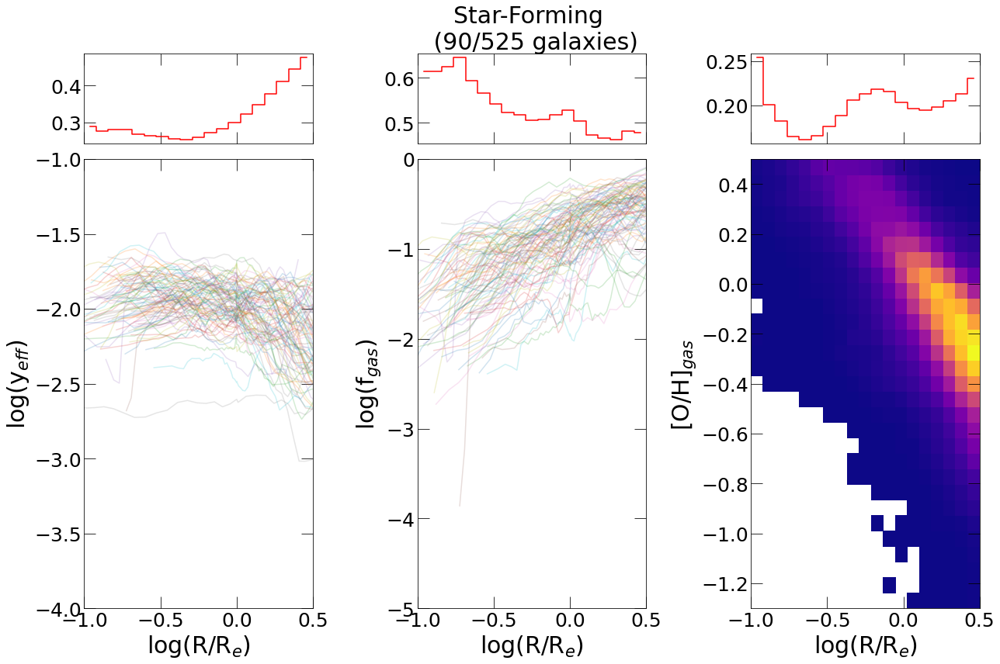

In [33]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-1.0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
        R_e = halfmass_rad_stars(id, redshift)
        big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
        big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
        big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
        big_h3 += h3

        # calculate statistic for profile
        n_bins = 50
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(np.log10(R_star/R_e), (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(np.log10(R_star/R_e), np.log10(y_eff), 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(np.log10(R_star/R_e), np.log10(f_gas), 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(-1, 0.5)
#     ax[0].set_xscale('log')
#     ax[0].set_xticks([0.2, 1, 10], minor=False)
#     ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-4, -1)
# ax1.set_yscale('log')
ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
ax1.set_xlabel('log(R/R$_e$)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(-1, 0.5)
#     ax[1].set_xscale('log')
#     ax[1].set_xticks([0.2, 1, 10], minor=False)
#     ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-5, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('log(R/R$_e$)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(-1, 0.5)
#     ax[2].set_xscale('log')
#     ax[2].set_xticks([0.2, 1, 10], minor=False)
#     ax[2].set_xticklabels(['0.2', '1', '10'])
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax3.set_ylim(-1.3, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

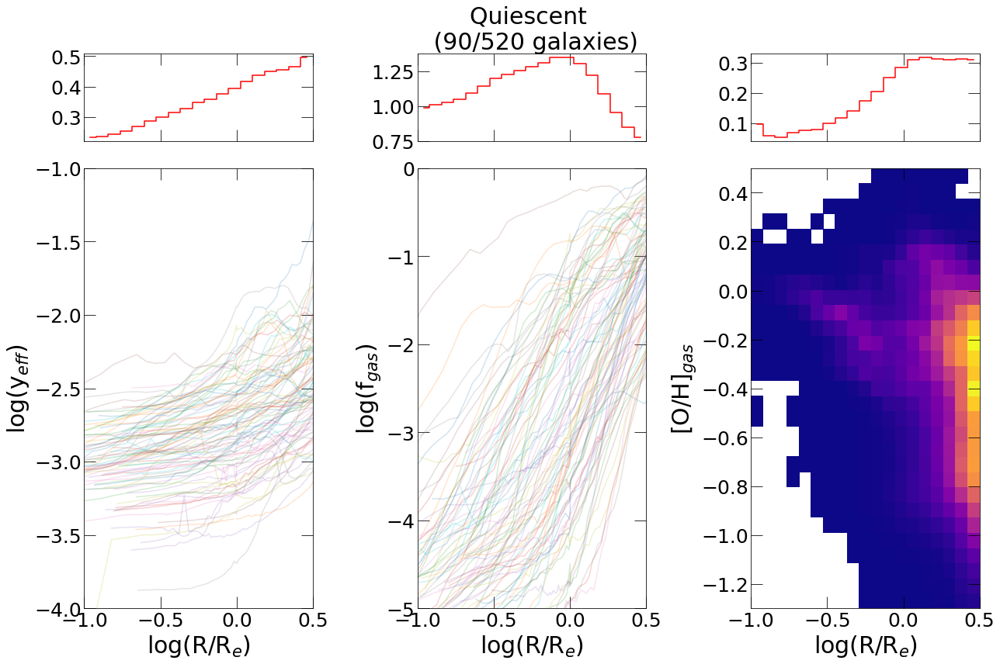

In [34]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-1.0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
        R_e = halfmass_rad_stars(id, redshift)
        big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
        big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
        big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
        big_h3 += h3

        # calculate statistic for profile
        n_bins = 50
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(np.log10(R_star/R_e), (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(np.log10(R_star/R_e), np.log10(y_eff), 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(np.log10(R_star/R_e), np.log10(f_gas), 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(-1, 0.5)
#     ax[0].set_xscale('log')
#     ax[0].set_xticks([0.2, 1, 10], minor=False)
#     ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-4, -1)
# ax1.set_yscale('log')
ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
ax1.set_xlabel('log(R/R$_e$)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(-1, 0.5)
#     ax[1].set_xscale('log')
#     ax[1].set_xticks([0.2, 1, 10], minor=False)
#     ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-5, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('log(R/R$_e$)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(-1, 0.5)
#     ax[2].set_xscale('log')
#     ax[2].set_xticks([0.2, 1, 10], minor=False)
#     ax[2].set_xticklabels(['0.2', '1', '10'])
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax3.set_ylim(-1.3, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

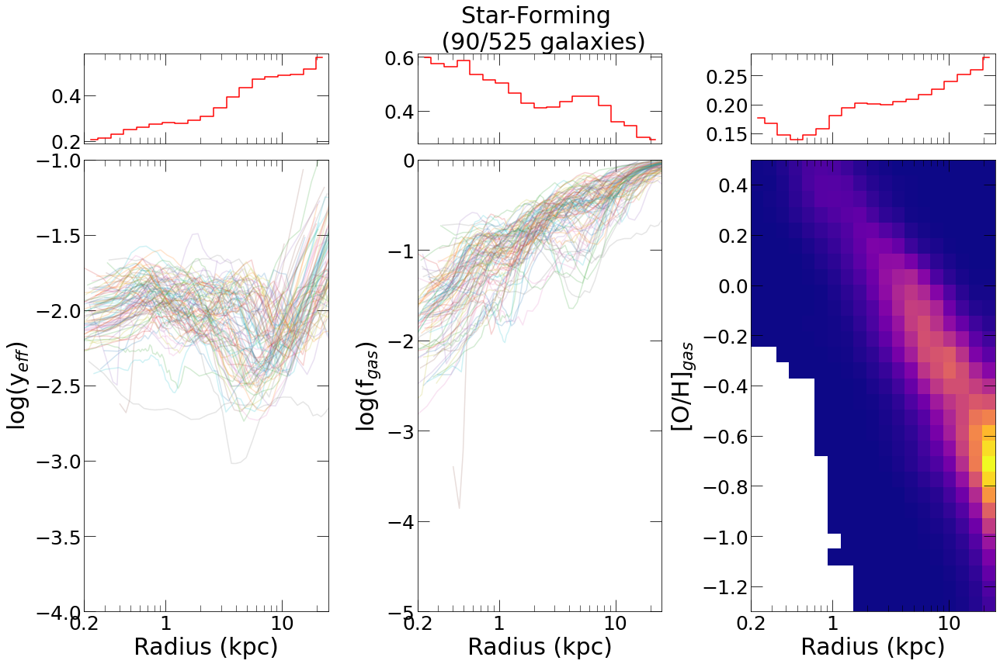

In [32]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
        big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
        big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, _, _ = np.histogram2d(R, OH_gas, bins=[xbins, metalbins], density=False)
        big_h3 += h3

        # calculate statistic for profile
        n_bins = 50
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-4, -1)
# ax1.set_yscale('log')
ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-5, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(0.2, 25)
    ax[2].set_xscale('log')
    ax[2].set_xticks([0.2, 1, 10], minor=False)
    ax[2].set_xticklabels(['0.2', '1', '10'])
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax3.set_ylim(-1.3, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

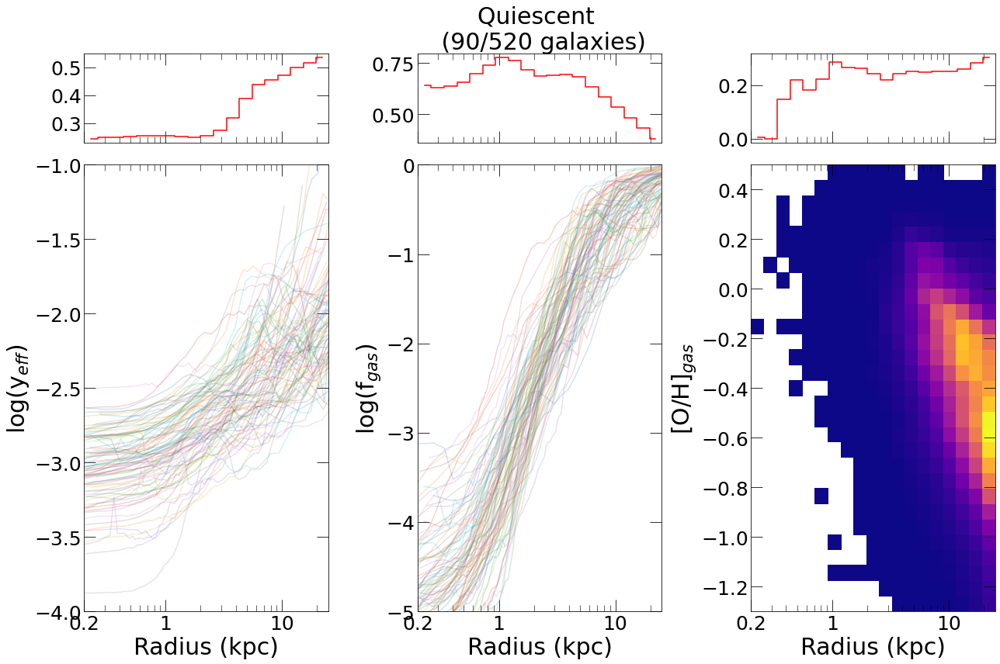

In [30]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
        big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
        big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, _, _ = np.histogram2d(R, OH_gas, bins=[xbins, metalbins], density=False)
        big_h3 += h3

        # calculate statistic for profile
        n_bins = 50
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-4, -1)
# ax1.set_yscale('log')
ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-5, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(0.2, 25)
    ax[2].set_xscale('log')
    ax[2].set_xticks([0.2, 1, 10], minor=False)
    ax[2].set_xticklabels(['0.2', '1', '10'])
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax3.set_ylim(-1.3, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

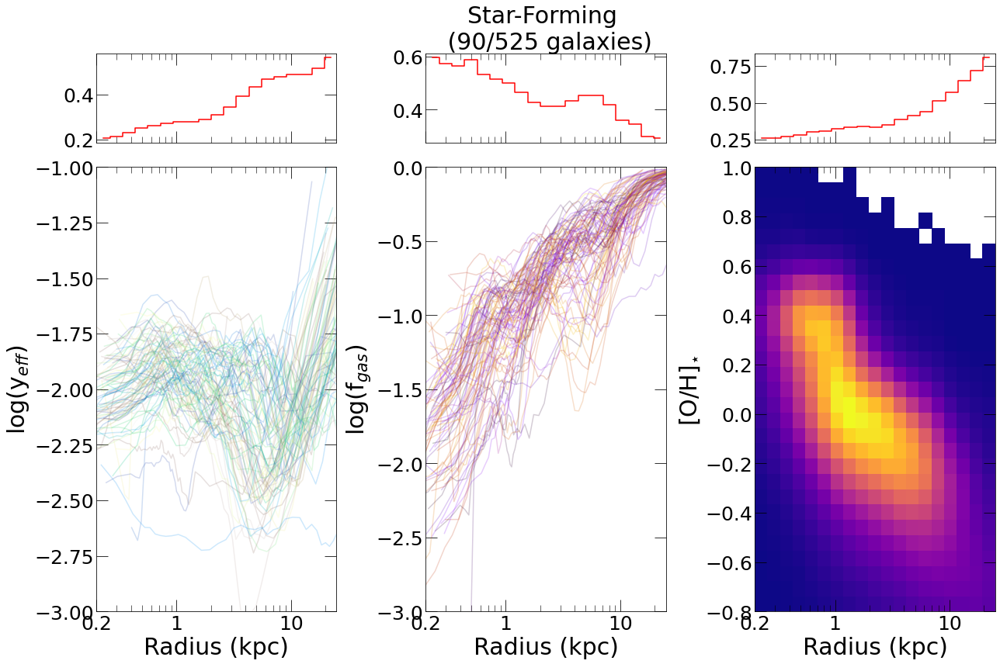

In [25]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap1 = plt.get_cmap('terrain')
colormap2 = plt.get_cmap('gnuplot')
norm = colors.Normalize(vmin=0, vmax=30)
colormap = plt.get_cmap('plasma')
norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-0.8, 1, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
#         R_e = halfmass_rad_stars(id, redshift)
        big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
        big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_star = np.concatenate((big_OH_star, OH_star), axis=None)
        h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
        big_h3 += h3

        # calculate statistic for profile
        n_bins = 50
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
        xx = percentiles[:-1]
        
        number = randrange(30)
        color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
        color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
        ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_R_star, big_OH_star, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-3, -1)
# ax1.set_yscale('log')
ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-3, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm_plasma(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(0.2, 25)
    ax[2].set_xscale('log')
    ax[2].set_xticks([0.2, 1, 10], minor=False)
    ax[2].set_xticklabels(['0.2', '1', '10'])
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{\star}$', fontsize=fts)
ax3.set_ylim(-0.8, 1)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\yeff.png', dpi=100)

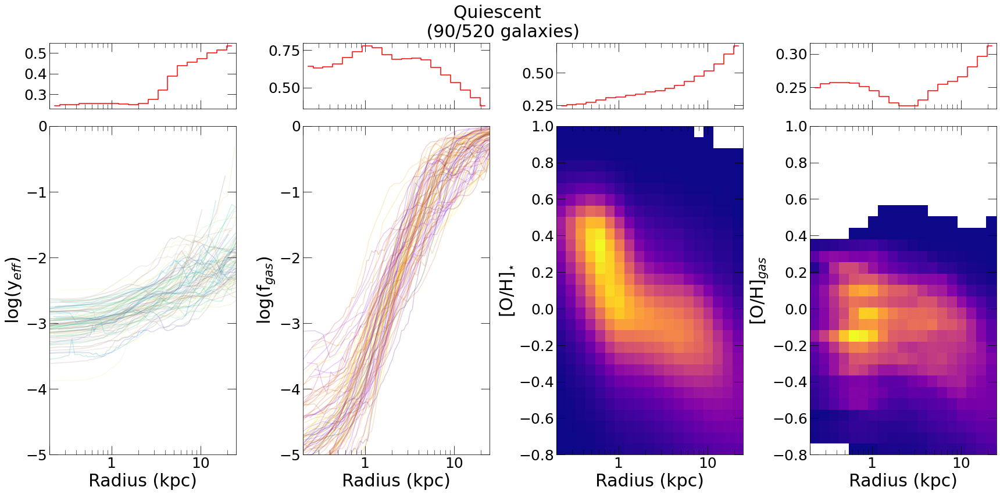

In [47]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange

#metallicity profiles
f, (axes) = plt.subplots(2, 4, sharex='none', sharey='none', figsize=(24, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
ax4 = axes[1][3]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]
sc4 = axes[0][3]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap1 = plt.get_cmap('terrain')
colormap2 = plt.get_cmap('gnuplot')
norm = colors.Normalize(vmin=0, vmax=30)
colormap = plt.get_cmap('plasma')
norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-0.8, 1, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
#         R_e = halfmass_rad_stars(id, redshift)
        big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
        big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_star = np.concatenate((big_OH_star, OH_star), axis=None)
        big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
        big_h3 += h3
        h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
        big_h4 += h4

        # calculate statistic for profile
        n_bins = 50
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
        xx = percentiles[:-1]
        
        number = randrange(30)
        color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
        color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
        ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_R_star, big_OH_star, 'std', bins=xbins)
stat4, _, _ = stats.binned_statistic(big_R_star, big_OH_gas, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(xbins_new, stat3, 'r', where='mid')
sc4.step(xbins_new, stat4, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-5, 0)
# ax1.set_yscale('log')
ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-5, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm_plasma(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(0.2, 25)
    ax[2].set_xscale('log')
    ax[2].set_xticks([0.2, 1, 10], minor=False)
    ax[2].set_xticklabels(['', '1', '10'])
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{\star}$', fontsize=fts)
ax3.set_ylim(-0.8, 1)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h4[big_h4==0] = np.nan
color=colormap(norm_plasma(big_h4)).tolist()
color = tuple(color[0][:])
ax4.pcolormesh(xbins, metalbins, big_h4.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[3].set_xlim(0.2, 25)
    ax[3].set_xscale('log')
    ax[3].set_xticks([0.2, 1, 10], minor=False)
    ax[3].set_xticklabels(['', '1', '10'])
    ax[3].tick_params(which='major', length=15)
    ax[3].tick_params(which='minor', length=8)
    ax[3].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax4.set_ylim(-0.8, 1)

f.suptitle('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\yeff_quiescent.png', dpi=100)

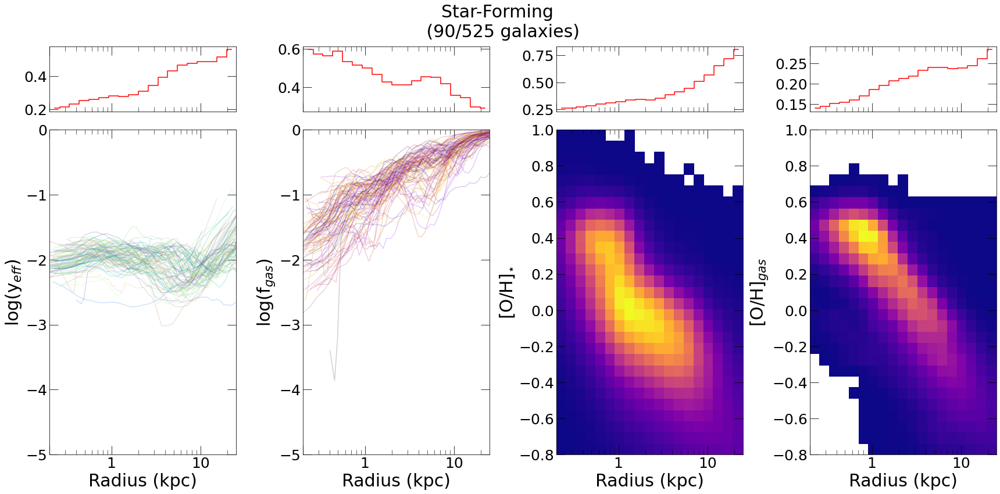

In [55]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange

#metallicity profiles
f, (axes) = plt.subplots(2, 4, sharex='none', sharey='none', figsize=(24, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
ax4 = axes[1][3]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]
sc4 = axes[0][3]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap1 = plt.get_cmap('terrain')
colormap2 = plt.get_cmap('gnuplot')
norm = colors.Normalize(vmin=0, vmax=30)
colormap = plt.get_cmap('plasma')
norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-0.8, 1, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
#         R_e = halfmass_rad_stars(id, redshift)
        big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
        big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_star = np.concatenate((big_OH_star, OH_star), axis=None)
        big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
        big_h3 += h3
        h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
        big_h4 += h4

        # calculate statistic for profile
        n_bins = 50
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
        xx = percentiles[:-1]
        
        number = randrange(30)
        color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
        color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
        ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_R_star, big_OH_star, 'std', bins=xbins)
stat4, _, _ = stats.binned_statistic(big_R_star, big_OH_gas, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(xbins_new, stat3, 'r', where='mid')
sc4.step(xbins_new, stat4, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-5, 0)
# ax1.set_yscale('log')
ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-5, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm_plasma(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(0.2, 25)
    ax[2].set_xscale('log')
    ax[2].set_xticks([0.2, 1, 10], minor=False)
    ax[2].set_xticklabels(['', '1', '10'])
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{\star}$', fontsize=fts)
ax3.set_ylim(-0.8, 1)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h4[big_h4==0] = np.nan
color=colormap(norm_plasma(big_h4)).tolist()
color = tuple(color[0][:])
ax4.pcolormesh(xbins, metalbins, big_h4.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[3].set_xlim(0.2, 25)
    ax[3].set_xscale('log')
    ax[3].set_xticks([0.2, 1, 10], minor=False)
    ax[3].set_xticklabels(['', '1', '10'])
    ax[3].tick_params(which='major', length=15)
    ax[3].tick_params(which='minor', length=8)
    ax[3].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax4.set_ylim(-0.8, 1)

f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\yeff.png', dpi=100)

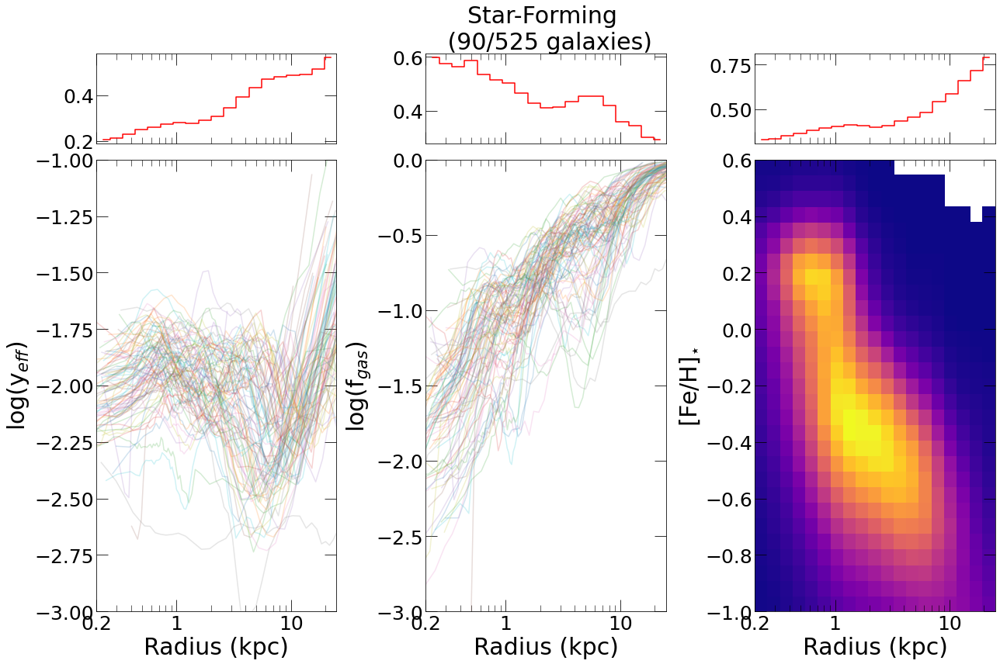

In [29]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1, 0.6, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_star = starmetals_only(id=id, redshift=redshift, num='iron', den='hydrogen')
#         R_e = halfmass_rad_stars(id, redshift)
        big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
        big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_star = np.concatenate((big_OH_star, OH_star), axis=None)
        h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
        big_h3 += h3

        # calculate statistic for profile
        n_bins = 50
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_R_star, big_OH_star, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-3, -1)
# ax1.set_yscale('log')
ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-3, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(0.2, 25)
    ax[2].set_xscale('log')
    ax[2].set_xticks([0.2, 1, 10], minor=False)
    ax[2].set_xticklabels(['0.2', '1', '10'])
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[Fe/H]$_{\star}$', fontsize=fts)
ax3.set_ylim(-1, 0.6)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\yeffFeH.png', dpi=100)

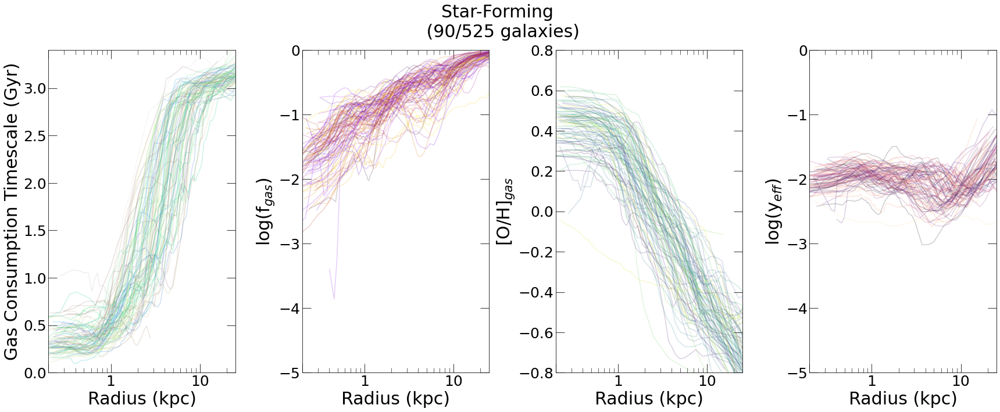

In [33]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange

#metallicity profiles
f, (axes) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10), constrained_layout=True)
ax3 = axes[0]
ax2 = axes[1]
ax4 = axes[2]
ax1 = axes[3]
# sc1 = axes[0][0]
# sc2 = axes[0][1]
# sc3 = axes[0][2]
# sc4 = axes[0][3]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap3 = plt.get_cmap('terrain')
colormap2 = plt.get_cmap('gnuplot')
colormap4 = plt.get_cmap('viridis')
colormap1 = plt.get_cmap('magma')
norm = colors.Normalize(vmin=0, vmax=30)
colormap = plt.get_cmap('plasma')
norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-0.8, 1, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        gas_con, _ = gas_consumption(id=id, redshift=redshift, follow_stars=True)
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
#         R_e = halfmass_rad_stars(id, redshift)
        big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
        big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_gas = np.concatenate((big_gas, gas_con*10**-9), axis=None)
        big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
#         big_h4 += h4

        # calculate statistic for profile
        n_bins = 50
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
        stat3, _, _ = scipy.stats.binned_statistic(R_star, gas_con*10**-9, 'median', bins=percentiles)
        stat4, _, _ = scipy.stats.binned_statistic(R_star, OH_gas, 'median', bins=percentiles)
        xx = percentiles[:-1]
        
        
        number = randrange(30)
        color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
        color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
        color3 = colormap3(norm(number))
        color4 = colormap4(norm(number))
        ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)
        ax3.plot(xx[1:], stat3[1:], color=color3, alpha = 0.2)
        ax4.plot(xx[1:], stat4[1:], color=color4, alpha = 0.2)

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[0].set_xlim(0.2, 25)
#     ax[0].set_xscale('log')
#     ax[0].set_xticks([0.2, 1, 10], minor=False)
#     ax[0].set_xticklabels(['', '1', '10'])
#     ax[0].tick_params(which='major', length=15)
#     ax[0].tick_params(which='minor', length=8)
#     ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-5, 0)
# ax1.set_yscale('log')
ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax.set_xlim(0.2, 25)
    ax.set_xscale('log')
    ax.set_xticks([0.2, 1, 10], minor=False)
    ax.set_xticklabels(['', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-5, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm_plasma(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0.2, 25)
#     ax[2].set_xscale('log')
#     ax[2].set_xticks([0.2, 1, 10], minor=False)
#     ax[2].set_xticklabels(['', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('Gas Consumption Timescale (Gyr)', fontsize=fts)
ax3.set_ylim(0, 3.4)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

# big_h4[big_h4==0] = np.nan
# color=colormap(norm_plasma(big_h4)).tolist()
# color = tuple(color[0][:])
# ax4.pcolormesh(xbins, metalbins, big_h4.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[3].set_xlim(0.2, 25)
#     ax[3].set_xscale('log')
#     ax[3].set_xticks([0.2, 1, 10], minor=False)
#     ax[3].set_xticklabels(['', '1', '10'])
#     ax[3].tick_params(which='major', length=15)
#     ax[3].tick_params(which='minor', length=8)
#     ax[3].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax4.set_ylim(-0.8, 0.8)

f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\yeff.png', dpi=100)

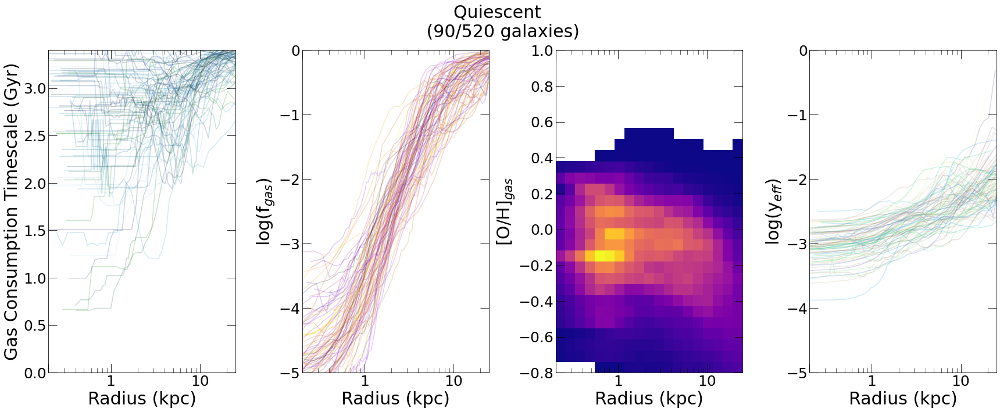

In [6]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange

#metallicity profiles
f, (axes) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10), constrained_layout=True)
ax3 = axes[0]
ax2 = axes[1]
ax4 = axes[2]
ax1 = axes[3]
# sc1 = axes[0][0]
# sc2 = axes[0][1]
# sc3 = axes[0][2]
# sc4 = axes[0][3]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap1 = plt.get_cmap('terrain')
colormap2 = plt.get_cmap('gnuplot')
colormap3 = plt.get_cmap('ocean')
norm = colors.Normalize(vmin=0, vmax=30)
colormap = plt.get_cmap('plasma')
norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-0.8, 1, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
# big_f_gas = np.zeros(0)
# big_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        gas_con, _ = gas_consumption(id=id, redshift=redshift, follow_stars=True)
        if type(gas_con) == int:
            pass
        else:
            OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
    #         R_e = halfmass_rad_stars(id, redshift)
    #         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
            big_R = np.concatenate((big_R, R), axis=None)
            big_R_star = np.concatenate((big_R_star, R_star), axis=None)
    #         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
    #         big_gas = np.concatenate((big_gas, gas_con*10**-9), axis=None)
            big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
            h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
            big_h4 += h4

            # calculate statistic for profile
            n_bins = 50
            percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
            for i in range(1, (n_bins+1)):
                percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
            percentiles.sort()
            stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
            stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
            stat3, _, _ = scipy.stats.binned_statistic(R_star, gas_con*10**-9, 'median', bins=percentiles)
            xx = percentiles[:-1]


            number = randrange(30)
            color1 = colormap1(norm(number))
    #         color1 = tuple(color1[0][:])
            color2 = colormap2(norm(number))
    #         color2 = tuple(color2[0][:])
            color3 = colormap3(norm(number))
            ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
            ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)
            ax3.plot(xx[3:], stat3[3:], color=color3, alpha = 0.2)

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[0].set_xlim(0.2, 25)
#     ax[0].set_xscale('log')
#     ax[0].set_xticks([0.2, 1, 10], minor=False)
#     ax[0].set_xticklabels(['', '1', '10'])
#     ax[0].tick_params(which='major', length=15)
#     ax[0].tick_params(which='minor', length=8)
#     ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-5, 0)
# ax1.set_yscale('log')
ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax.set_xlim(0.2, 25)
    ax.set_xscale('log')
    ax.set_xticks([0.2, 1, 10], minor=False)
    ax.set_xticklabels(['', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-5, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm_plasma(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0.2, 25)
#     ax[2].set_xscale('log')
#     ax[2].set_xticks([0.2, 1, 10], minor=False)
#     ax[2].set_xticklabels(['', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('Gas Consumption Timescale (Gyr)', fontsize=fts)
ax3.set_ylim(0, 3.4)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h4[big_h4==0] = np.nan
color=colormap(norm_plasma(big_h4)).tolist()
color = tuple(color[0][:])
ax4.pcolormesh(xbins, metalbins, big_h4.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[3].set_xlim(0.2, 25)
#     ax[3].set_xscale('log')
#     ax[3].set_xticks([0.2, 1, 10], minor=False)
#     ax[3].set_xticklabels(['', '1', '10'])
#     ax[3].tick_params(which='major', length=15)
#     ax[3].tick_params(which='minor', length=8)
#     ax[3].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax4.set_ylim(-0.8, 1)

f.suptitle('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\yeff_quiescent.png', dpi=100)

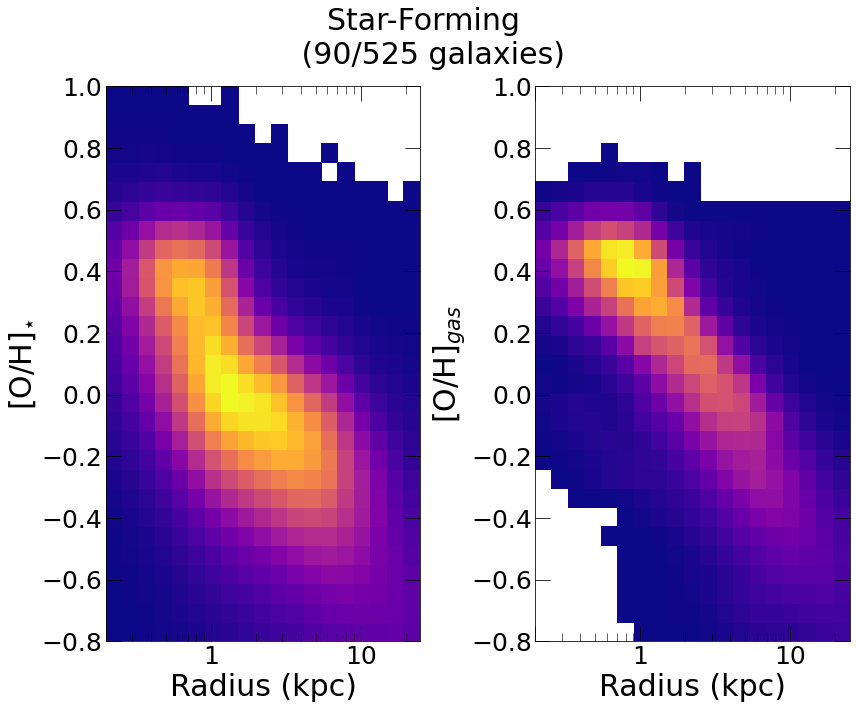

In [8]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange

#metallicity profiles
f, (axes) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(12, 10), constrained_layout=True)
ax3 = axes[0]
ax4 = axes[1]
# ax3 = axes[2]
# ax4 = axes[3]
# sc1 = axes[0][0]
# sc2 = axes[0][1]
# sc3 = axes[0][2]
# sc4 = axes[0][3]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap1 = plt.get_cmap('terrain')
colormap2 = plt.get_cmap('gnuplot')
norm = colors.Normalize(vmin=0, vmax=30)
colormap = plt.get_cmap('plasma')
norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-0.8, 1, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_star = np.concatenate((big_OH_star, OH_star), axis=None)
        big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
        big_h3 += h3
        h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
        big_h4 += h4

        # calculate statistic for profile
#         n_bins = 50
#         percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
#         xx = percentiles[:-1]
        
#         number = randrange(30)
#         color1 = colormap1(norm(number))
# #         color1 = tuple(color1[0][:])
#         color2 = colormap2(norm(number))
# #         color2 = tuple(color2[0][:])
#         ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
#         ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)


# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(0.2, 25)
    ax.set_xscale('log')
    ax.set_xticks([0.2, 1, 10], minor=False)
    ax.set_xticklabels(['', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_ylim(-5, 0)
# # ax1.set_yscale('log')
# ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
# ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)


big_h3[big_h3==0] = np.nan
color=colormap(norm_plasma(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{\star}$', fontsize=fts)
ax3.set_ylim(-0.8, 1)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h4[big_h4==0] = np.nan
color=colormap(norm_plasma(big_h4)).tolist()
color = tuple(color[0][:])
ax4.pcolormesh(xbins, metalbins, big_h4.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax4.set_ylim(-0.8, 1)

f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\OH_starforming.png', dpi=100)

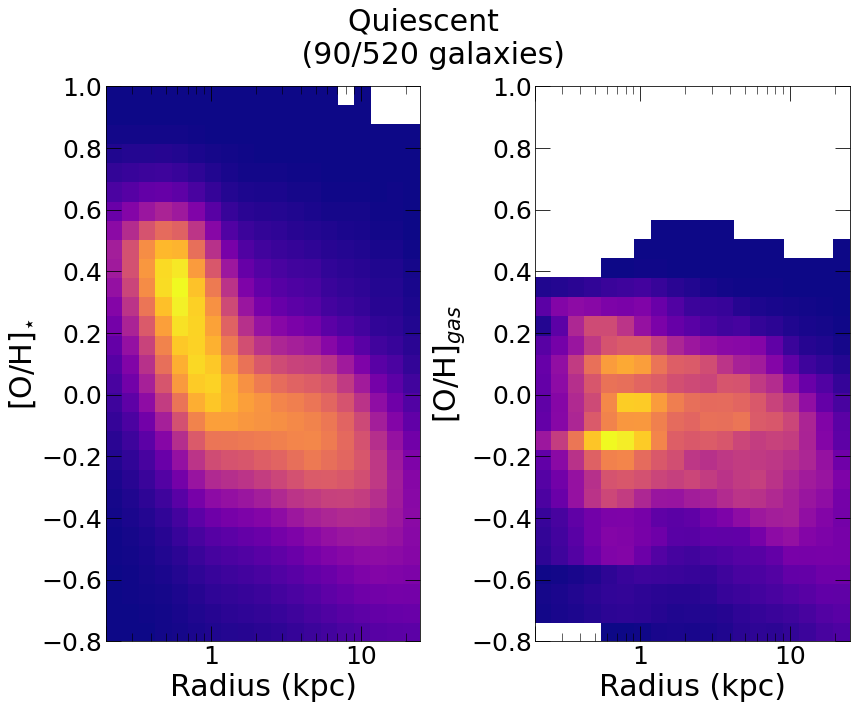

In [10]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange

#metallicity profiles
f, (axes) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(12, 10), constrained_layout=True)
ax3 = axes[0]
ax4 = axes[1]
# ax3 = axes[2]
# ax4 = axes[3]
# sc1 = axes[0][0]
# sc2 = axes[0][1]
# sc3 = axes[0][2]
# sc4 = axes[0][3]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap1 = plt.get_cmap('terrain')
colormap2 = plt.get_cmap('gnuplot')
norm = colors.Normalize(vmin=0, vmax=30)
colormap = plt.get_cmap('plasma')
norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-0.8, 1, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_star = np.concatenate((big_OH_star, OH_star), axis=None)
        big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
        big_h3 += h3
        h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
        big_h4 += h4

        # calculate statistic for profile
#         n_bins = 50
#         percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
#         xx = percentiles[:-1]
        
#         number = randrange(30)
#         color1 = colormap1(norm(number))
# #         color1 = tuple(color1[0][:])
#         color2 = colormap2(norm(number))
# #         color2 = tuple(color2[0][:])
#         ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
#         ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)


# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(0.2, 25)
    ax.set_xscale('log')
    ax.set_xticks([0.2, 1, 10], minor=False)
    ax.set_xticklabels(['', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_ylim(-5, 0)
# # ax1.set_yscale('log')
# ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
# ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)


big_h3[big_h3==0] = np.nan
color=colormap(norm_plasma(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{\star}$', fontsize=fts)
ax3.set_ylim(-0.8, 1)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h4[big_h4==0] = np.nan
color=colormap(norm_plasma(big_h4)).tolist()
color = tuple(color[0][:])
ax4.pcolormesh(xbins, metalbins, big_h4.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax4.set_ylim(-0.8, 1)

f.suptitle('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\OH_quiescent.png', dpi=100)

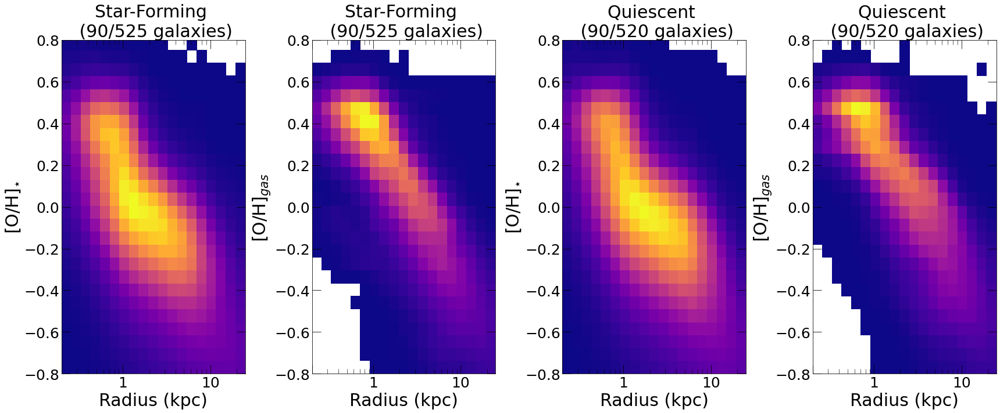

In [34]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange

#metallicity profiles
f, (axes) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10), constrained_layout=True)
ax3 = axes[0]
ax4 = axes[1]
ax5 = axes[2]
ax6 = axes[3]
# sc1 = axes[0][0]
# sc2 = axes[0][1]
# sc3 = axes[0][2]
# sc4 = axes[0][3]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap1 = plt.get_cmap('terrain')
colormap2 = plt.get_cmap('gnuplot')
norm = colors.Normalize(vmin=0, vmax=30)
colormap = plt.get_cmap('plasma')
norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-0.8, 1, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
# big_f_gas = np.zeros(0)
# big_OH_star = np.zeros(0)
# big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_star = np.concatenate((big_OH_star, OH_star), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
        big_h3 += h3
        h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
        big_h4 += h4
        
# QUIESCENT
big_h5 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h6 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_y_eff2 = np.zeros(0)
# big_R2 = np.zeros(0)
# big_R_star2 = np.zeros(0)
# big_f_gas2 = np.zeros(0)
# big_OH_star2 = np.zeros(0)
# big_OH_gas2 = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R2 = np.concatenate((big_R2, R), axis=None)
#         big_R_star2 = np.concatenate((big_R_star, R_star), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_star2 = np.concatenate((big_OH_star2, OH_star), axis=None)
#         big_OH_gas2 = np.concatenate((big_OH_gas2, OH_gas), axis=None)
        h5, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
        big_h5 += h5
        h6, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
        big_h6 += h6


for ax in axes:
    ax.set_xlim(0.2, 25)
    ax.set_xscale('log')
    ax.set_xticks([0.2, 1, 10], minor=False)
    ax.set_xticklabels(['', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
    ax.set_xlabel("Radius (kpc)", fontsize=fts)
# ax1.set_ylim(-5, 0)
# # ax1.set_yscale('log')
# ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
# ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)


big_h3[big_h3==0] = np.nan
color=colormap(norm_plasma(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
ax3.set_title('Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_ylabel('[O/H]$_{\star}$', fontsize=fts)
ax3.set_ylim(-0.8, 0.8)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h4[big_h4==0] = np.nan
color=colormap(norm_plasma(big_h4)).tolist()
color = tuple(color[0][:])
ax4.pcolormesh(xbins, metalbins, big_h4.T, cmap='plasma', color=color, edgecolor=None)
ax4.set_title('Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax4.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax4.set_ylim(-0.8, 0.8)

big_h5[big_h5==0] = np.nan
color=colormap(norm_plasma(big_h5)).tolist()
color = tuple(color[0][:])
ax5.pcolormesh(xbins, metalbins, big_h5.T, cmap='plasma', color=color, edgecolor=None)
ax5.set_title('Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts) #
ax5.set_ylabel('[O/H]$_{\star}$', fontsize=fts)
ax5.set_ylim(-0.8, 0.8)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h6[big_h6==0] = np.nan
color=colormap(norm_plasma(big_h6)).tolist()
color = tuple(color[0][:])
ax6.pcolormesh(xbins, metalbins, big_h6.T, cmap='plasma', color=color, edgecolor=None)
ax6.set_title('Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts) #
ax6.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax6.set_ylim(-0.8, 0.8)

# ax34 = f.add_subplot(121, frameon=False)
# ax34.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# ax56 = f.add_subplot(122, frameon=False)
# ax56.set_title('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)

# f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\OH_both.png', dpi=100)

# 2d age

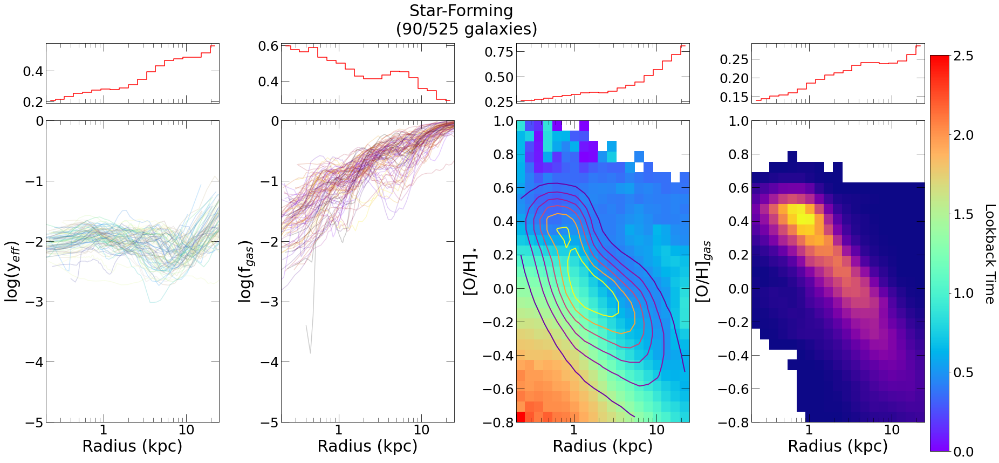

In [56]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange

#metallicity profiles
f, (axes) = plt.subplots(2, 4, sharex='none', sharey='none', figsize=(24, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
ax4 = axes[1][3]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]
sc4 = axes[0][3]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap1 = plt.get_cmap('terrain')
colormap2 = plt.get_cmap('gnuplot')
norm = colors.Normalize(vmin=0, vmax=30)
colormap = plt.get_cmap('plasma')
norm_plasma = colors.Normalize(vmin=vmin, vmax=230)
colormap_age = plt.get_cmap('rainbow')
norm_age = colors.Normalize(vmin=0, vmax=2.5)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-0.8, 1, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
# age_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
big_age = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
#         R_e = halfmass_rad_stars(id, redshift)
        age = get_stellar_age(id, redshift)
        big_age = np.concatenate((big_age, age), axis=None)
        big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
        big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_star = np.concatenate((big_OH_star, OH_star), axis=None)
        big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, xbins_h3, ybins_h3 = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
        big_h3 += h3
#         h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], weights=age)
#         h3count, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
#         h3 /= h3count
#         big_h3 += h3
        h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
        big_h4 += h4
#         age3, _, _ = np.histogram2d(R_star, age, bins=[xbins, metalbins], density=False)
#         age_h3 += age3

        # calculate statistic for profile
        n_bins = 50
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
        xx = percentiles[:-1]
        
        number = randrange(30)
        color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
        color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
        ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)

# age bins
median_age, _, _, _ = stats.binned_statistic_2d(big_R_star, big_OH_star, big_age, statistic='median', bins=[xbins, metalbins])

        
# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_R_star, big_OH_star, 'std', bins=xbins)
stat4, _, _ = stats.binned_statistic(big_R_star, big_OH_gas, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(xbins_new, stat3, 'r', where='mid')
sc4.step(xbins_new, stat4, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-5, 0)
# ax1.set_yscale('log')
ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-5, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

# median_age[median_age==0] = np.nan
# age_h3[age_h3==0] = np.nan
color_age=colormap(norm_age(median_age)).tolist()
color_age = tuple(color_age[0][:])
ax3.pcolormesh(xbins, metalbins, median_age.T, cmap='rainbow', color=color_age, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
big_h3[big_h3==0] = np.nan
color=colormap(norm_plasma(big_h3)).tolist()
color = tuple(color[0][:])
# xx, yy = np.meshgrid(xbins, metalbins)
ax3.contour(xbins_new, metalbins_new, big_h3.T, extent=[0.2, 25, -0.8, 1], linewidths=2, levels=7, colors=color) #extent=[xbins_h3[0], xbins_h3[-1], ybins_h3[0], ybins_h3[-1]], linewidths=2, levels=5, colors=color)
for ax in axes:
    ax[2].set_xlim(0.2, 25)
    ax[2].set_xscale('log')
    ax[2].set_xticks([0.2, 1, 10], minor=False)
    ax[2].set_xticklabels(['', '1', '10'])
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{\star}$', fontsize=fts)
ax3.set_ylim(-0.8, 1)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h4[big_h4==0] = np.nan
color=colormap(norm_plasma(big_h4)).tolist()
color = tuple(color[0][:])
ax4.pcolormesh(xbins, metalbins, big_h4.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[3].set_xlim(0.2, 25)
    ax[3].set_xscale('log')
    ax[3].set_xticks([0.2, 1, 10], minor=False)
    ax[3].set_xticklabels(['', '1', '10'])
    ax[3].tick_params(which='major', length=15)
    ax[3].tick_params(which='minor', length=8)
    ax[3].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax4.set_ylim(-0.8, 1)

# colorbar
cax = f.add_axes([1.0, 0.02, 0.02, 0.85])
sm = plt.cm.ScalarMappable(cmap=colormap_age, norm=norm_age)
sm.set_array([])
cbar = f.colorbar(sm, cax=cax) #ax=axes.ravel().tolist())
cbar.set_label('Lookback Time', fontsize=ftss, rotation=270, labelpad=40)
cbar.ax.tick_params(labelsize=ftss)

f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

# plt.savefig('2022 FIGURES\yeff.png', dpi=100)

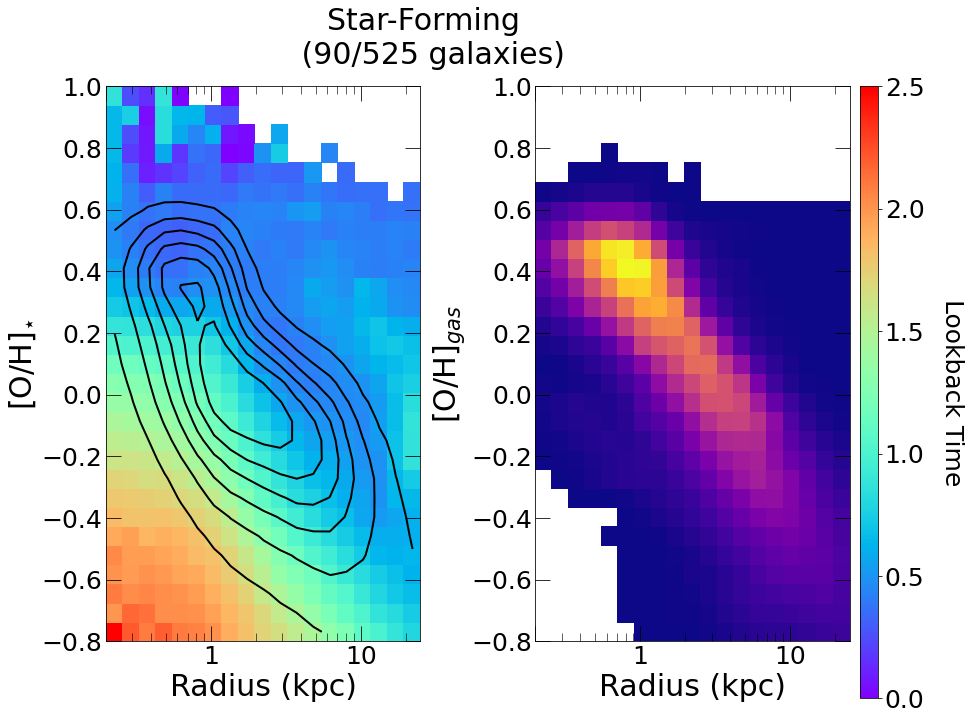

In [5]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange

#metallicity profiles
f, (axes) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(12, 10), constrained_layout=True)
ax3 = axes[0]
ax4 = axes[1]
# ax3 = axes[2]
# ax4 = axes[3]
# sc1 = axes[0][0]
# sc2 = axes[0][1]
# sc3 = axes[0][2]
# sc4 = axes[0][3]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap1 = plt.get_cmap('terrain')
colormap2 = plt.get_cmap('gnuplot')
norm = colors.Normalize(vmin=0, vmax=30)
colormap = plt.get_cmap('plasma')
norm_plasma = colors.Normalize(vmin=vmin, vmax=230)
colormap_age = plt.get_cmap('rainbow')
norm_age = colors.Normalize(vmin=0, vmax=2.5)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-0.8, 1, 30)
densitybins2 = np.linspace(1.5, 12, 20)

xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
metalbins_new = (metalbins[1:]+metalbins[:-1])/2

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
# age_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
big_age = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
#         R_e = halfmass_rad_stars(id, redshift)
        age = get_stellar_age(id, redshift)
        big_age = np.concatenate((big_age, age), axis=None)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_star = np.concatenate((big_OH_star, OH_star), axis=None)
        big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, xbins_h3, ybins_h3 = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
        big_h3 += h3
#         h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], weights=age)
#         h3count, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
#         h3 /= h3count
#         big_h3 += h3
        h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
        big_h4 += h4
#         age3, _, _ = np.histogram2d(R_star, age, bins=[xbins, metalbins], density=False)
#         age_h3 += age3


# age bins
median_age, _, _, _ = stats.binned_statistic_2d(big_R_star, big_OH_star, big_age, statistic='median', bins=[xbins, metalbins])


# median_age[median_age==0] = np.nan
# age_h3[age_h3==0] = np.nan
color_age=colormap(norm_age(median_age)).tolist()
color_age = tuple(color_age[0][:])
ax3.pcolormesh(xbins, metalbins, median_age.T, cmap='rainbow', color=color_age, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
big_h3[big_h3==0] = np.nan
color=colormap(norm_plasma(big_h3)).tolist()
color = tuple(color[0][:])
# xx, yy = np.meshgrid(xbins, metalbins)
ax3.contour(xbins_new, metalbins_new, big_h3.T, extent=[0.2, 25, -0.8, 1], linewidths=2, levels=7, colors='black') #extent=[xbins_h3[0], xbins_h3[-1], ybins_h3[0], ybins_h3[-1]], linewidths=2, levels=5, colors=color)
for ax in axes:
    ax.set_xlim(0.2, 25)
    ax.set_xscale('log')
    ax.set_xticks([0.2, 1, 10], minor=False)
    ax.set_xticklabels(['', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{\star}$', fontsize=fts)
ax3.set_ylim(-0.8, 1)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h4[big_h4==0] = np.nan
color=colormap(norm_plasma(big_h4)).tolist()
color = tuple(color[0][:])
ax4.pcolormesh(xbins, metalbins, big_h4.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[3].set_xlim(0.2, 25)
#     ax[3].set_xscale('log')
#     ax[3].set_xticks([0.2, 1, 10], minor=False)
#     ax[3].set_xticklabels(['', '1', '10'])
#     ax[3].tick_params(which='major', length=15)
#     ax[3].tick_params(which='minor', length=8)
#     ax[3].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax4.set_ylim(-0.8, 1)

# colorbar
cax = f.add_axes([1.0, 0.02, 0.02, 0.85])
sm = plt.cm.ScalarMappable(cmap=colormap_age, norm=norm_age)
sm.set_array([])
cbar = f.colorbar(sm, cax=cax) #ax=axes.ravel().tolist())
cbar.set_label('Lookback Time', fontsize=ftss, rotation=270, labelpad=40)
cbar.ax.tick_params(labelsize=ftss)

f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\OHage_starforming.png', dpi=100, bbox_inches='tight')

# cumulative distribution function

[0, 1] 0.04174038224567969 0.40307900309562683
[3, 4] 0.2566613633041328 -0.03143513947725296
[5, 6] 0.2933937225921267 -0.1644022911787033
[10, 11] 0.39734805795322015 -0.37335868179798126


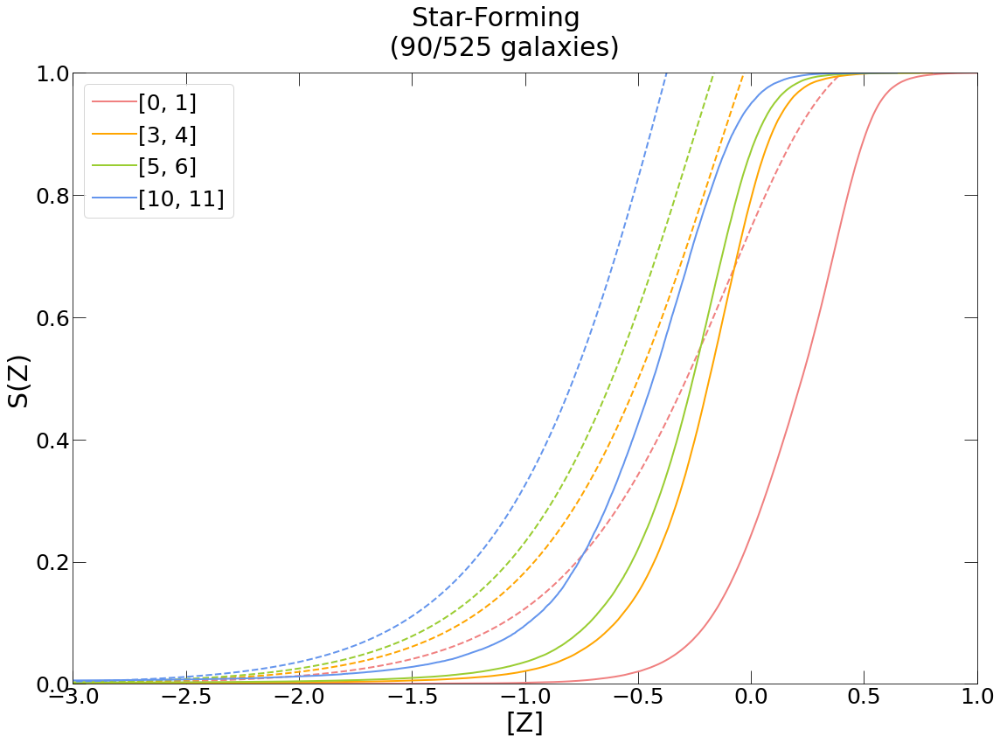

In [53]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange
from dataclasses import dataclass

#metallicity profiles
f, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(16, 12), constrained_layout=True)

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap1 = plt.get_cmap('terrain')
# colormap2 = plt.get_cmap('gnuplot')
# norm = colors.Normalize(vmin=0, vmax=30)
# colormap = plt.get_cmap('plasma')
# norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
# ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
# metalbins = np.linspace(-0.8, 1, 30)
# densitybins2 = np.linspace(1.5, 12, 20)

@dataclass
class CDF:
#     selection: np.ndarray
    label: str
    color: str
    big_R_star: np.array = np.zeros(0)
    big_f_gas: np.array = np.zeros(0)
    big_OH_star: np.array = np.zeros(0)
    big_OH_gas: np.array = np.zeros(0)
            
ranges = [CDF(label='[0, 1]', color='lightcoral'), CDF(label='[3, 4]', color='orange'), CDF(label='[5, 6]', color='yellowgreen'), CDF(label='[10, 11]', color='cornflowerblue')]

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
# big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_y_eff = np.zeros(0)
# big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
#         w = np.where(5<=R_star&R_star<=6)
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
        selection = [(R_star<=1), (3<=R_star)&(R_star<=4), (5<=R_star)&(R_star<=6), (10<=R_star)&(R_star<=11)]
#         rad5_6 = (5<=R_star)&(R_star<=6)
#         rad3_4 = (3<=R_star)&(R_star<=4)
        for i in range(len(selection)):
            radii = ranges[i]
            criteria = selection[i]
            OH_star_new = OH_star[criteria]
            f_gas_new = f_gas[criteria]
#             y_eff_new = y_eff[radii.selection]
            OH_gas_new = OH_gas[criteria]
    #         R_e = halfmass_rad_stars(id, redshift)
    #         big_y_eff = np.concatenate((big_y_eff, y_eff), axis=None)
    #         big_R = np.concatenate((big_R, R), axis=None)
#             radii.big_R_star = np.concatenate((radii.big_R_star, R_star_new), axis=None)
            radii.big_f_gas = np.concatenate((radii.big_f_gas, f_gas_new), axis=None)
            radii.big_OH_star = np.concatenate((radii.big_OH_star, OH_star_new), axis=None)
            radii.big_OH_gas = np.concatenate((radii.big_OH_gas, OH_gas_new), axis=None)
#         h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
#         big_h3 += h3
#         h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
#         big_h4 += h4

        # calculate statistic for profile
#         n_bins = 50
#         percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
#         xx = percentiles[:-1]
        
#         number = randrange(30)
#         color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
#         color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
#         ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
#         ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)

for radii in ranges:
    # CDF
    xx1 = np.sort(radii.big_OH_star)
    yy1 = np.array(range(len(radii.big_OH_star)))/len(radii.big_OH_star)
    ax1.plot(xx1, yy1, '-', label=radii.label, linewidth=2, color=radii.color)

    # model
    xx2 = radii.big_OH_star
    med_f_gas = np.median(radii.big_f_gas)
    med_OH_gas = np.median(radii.big_OH_gas)
    print(radii.label, med_f_gas, med_OH_gas)
    yy2 = (1 - med_f_gas**(10**(radii.big_OH_star-med_OH_gas))) / (1 - med_f_gas)
    # yy2 = (1 - 0.3**(10**(big_OH_star-0.5))) / (1 - 0.3)
    yy2_plot = [yy2 for _, yy2 in sorted(zip(xx2, yy2))]
    ax1.plot(np.sort(xx2), yy2_plot, '--', linewidth=2, color=radii.color)

ax1.set_xlim(-3, 1)
#     ax1.set_xticks([0.2, 1, 10], minor=False)
#     ax1.set_xticklabels(['', '1', '10'])
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(0, 1)
# ax1.set_yscale('log')
ax1.set_ylabel("S(Z)", fontsize=fts)
ax1.set_xlabel('[Z]', fontsize=fts)
ax1.legend(fontsize=ftss, handletextpad=0.1)


f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\CDF_starforming.png', dpi=100)

[0, 1] 3.7474789134982905e-05 -0.09264504164457321
[3, 4] 0.014171699388816357 -0.11390195786952972
[5, 6] 0.05347933695395842 -0.14985673129558563
[10, 11] 0.14387850682652092 -0.24288734793663025


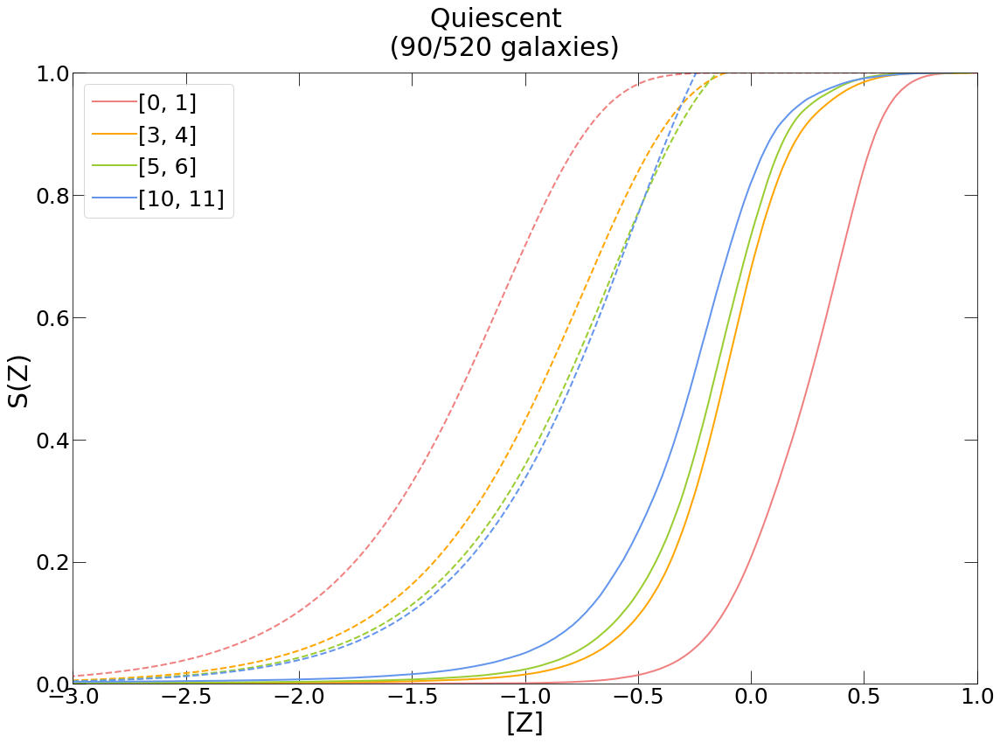

In [65]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange
from dataclasses import dataclass

#metallicity profiles
f, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(16, 12), constrained_layout=True)

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap1 = plt.get_cmap('terrain')
# colormap2 = plt.get_cmap('gnuplot')
# norm = colors.Normalize(vmin=0, vmax=30)
# colormap = plt.get_cmap('plasma')
# norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
# ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
# metalbins = np.linspace(-0.8, 1, 30)
# densitybins2 = np.linspace(1.5, 12, 20)

@dataclass
class CDF:
#     selection: np.ndarray
    label: str
    color: str
    big_R_star: np.array = np.zeros(0)
    big_f_gas: np.array = np.zeros(0)
    big_OH_star: np.array = np.zeros(0)
    big_OH_gas: np.array = np.zeros(0)
            
ranges = [CDF(label='[0, 1]', color='lightcoral'), CDF(label='[3, 4]', color='orange'), CDF(label='[5, 6]', color='yellowgreen'), CDF(label='[10, 11]', color='cornflowerblue')]

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
# big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_y_eff = np.zeros(0)
# big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
#         w = np.where(5<=R_star&R_star<=6)
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
        selection = [(R_star<=1), (3<=R_star)&(R_star<=4), (5<=R_star)&(R_star<=6), (10<=R_star)&(R_star<=11)]
#         rad5_6 = (5<=R_star)&(R_star<=6)
#         rad3_4 = (3<=R_star)&(R_star<=4)
        for i in range(len(selection)):
            radii = ranges[i]
            criteria = selection[i]
            OH_star_new = OH_star[criteria]
            f_gas_new = f_gas[criteria]
#             y_eff_new = y_eff[radii.selection]
            OH_gas_new = OH_gas[criteria]
    #         R_e = halfmass_rad_stars(id, redshift)
    #         big_y_eff = np.concatenate((big_y_eff, y_eff), axis=None)
    #         big_R = np.concatenate((big_R, R), axis=None)
#             radii.big_R_star = np.concatenate((radii.big_R_star, R_star_new), axis=None)
            radii.big_f_gas = np.concatenate((radii.big_f_gas, f_gas_new), axis=None)
            radii.big_OH_star = np.concatenate((radii.big_OH_star, OH_star_new), axis=None)
            radii.big_OH_gas = np.concatenate((radii.big_OH_gas, OH_gas_new), axis=None)
#         h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
#         big_h3 += h3
#         h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
#         big_h4 += h4

        # calculate statistic for profile
#         n_bins = 50
#         percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
#         xx = percentiles[:-1]
        
#         number = randrange(30)
#         color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
#         color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
#         ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
#         ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)

for radii in ranges:
    # CDF
    xx1 = np.sort(radii.big_OH_star)
    yy1 = np.array(range(len(radii.big_OH_star)))/len(radii.big_OH_star)
    ax1.plot(xx1, yy1, '-', label=radii.label, linewidth=2, color=radii.color)

    # model
    xx2 = radii.big_OH_star
    med_f_gas = np.median(radii.big_f_gas)
    med_OH_gas = np.median(radii.big_OH_gas)
    print(radii.label, med_f_gas, med_OH_gas)
    yy2 = (1 - med_f_gas**(10**(radii.big_OH_star-med_OH_gas))) / (1 - med_f_gas)
    # yy2 = (1 - 0.3**(10**(big_OH_star-0.5))) / (1 - 0.3)
    yy2_plot = [yy2 for _, yy2 in sorted(zip(xx2, yy2))]
    ax1.plot(np.sort(xx2), yy2_plot, '--', linewidth=2, color=radii.color)

ax1.set_xlim(-3, 1)
#     ax1.set_xticks([0.2, 1, 10], minor=False)
#     ax1.set_xticklabels(['', '1', '10'])
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(0, 1)
# ax1.set_yscale('log')
ax1.set_ylabel("S(Z)", fontsize=fts)
ax1.set_xlabel('[Z]', fontsize=fts)
ax1.legend(fontsize=ftss, handletextpad=0.1)


f.suptitle('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

# plt.savefig('2022 FIGURES\yeff.png', dpi=100)

[0, 1] 0.04174038224567969 0.40307900309562683
[$Z_0$] = -0.605
[3, 4] 0.2566613633041328 -0.03143513947725296
[$Z_0$] = -1.016
[10, 11] 0.39734805795322015 -0.37335868179798126
[$Z_0$] = -1.943


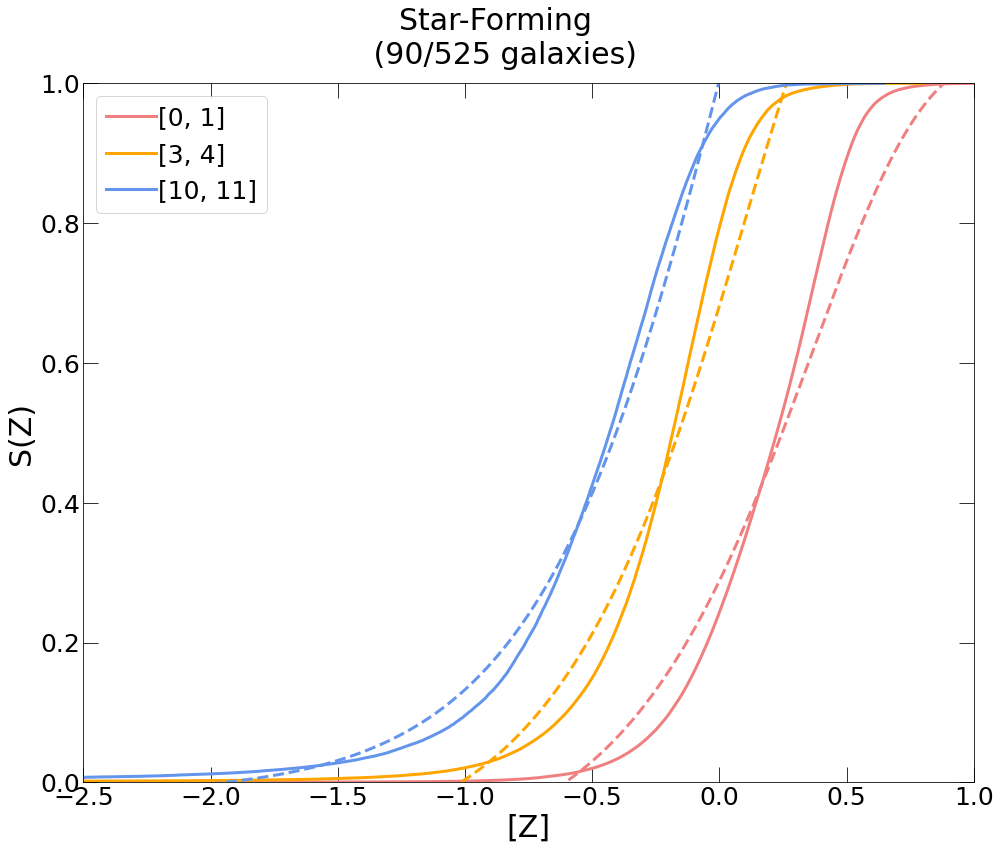

In [10]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange
from dataclasses import dataclass
import scipy.optimize as opt

#metallicity profiles
f, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(14, 12), constrained_layout=True)

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap1 = plt.get_cmap('terrain')
# colormap2 = plt.get_cmap('gnuplot')
# norm = colors.Normalize(vmin=0, vmax=30)
# colormap = plt.get_cmap('plasma')
# norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
# ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
# metalbins = np.linspace(-0.8, 1, 30)
# densitybins2 = np.linspace(1.5, 12, 20)

@dataclass
class CDF:
#     selection: np.ndarray
    label: str
    color: str
    big_R_star: np.array = np.zeros(0)
    big_f_gas: np.array = np.zeros(0)
    big_OH_star: np.array = np.zeros(0)
    big_OH_gas: np.array = np.zeros(0)
            
ranges = [CDF(label='[0, 1]', color='lightcoral'), CDF(label='[3, 4]', color='orange'), CDF(label='[10, 11]', color='cornflowerblue')]
          #, CDF(label='[5, 6]', color='yellowgreen')

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
# big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_y_eff = np.zeros(0)
# big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
#         w = np.where(5<=R_star&R_star<=6)
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
        selection = [(R_star<=1), (3<=R_star)&(R_star<=4), (10<=R_star)&(R_star<=11)]
#         rad5_6 = (5<=R_star)&(R_star<=6)
#         rad3_4 = (3<=R_star)&(R_star<=4)
        for i in range(len(selection)):
            radii = ranges[i]
            criteria = selection[i]
            OH_star_new = OH_star[criteria]
            f_gas_new = f_gas[criteria]
#             y_eff_new = y_eff[radii.selection]
            OH_gas_new = OH_gas[criteria]
    #         R_e = halfmass_rad_stars(id, redshift)
    #         big_y_eff = np.concatenate((big_y_eff, y_eff), axis=None)
    #         big_R = np.concatenate((big_R, R), axis=None)
#             radii.big_R_star = np.concatenate((radii.big_R_star, R_star_new), axis=None)
            radii.big_f_gas = np.concatenate((radii.big_f_gas, f_gas_new), axis=None)
            radii.big_OH_star = np.concatenate((radii.big_OH_star, OH_star_new), axis=None)
            radii.big_OH_gas = np.concatenate((radii.big_OH_gas, OH_gas_new), axis=None)
#         h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
#         big_h3 += h3
#         h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
#         big_h4 += h4

        # calculate statistic for profile
#         n_bins = 50
#         percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
#         xx = percentiles[:-1]
        
#         number = randrange(30)
#         color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
#         color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
#         ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
#         ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)


def func(Z, Z0):
    S = (1 - mu1**((Z-Z0)/(Z1-Z0))) / (1 - mu1)
    return S


# Z1_array = [10**0.75, 10**0.25, 10**0.15, 10**(0.15)]
Z1_array = [10**0.883, 10**0.264, 10**(-0.003)] #, 10**0.176
idx = -1
for radii in ranges:
    idx += 1
    Z1 = Z1_array[idx]
    # CDF
    xx1 = np.sort(radii.big_OH_star)
    yy1 = np.array(range(len(radii.big_OH_star)))/len(radii.big_OH_star)
    ax1.plot(xx1, yy1, '-', label=radii.label, linewidth=3, color=radii.color)

    # model
    mu1 = np.median(radii.big_f_gas)
    med_OH_gas = np.median(radii.big_OH_gas)
    print(radii.label, mu1, med_OH_gas)
#     Z0 = np.linspace(-0.5, 1, 5)
#     Z = 10**radii.big_OH_star
#     Z1 = 10**0.7 #med_OH_gas
#     xx2 = radii.big_OH_star
#     med_f_gas = 0.002
#     for thing in Z0:
#         yy2 = (1 - med_f_gas**((Z-thing)/(Z1-thing))) / (1 - med_f_gas)
#         # yy2 = (1 - 0.3**(10**(big_OH_star-0.5))) / (1 - 0.3)
#         yy2_plot = [yy2 for _, yy2 in sorted(zip(xx2, yy2))]
#         ax1.plot(np.sort(xx2), yy2_plot, '--', linewidth=2, label=str(thing))#color=radii.color)
#     idx = np.random.choice(np.arange(len(xx1)), 1000, replace=False)
    if idx==2:
        optParam, pcov = opt.curve_fit(func, 10**xx1, yy1, maxfev=5000, bounds=([-np.inf, 1]), p0=0)
    else:
        optParam, pcov = opt.curve_fit(func, 10**xx1, yy1, maxfev=5000)
    
    ax1.plot(xx1, func(10**xx1, *optParam), '--', color=radii.color, linewidth=3)
    print('[$Z_0$] = %5.3f' % np.log10(optParam))


ax1.set_xlim(-2.5, 1)
#     ax1.set_xticks([0.2, 1, 10], minor=False)
#     ax1.set_xticklabels(['', '1', '10'])
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(0, 1)
# ax1.set_yscale('log')
ax1.set_ylabel("S(Z)", fontsize=fts)
ax1.set_xlabel('[Z]', fontsize=fts)
ax1.legend(fontsize=ftss, handletextpad=0.1)


f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\CDF_starforming_Z0.png', dpi=100)

[10, 11] 0.39734805795322015 -0.37335868179798126
[$Z_0$] = -1.943


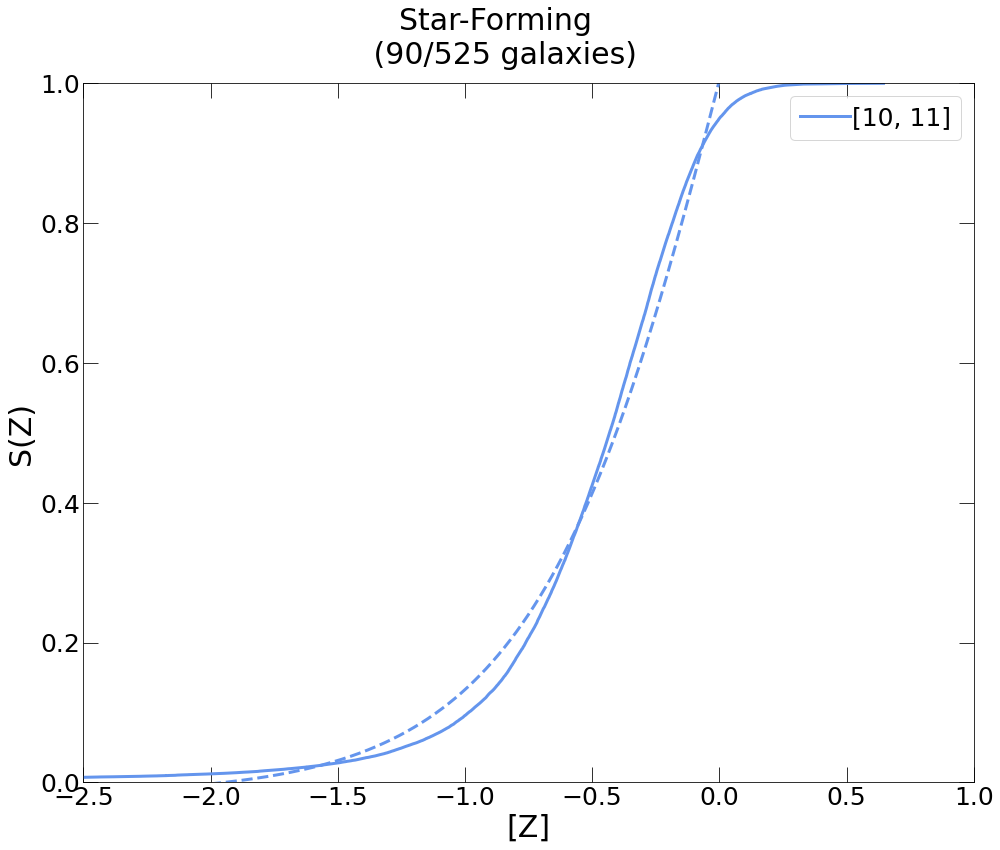

In [9]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange
from dataclasses import dataclass
import scipy.optimize as opt

#metallicity profiles
f, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(14, 12), constrained_layout=True)

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap1 = plt.get_cmap('terrain')
# colormap2 = plt.get_cmap('gnuplot')
# norm = colors.Normalize(vmin=0, vmax=30)
# colormap = plt.get_cmap('plasma')
# norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
# ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
# metalbins = np.linspace(-0.8, 1, 30)
# densitybins2 = np.linspace(1.5, 12, 20)

@dataclass
class CDF:
#     selection: np.ndarray
    label: str
    color: str
    big_R_star: np.array = np.zeros(0)
    big_f_gas: np.array = np.zeros(0)
    big_OH_star: np.array = np.zeros(0)
    big_OH_gas: np.array = np.zeros(0)
            
ranges = [CDF(label='[10, 11]', color='cornflowerblue')]
          #, CDF(label='[5, 6]', color='yellowgreen')

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
# big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_y_eff = np.zeros(0)
# big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
#         w = np.where(5<=R_star&R_star<=6)
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
        selection = [(10<=R_star)&(R_star<=11)]
#         rad5_6 = (5<=R_star)&(R_star<=6)
#         rad3_4 = (3<=R_star)&(R_star<=4)
        for i in range(len(selection)):
            radii = ranges[i]
            criteria = selection[i]
            OH_star_new = OH_star[criteria]
            f_gas_new = f_gas[criteria]
#             y_eff_new = y_eff[radii.selection]
            OH_gas_new = OH_gas[criteria]
    #         R_e = halfmass_rad_stars(id, redshift)
    #         big_y_eff = np.concatenate((big_y_eff, y_eff), axis=None)
    #         big_R = np.concatenate((big_R, R), axis=None)
#             radii.big_R_star = np.concatenate((radii.big_R_star, R_star_new), axis=None)
            radii.big_f_gas = np.concatenate((radii.big_f_gas, f_gas_new), axis=None)
            radii.big_OH_star = np.concatenate((radii.big_OH_star, OH_star_new), axis=None)
            radii.big_OH_gas = np.concatenate((radii.big_OH_gas, OH_gas_new), axis=None)
#         h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
#         big_h3 += h3
#         h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
#         big_h4 += h4

        # calculate statistic for profile
#         n_bins = 50
#         percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
#         xx = percentiles[:-1]
        
#         number = randrange(30)
#         color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
#         color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
#         ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
#         ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)


def func(Z, Z0):
    S = (1 - mu1**((Z-Z0)/(Z1-Z0))) / (1 - mu1)
    return S


# Z1_array = [10**0.75, 10**0.25, 10**0.15, 10**(0.15)]
Z1_array = [10**(-0.003)] #, 10**0.176
bounds = [([-np.inf, 1])]
idx = -1
for radii in ranges:
    idx += 1
    Z1 = Z1_array[idx]
    # CDF
    xx1 = np.sort(radii.big_OH_star)
    yy1 = np.array(range(len(radii.big_OH_star)))/len(radii.big_OH_star)
    ax1.plot(xx1, yy1, '-', label=radii.label, linewidth=3, color=radii.color)

    # model
    mu1 = np.median(radii.big_f_gas)
    med_OH_gas = np.median(radii.big_OH_gas)
    print(radii.label, mu1, med_OH_gas)
#     Z0 = np.linspace(-0.5, 1, 5)
#     Z = 10**radii.big_OH_star
#     Z1 = 10**0.7 #med_OH_gas
#     xx2 = radii.big_OH_star
#     med_f_gas = 0.002
#     for thing in Z0:
#         yy2 = (1 - med_f_gas**((Z-thing)/(Z1-thing))) / (1 - med_f_gas)
#         # yy2 = (1 - 0.3**(10**(big_OH_star-0.5))) / (1 - 0.3)
#         yy2_plot = [yy2 for _, yy2 in sorted(zip(xx2, yy2))]
#         ax1.plot(np.sort(xx2), yy2_plot, '--', linewidth=2, label=str(thing))#color=radii.color)
#     idx = np.random.choice(np.arange(len(xx1)), 1000, replace=False)
    optParam, pcov = opt.curve_fit(func, 10**xx1, yy1, maxfev=5000, bounds=bounds[idx], p0=0)
    
    ax1.plot(xx1, func(10**xx1, *optParam), '--', color=radii.color, linewidth=3)
    print('[$Z_0$] = %5.3f' % np.log10(optParam))


ax1.set_xlim(-2.5, 1)
#     ax1.set_xticks([0.2, 1, 10], minor=False)
#     ax1.set_xticklabels(['', '1', '10'])
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(0, 1)
# ax1.set_yscale('log')
ax1.set_ylabel("S(Z)", fontsize=fts)
ax1.set_xlabel('[Z]', fontsize=fts)
ax1.legend(fontsize=ftss, handletextpad=0.1)


f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

# plt.savefig('2022 FIGURES\CDF_starforming_Z0.png', dpi=100)

[0, 1] 3.7474789134982905e-05 -0.09264504164457321
[$Z_0$] = -0.637
[3, 4] 0.014171699388816357 -0.11390195786952972
[$Z_0$] = -0.991
[5, 6] 0.05347933695395842 -0.14985673129558563
[$Z_0$] = -1.050
[10, 15] 0.18219441969819763 -0.26768624782562256
[$Z_0$] =   nan


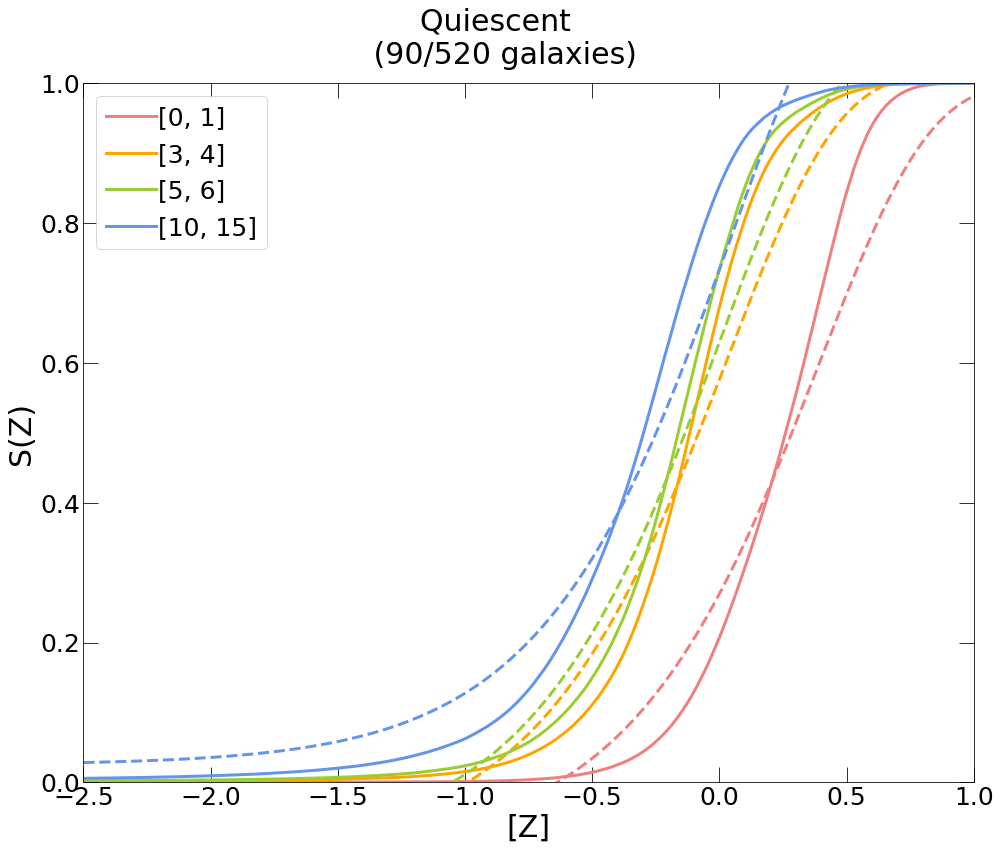

In [12]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange
from dataclasses import dataclass
import scipy.optimize as opt

#metallicity profiles
f, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(14, 12), constrained_layout=True)

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap1 = plt.get_cmap('terrain')
# colormap2 = plt.get_cmap('gnuplot')
# norm = colors.Normalize(vmin=0, vmax=30)
# colormap = plt.get_cmap('plasma')
# norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
# ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
# metalbins = np.linspace(-0.8, 1, 30)
# densitybins2 = np.linspace(1.5, 12, 20)

@dataclass
class CDF:
#     selection: np.ndarray
    label: str
    color: str
    big_R_star: np.array = np.zeros(0)
    big_f_gas: np.array = np.zeros(0)
    big_OH_star: np.array = np.zeros(0)
    big_OH_gas: np.array = np.zeros(0)
            
ranges = [CDF(label='[0, 1]', color='lightcoral'), CDF(label='[3, 4]', color='orange'), CDF(label='[5, 6]', color='yellowgreen'), CDF(label='[10, 15]', color='cornflowerblue')]

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
# big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_y_eff = np.zeros(0)
# big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
#         w = np.where(5<=R_star&R_star<=6)
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
        selection = [(R_star<=1), (3<=R_star)&(R_star<=4), (5<=R_star)&(R_star<=6), (10<=R_star)&(R_star<=15)]
#         rad5_6 = (5<=R_star)&(R_star<=6)
#         rad3_4 = (3<=R_star)&(R_star<=4)
        for i in range(len(selection)):
            radii = ranges[i]
            criteria = selection[i]
            OH_star_new = OH_star[criteria]
            f_gas_new = f_gas[criteria]
#             y_eff_new = y_eff[radii.selection]
            OH_gas_new = OH_gas[criteria]
    #         R_e = halfmass_rad_stars(id, redshift)
    #         big_y_eff = np.concatenate((big_y_eff, y_eff), axis=None)
    #         big_R = np.concatenate((big_R, R), axis=None)
#             radii.big_R_star = np.concatenate((radii.big_R_star, R_star_new), axis=None)
            radii.big_f_gas = np.concatenate((radii.big_f_gas, f_gas_new), axis=None)
            radii.big_OH_star = np.concatenate((radii.big_OH_star, OH_star_new), axis=None)
            radii.big_OH_gas = np.concatenate((radii.big_OH_gas, OH_gas_new), axis=None)
#         h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
#         big_h3 += h3
#         h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
#         big_h4 += h4

        # calculate statistic for profile
#         n_bins = 50
#         percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
#         xx = percentiles[:-1]
        
#         number = randrange(30)
#         color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
#         color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
#         ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
#         ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)


def func(Z, Z0):
    S = (1 - mu1**((Z-Z0)/(Z1-Z0))) / (1 - mu1)
    return S


# Z1_array = [10**0.75, 10**0.25, 10**0.15, 10**(0.15)]
Z1_array = [10**1.401, 10**0.668, 10**0.482, 10**(0.274)]
idx = -1
for radii in ranges:
    idx += 1
    Z1 = Z1_array[idx]
    # CDF
    xx1 = np.sort(radii.big_OH_star)
    yy1 = np.array(range(len(radii.big_OH_star)))/len(radii.big_OH_star)
    ax1.plot(xx1, yy1, '-', label=radii.label, linewidth=3, color=radii.color)

    # model
    mu1 = np.median(radii.big_f_gas)
    med_OH_gas = np.median(radii.big_OH_gas)
    print(radii.label, mu1, med_OH_gas)
#     Z0 = np.linspace(-0.5, 1, 5)
#     Z = 10**radii.big_OH_star
#     Z1 = 10**0.7 #med_OH_gas
#     xx2 = radii.big_OH_star
#     med_f_gas = 0.002
#     for thing in Z0:
#         yy2 = (1 - med_f_gas**((Z-thing)/(Z1-thing))) / (1 - med_f_gas)
#         # yy2 = (1 - 0.3**(10**(big_OH_star-0.5))) / (1 - 0.3)
#         yy2_plot = [yy2 for _, yy2 in sorted(zip(xx2, yy2))]
#         ax1.plot(np.sort(xx2), yy2_plot, '--', linewidth=2, label=str(thing))#color=radii.color)
#     idx = np.random.choice(np.arange(len(xx1)), 1000, replace=False)
    optParam, pcov = opt.curve_fit(func, 10**xx1, yy1, maxfev=5000)
    
    ax1.plot(xx1, func(10**xx1, *optParam), '--', color=radii.color, linewidth=3)
    print('[$Z_0$] = %5.3f' % np.log10(optParam))


ax1.set_xlim(-2.5, 1)
#     ax1.set_xticks([0.2, 1, 10], minor=False)
#     ax1.set_xticklabels(['', '1', '10'])
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(0, 1)
# ax1.set_yscale('log')
ax1.set_ylabel("S(Z)", fontsize=fts)
ax1.set_xlabel('[Z]', fontsize=fts)
ax1.legend(fontsize=ftss, handletextpad=0.1)


f.suptitle('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\CDF_quiescent_Z0.png', dpi=100)

[0, 1] 0.04174038224567969 0.40307900309562683
[$Z_1$] = 0.883
[3, 4] 0.2566613633041328 -0.03143513947725296
[$Z_1$] = 0.264
[5, 6] 0.2933937225921267 -0.1644022911787033
[$Z_1$] = 0.176
[10, 11] 0.39734805795322015 -0.37335868179798126
[$Z_1$] = -0.003


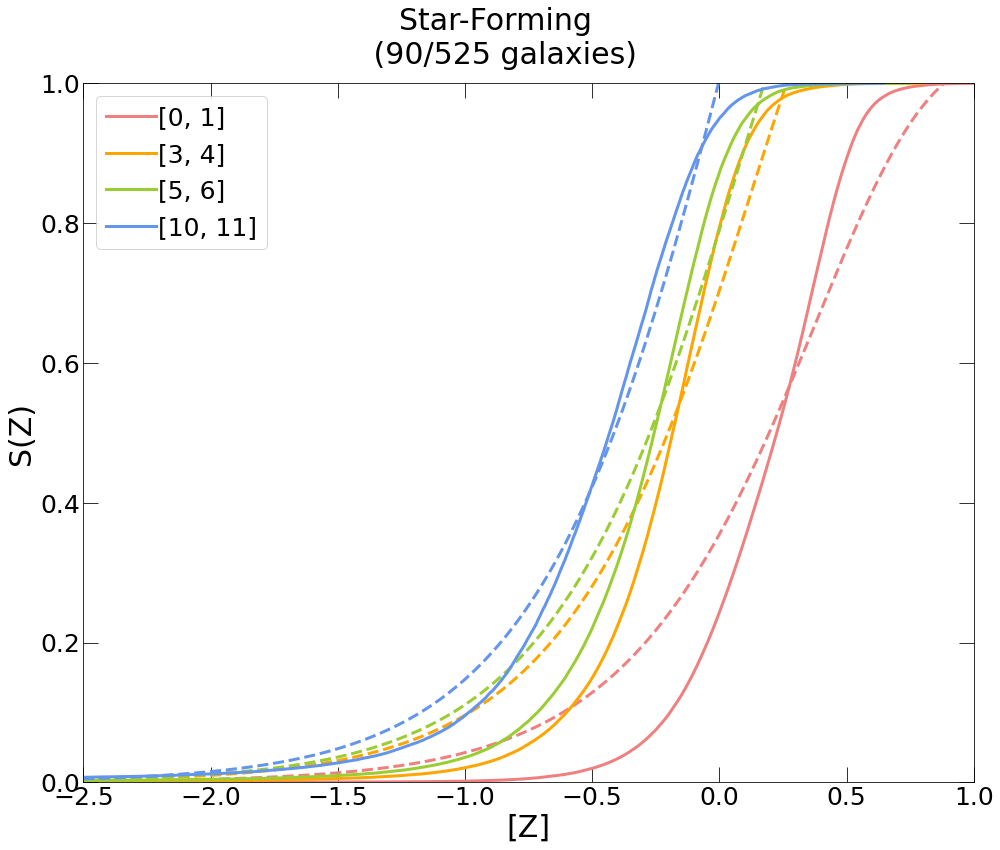

In [9]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange
from dataclasses import dataclass
import scipy.optimize as opt

#metallicity profiles
f, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(14, 12), constrained_layout=True)

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap1 = plt.get_cmap('terrain')
# colormap2 = plt.get_cmap('gnuplot')
# norm = colors.Normalize(vmin=0, vmax=30)
# colormap = plt.get_cmap('plasma')
# norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
# ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
# metalbins = np.linspace(-0.8, 1, 30)
# densitybins2 = np.linspace(1.5, 12, 20)

@dataclass
class CDF:
#     selection: np.ndarray
    label: str
    color: str
    big_R_star: np.array = np.zeros(0)
    big_f_gas: np.array = np.zeros(0)
    big_OH_star: np.array = np.zeros(0)
    big_OH_gas: np.array = np.zeros(0)
            
ranges = [CDF(label='[0, 1]', color='lightcoral'), CDF(label='[3, 4]', color='orange'), CDF(label='[5, 6]', color='yellowgreen'), CDF(label='[10, 11]', color='cornflowerblue')]

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
# big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_y_eff = np.zeros(0)
# big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
#         w = np.where(5<=R_star&R_star<=6)
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
        selection = [(R_star<=1), (3<=R_star)&(R_star<=4), (5<=R_star)&(R_star<=6), (10<=R_star)&(R_star<=11)]
#         rad5_6 = (5<=R_star)&(R_star<=6)
#         rad3_4 = (3<=R_star)&(R_star<=4)
        for i in range(len(selection)):
            radii = ranges[i]
            criteria = selection[i]
            OH_star_new = OH_star[criteria]
            f_gas_new = f_gas[criteria]
#             y_eff_new = y_eff[radii.selection]
            OH_gas_new = OH_gas[criteria]
    #         R_e = halfmass_rad_stars(id, redshift)
    #         big_y_eff = np.concatenate((big_y_eff, y_eff), axis=None)
    #         big_R = np.concatenate((big_R, R), axis=None)
#             radii.big_R_star = np.concatenate((radii.big_R_star, R_star_new), axis=None)
            radii.big_f_gas = np.concatenate((radii.big_f_gas, f_gas_new), axis=None)
            radii.big_OH_star = np.concatenate((radii.big_OH_star, OH_star_new), axis=None)
            radii.big_OH_gas = np.concatenate((radii.big_OH_gas, OH_gas_new), axis=None)
#         h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
#         big_h3 += h3
#         h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
#         big_h4 += h4

        # calculate statistic for profile
#         n_bins = 50
#         percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
#         xx = percentiles[:-1]
        
#         number = randrange(30)
#         color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
#         color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
#         ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
#         ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)

def func(Z, Z_gas):
    S = (1 - med_f_gas**(Z/Z_gas)) / (1 - med_f_gas)
    return S

for radii in ranges:
    # CDF
    xx1 = np.sort(radii.big_OH_star)
    yy1 = np.array(range(len(radii.big_OH_star)))/len(radii.big_OH_star)
    ax1.plot(xx1, yy1, '-', label=radii.label, linewidth=3, color=radii.color)

    # model
    xx2 = radii.big_OH_star
    med_f_gas = np.median(radii.big_f_gas)
    med_OH_gas = np.median(radii.big_OH_gas)
    Z_gas = 10**med_f_gas
    print(radii.label, med_f_gas, med_OH_gas)
#     yy2 = (1 - med_f_gas**(10**(radii.big_OH_star-med_OH_gas))) / (1 - med_f_gas)
#     # yy2 = (1 - 0.3**(10**(big_OH_star-0.5))) / (1 - 0.3)
#     yy2_plot = [yy2 for _, yy2 in sorted(zip(xx2, yy2))]
#     ax1.plot(np.sort(xx2), yy2_plot, '--', linewidth=2, color=radii.color)
    optParam, pcov = opt.curve_fit(func, 10**xx1, yy1)
    ax1.plot(xx1, func(10**xx1, *optParam), '--', color=radii.color, linewidth=3)#, label='[$Z_1$] = %5.3f' % np.log10(optParam))
    print('[$Z_1$] = %5.3f' % np.log10(optParam))

ax1.set_xlim(-2.5, 1)
#     ax1.set_xticks([0.2, 1, 10], minor=False)
#     ax1.set_xticklabels(['', '1', '10'])
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(0, 1)
# ax1.set_yscale('log')
ax1.set_ylabel("S(Z)", fontsize=fts)
ax1.set_xlabel('[Z]', fontsize=fts)
ax1.legend(fontsize=ftss, handletextpad=0.1)


f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\CDF_starforming.png', dpi=100)

[0, 1] 3.7474789134982905e-05 -0.09264504164457321
[$Z_1$] = 1.401
[3, 4] 0.014171699388816357 -0.11390195786952972
[$Z_1$] = 0.668
[5, 6] 0.05347933695395842 -0.14985673129558563
[$Z_1$] = 0.482
[10, 11] 0.14387850682652092 -0.24288734793663025
[$Z_1$] = 0.274


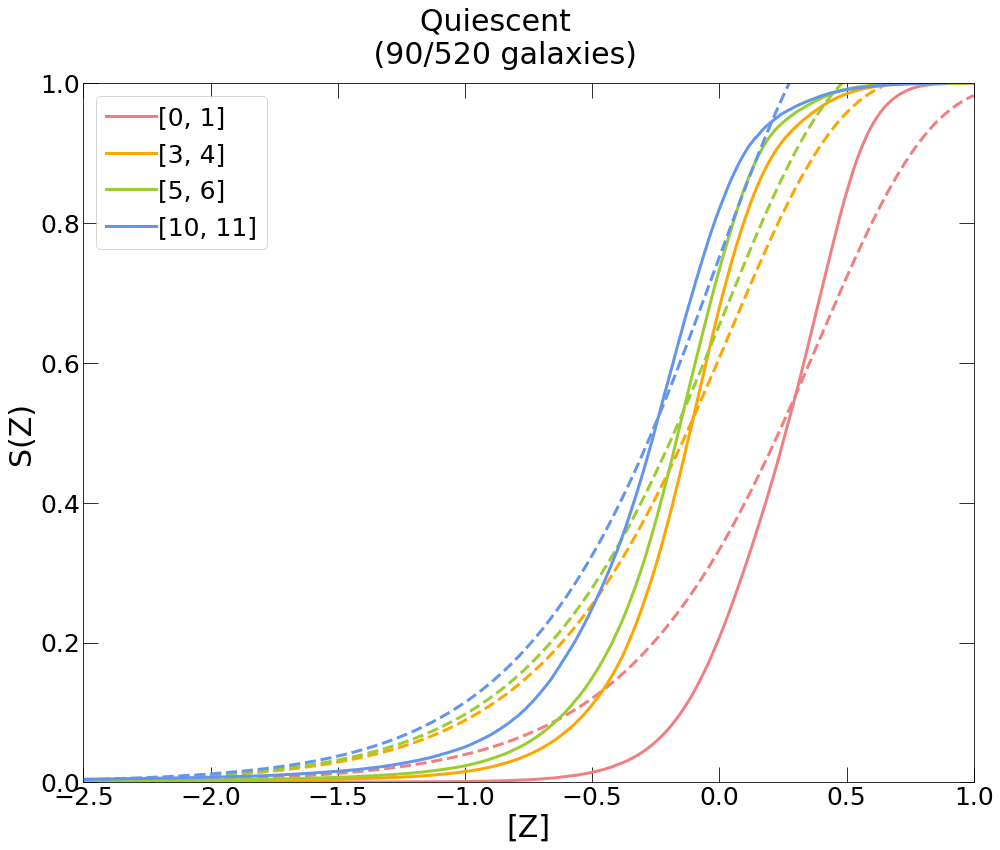

In [11]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange
from dataclasses import dataclass
import scipy.optimize as opt

#metallicity profiles
f, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(14, 12), constrained_layout=True)

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap1 = plt.get_cmap('terrain')
# colormap2 = plt.get_cmap('gnuplot')
# norm = colors.Normalize(vmin=0, vmax=30)
# colormap = plt.get_cmap('plasma')
# norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
# ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
# metalbins = np.linspace(-0.8, 1, 30)
# densitybins2 = np.linspace(1.5, 12, 20)

@dataclass
class CDF:
#     selection: np.ndarray
    label: str
    color: str
    big_R_star: np.array = np.zeros(0)
    big_f_gas: np.array = np.zeros(0)
    big_OH_star: np.array = np.zeros(0)
    big_OH_gas: np.array = np.zeros(0)
            
ranges = [CDF(label='[0, 1]', color='lightcoral'), CDF(label='[3, 4]', color='orange'), CDF(label='[5, 6]', color='yellowgreen'), CDF(label='[10, 11]', color='cornflowerblue')]

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
# big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_y_eff = np.zeros(0)
# big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
#         w = np.where(5<=R_star&R_star<=6)
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
        selection = [(R_star<=1), (3<=R_star)&(R_star<=4), (5<=R_star)&(R_star<=6), (10<=R_star)&(R_star<=11)]
#         rad5_6 = (5<=R_star)&(R_star<=6)
#         rad3_4 = (3<=R_star)&(R_star<=4)
        for i in range(len(selection)):
            radii = ranges[i]
            criteria = selection[i]
            OH_star_new = OH_star[criteria]
            f_gas_new = f_gas[criteria]
#             y_eff_new = y_eff[radii.selection]
            OH_gas_new = OH_gas[criteria]
    #         R_e = halfmass_rad_stars(id, redshift)
    #         big_y_eff = np.concatenate((big_y_eff, y_eff), axis=None)
    #         big_R = np.concatenate((big_R, R), axis=None)
#             radii.big_R_star = np.concatenate((radii.big_R_star, R_star_new), axis=None)
            radii.big_f_gas = np.concatenate((radii.big_f_gas, f_gas_new), axis=None)
            radii.big_OH_star = np.concatenate((radii.big_OH_star, OH_star_new), axis=None)
            radii.big_OH_gas = np.concatenate((radii.big_OH_gas, OH_gas_new), axis=None)
#         h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
#         big_h3 += h3
#         h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
#         big_h4 += h4

        # calculate statistic for profile
#         n_bins = 50
#         percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
#         xx = percentiles[:-1]
        
#         number = randrange(30)
#         color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
#         color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
#         ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
#         ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)

def func(Z, Z_gas):
    S = (1 - med_f_gas**(Z/Z_gas)) / (1 - med_f_gas)
    return S

for radii in ranges:
    # CDF
    xx1 = np.sort(radii.big_OH_star)
    yy1 = np.array(range(len(radii.big_OH_star)))/len(radii.big_OH_star)
    ax1.plot(xx1, yy1, '-', label=radii.label, linewidth=3, color=radii.color)

    # model
    xx2 = radii.big_OH_star
    med_f_gas = np.median(radii.big_f_gas)
    med_OH_gas = np.median(radii.big_OH_gas)
    Z_gas = 10**med_f_gas
    print(radii.label, med_f_gas, med_OH_gas)
#     yy2 = (1 - med_f_gas**(10**(radii.big_OH_star-med_OH_gas))) / (1 - med_f_gas)
#     # yy2 = (1 - 0.3**(10**(big_OH_star-0.5))) / (1 - 0.3)
#     yy2_plot = [yy2 for _, yy2 in sorted(zip(xx2, yy2))]
#     ax1.plot(np.sort(xx2), yy2_plot, '--', linewidth=2, color=radii.color)
    optParam, pcov = opt.curve_fit(func, 10**xx1, yy1)
    ax1.plot(xx1, func(10**xx1, *optParam), '--', color=radii.color, linewidth=3)#, label='[$Z_1$] = %5.3f' % np.log10(optParam))
    print('[$Z_1$] = %5.3f' % np.log10(optParam))

ax1.set_xlim(-2.5, 1)
#     ax1.set_xticks([0.2, 1, 10], minor=False)
#     ax1.set_xticklabels(['', '1', '10'])
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(0, 1)
# ax1.set_yscale('log')
ax1.set_ylabel("S(Z)", fontsize=fts)
ax1.set_xlabel('[Z]', fontsize=fts)
ax1.legend(fontsize=ftss, handletextpad=0.1)


f.suptitle('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\CDF_quiescent.png', dpi=100)

TypeError: 'Response' object is not subscriptable

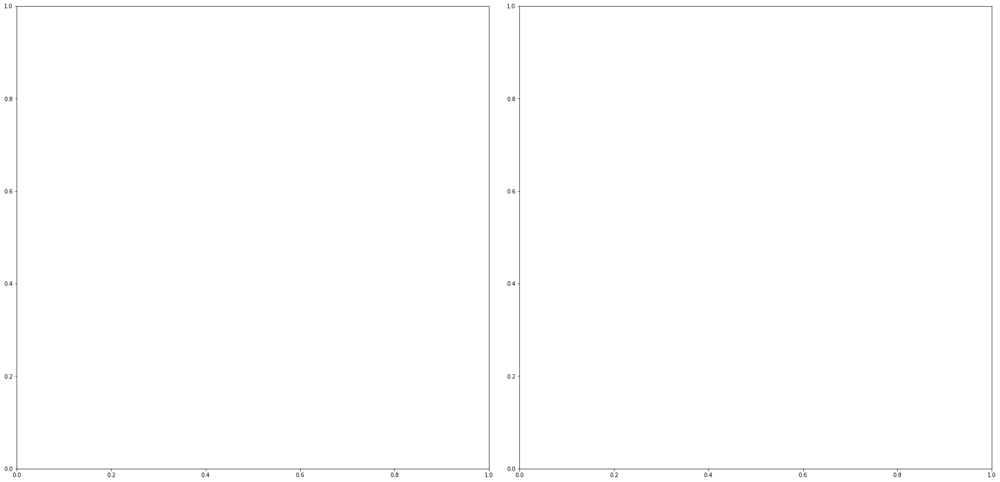

In [5]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange
from dataclasses import dataclass
import scipy.optimize as opt

#metallicity profiles
f, axes = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(25, 12), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap1 = plt.get_cmap('terrain')
# colormap2 = plt.get_cmap('gnuplot')
# norm = colors.Normalize(vmin=0, vmax=30)
# colormap = plt.get_cmap('plasma')
# norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
# ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
# metalbins = np.linspace(-0.8, 1, 30)
# densitybins2 = np.linspace(1.5, 12, 20)

@dataclass
class CDF:
#     selection: np.ndarray
    label: str
    color: str
    big_R_star: np.array = np.zeros(0)
    big_f_gas: np.array = np.zeros(0)
    big_OH_star: np.array = np.zeros(0)
    big_OH_gas: np.array = np.zeros(0)
            
ranges = [CDF(label='[0, 1] kpc', color='lightcoral'), CDF(label='[3, 4] kpc', color='orange'), CDF(label='[10, 11] kpc', color='cornflowerblue')]
          #, CDF(label='[5, 6]', color='yellowgreen')

np.random.seed(0)

#z=2 star-forming galaxies
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
        selection = [(R_star<=1), (3<=R_star)&(R_star<=4), (10<=R_star)&(R_star<=11)]
#         rad5_6 = (5<=R_star)&(R_star<=6)
#         rad3_4 = (3<=R_star)&(R_star<=4)
        for i in range(len(selection)):
            radii = ranges[i]
            criteria = selection[i]
            OH_star_new = OH_star[criteria]
            f_gas_new = f_gas[criteria]
            OH_gas_new = OH_gas[criteria]
            radii.big_f_gas = np.concatenate((radii.big_f_gas, f_gas_new), axis=None)
            radii.big_OH_star = np.concatenate((radii.big_OH_star, OH_star_new), axis=None)
            radii.big_OH_gas = np.concatenate((radii.big_OH_gas, OH_gas_new), axis=None)


def func2(Z, Z0):
    S = (1 - mu1**((Z-Z0)/(Z1-Z0))) / (1 - mu1)
    return S

def func1(Z, Z_gas):
    S = (1 - mu1**(Z/Z_gas)) / (1 - mu1)
    return S

# Z1_array = [10**0.75, 10**0.25, 10**0.15, 10**(0.15)]
Z1_array = [10**0.883, 10**0.264, 10**(-0.003)] #, 10**0.176
idx = -1
for radii in ranges:
    idx += 1
#     Z1 = Z1_array[idx]
    # CDF
    xx1 = np.sort(radii.big_OH_star)
    yy1 = np.array(range(len(radii.big_OH_star)))/len(radii.big_OH_star)
    ax1.plot(xx1, yy1, '-', label=radii.label, linewidth=3, color=radii.color)
    ax2.plot(xx1, yy1, '-', label=radii.label, linewidth=3, color=radii.color)

    # model
    mu1 = np.median(radii.big_f_gas)
    med_OH_gas = np.median(radii.big_OH_gas)
    print(radii.label, mu1, med_OH_gas)
    
    optParam1, pcov1 = opt.curve_fit(func1, 10**xx1, yy1, maxfev=5000)
    Z1 = optParam1
    
    if idx==2:
        optParam2, pcov2 = opt.curve_fit(func2, 10**xx1, yy1, maxfev=5000, bounds=([-np.inf, 1]), p0=0)
    else:
        optParam2, pcov2 = opt.curve_fit(func2, 10**xx1, yy1, maxfev=5000)
    
    ax1.plot(xx1, func1(10**xx1, *optParam1), '--', color=radii.color, linewidth=3)
    ax2.plot(xx1, func2(10**xx1, *optParam2), '--', color=radii.color, linewidth=3)
    print('[$Z_1$] = %5.3f' % np.log10(optParam1))
    print('[$Z_0$] = %5.3f' % np.log10(optParam2))

for ax in axes:
    ax.set_xlim(-2.5, 1)
#     ax1.set_xticks([0.2, 1, 10], minor=False)
#     ax1.set_xticklabels(['', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
    ax.set_ylim(0, 1)
    ax.set_xlabel('[Z]', fontsize=fts)
# ax1.set_yscale('log')
ax1.set_ylabel("S(Z)", fontsize=fts)
ax1.legend(fontsize=ftss, handletextpad=0.1)
ax1.set_title('Simple Closed-Box', fontsize=fts)
ax2.set_title('Closed-Box with Pre-Enrichment', fontsize=fts)


f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\CDF_starforming_big.png', dpi=100)

93190, 12501, 97573, 112927, 141781, 167786, 131220, 133401, 161669, 52267, 112212, 105133, 40302, 99287, 71660, 107398, 72632, 127909, 102609, 81298, 139820, 139116, 142061, 116448, 23224, 115002, 113425, 129550, 96355, 120400, 26573, 101633, 155308, 124326, 147060, 38889, 121802, 99874, 108013, 123688, 149965, 179517, 102119, 152307, 72930, 164860, 13847, 125127, 79735, 99489, 69498, 96476, 121127, 108899, 129871, 56280, 158115, 101514, 26571, 139168, 109279, 144164, 114734, 89655, 56711, 102906, 117469, 41182, 122795, 119346, 48330, 132335, 105875, 163436, 66219, 3, 122366, 10754, 139222, 46230, 116839, 76385, 40303, 157392, 68797, 53748, 82500, 143492, 145912, 133865, [$Z_1$] = 0.883
[$Z_0$] = -0.607
[$Z_1$] = 0.582
[$Z_0$] = -0.840
[$Z_1$] = 0.361
[$Z_0$] = -0.939
[$Z_1$] = 0.264
[$Z_0$] = -1.018
[$Z_1$] = 0.209
[$Z_0$] = -1.093
[$Z_1$] = 0.176
[$Z_0$] = -1.161
[$Z_1$] = 0.145
[$Z_0$] = -1.254
[$Z_1$] = 0.109
[$Z_0$] = -1.393
[$Z_1$] = 0.074
[$Z_0$] = -1.534
[$Z_1$] = 0.032
[$Z_0$

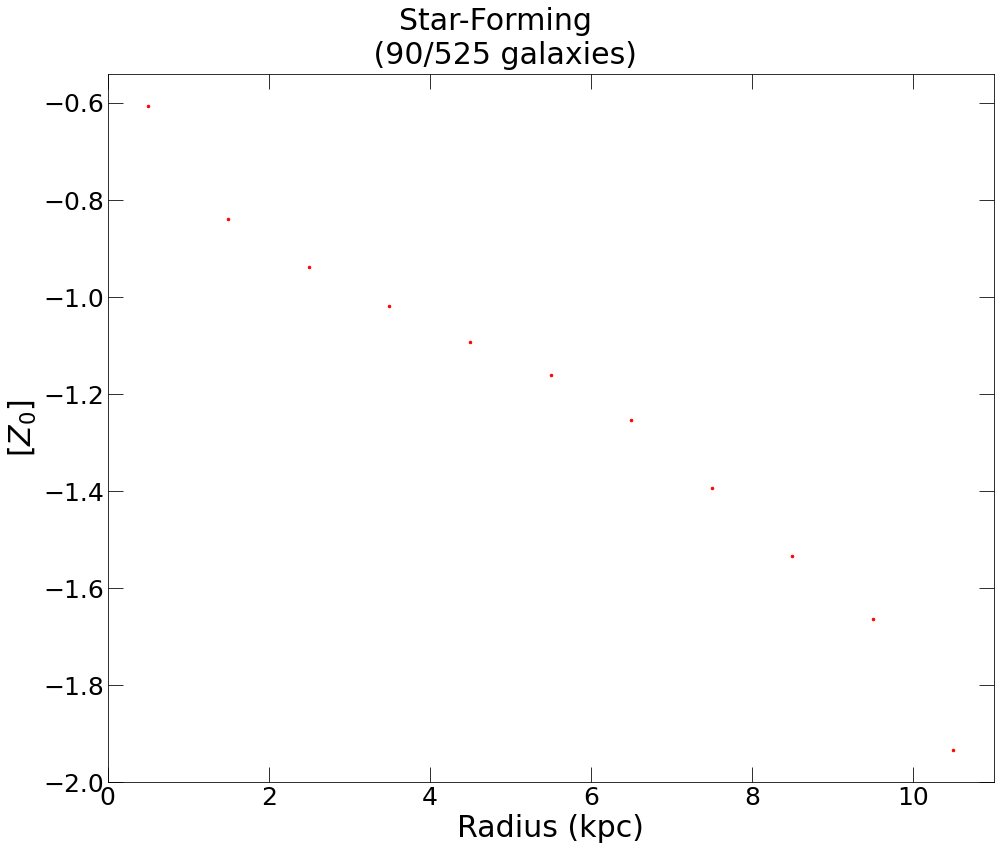

In [4]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange
from dataclasses import dataclass
import scipy.optimize as opt

#metallicity profiles
f, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(14, 12), constrained_layout=True)

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0


# colormap1 = plt.get_cmap('terrain')
# colormap2 = plt.get_cmap('gnuplot')
# norm = colors.Normalize(vmin=0, vmax=30)
# colormap = plt.get_cmap('plasma')
# norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
# ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
# metalbins = np.linspace(-0.8, 1, 30)
# densitybins2 = np.linspace(1.5, 12, 20)

@dataclass
class CDF:
#     selection: np.ndarray
    midpoint: float
#     color: str
    big_R_star: np.array = np.zeros(0)
    big_f_gas: np.array = np.zeros(0)
    big_OH_star: np.array = np.zeros(0)
    big_OH_gas: np.array = np.zeros(0)
            
ranges = [CDF(midpoint=0.5), CDF(midpoint=1.5), CDF(midpoint=2.5), CDF(midpoint=3.5), CDF(midpoint=4.5), CDF(midpoint=5.5), CDF(midpoint=6.5), CDF(midpoint=7.5), 
          CDF(midpoint=8.5), CDF(midpoint=9.5), CDF(midpoint=10.5)]

np.random.seed(0)

#z=2 star-forming galaxies
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    print(id, end=', ')
    R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
#     print(R)
    if type(R) == int:
        pass
    else:
#         w = np.where(5<=R_star&R_star<=6)
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
#         print(OH_gas)
#         if type(OH_gas) == int:
#             pass:
#         else:
        selection = [(R_star<=1), (1<=R_star)&(R_star<=2), (2<=R_star)&(R_star<=3), (3<=R_star)&(R_star<=4), (4<=R_star)&(R_star<=5), (5<=R_star)&(R_star<=6), (6<=R_star)&(R_star<=7), 
                     (7<=R_star)&(R_star<=8), (8<=R_star)&(R_star<=9), (9<=R_star)&(R_star<=10), (10<=R_star)&(R_star<=11)]
#         rad5_6 = (5<=R_star)&(R_star<=6)
#         rad3_4 = (3<=R_star)&(R_star<=4)
        for i in range(len(selection)):
            radii = ranges[i]
            criteria = selection[i]
            OH_star_new = OH_star[criteria]
            f_gas_new = f_gas[criteria]
#             y_eff_new = y_eff[radii.selection]
            OH_gas_new = OH_gas[criteria]
            radii.big_f_gas = np.concatenate((radii.big_f_gas, f_gas_new), axis=None)
            radii.big_OH_star = np.concatenate((radii.big_OH_star, OH_star_new), axis=None)
            radii.big_OH_gas = np.concatenate((radii.big_OH_gas, OH_gas_new), axis=None)



def func2(Z, Z0):
    S = (1 - mu1**((Z-Z0)/(Z1-Z0))) / (1 - mu1)
    return S

def func1(Z, Z_gas):
    S = (1 - mu1**(Z/Z_gas)) / (1 - mu1)
    return S


# Z1_array = [10**0.75, 10**0.25, 10**0.15, 10**(0.15)]
Z1_array = [10**0.883, 10**0.264, 10**(-0.003)] #, 10**0.176
idx = -1
big_xx = []
big_yy = []
for radii in ranges:
    idx += 1
#     Z1 = Z1_array[idx]
    # CDF
    xx1 = np.sort(radii.big_OH_star)
    yy1 = np.array(range(len(radii.big_OH_star)))/len(radii.big_OH_star)
#     ax1.plot(xx1, yy1, '-', label=radii.label, linewidth=3, color=radii.color)
#     ax2.plot(xx1, yy1, '-', label=radii.label, linewidth=3, color=radii.color)

    # model
    mu1 = np.median(radii.big_f_gas)
    med_OH_gas = np.median(radii.big_OH_gas)
#     print(radii.label, mu1, med_OH_gas)
    
    optParam1, pcov1 = opt.curve_fit(func1, 10**xx1, yy1, maxfev=5000)
    Z1 = optParam1
    
    if radii.midpoint==10.5:
        optParam2, pcov2 = opt.curve_fit(func2, 10**xx1, yy1, maxfev=5000, bounds=([-np.inf, 1]), p0=0)
    else:
        optParam2, pcov2 = opt.curve_fit(func2, 10**xx1, yy1, maxfev=5000)
        
    big_xx.append(radii.midpoint)
    big_yy.append(np.log10(optParam2))
    
#     ax1.plot(xx1, func1(10**xx1, *optParam1), '--', color=radii.color, linewidth=3)
#     ax2.plot(xx1, func2(10**xx1, *optParam2), '--', color=radii.color, linewidth=3)
#     ax1.plot(radii.midpoint, np.log10(optParam2))
    print('[$Z_1$] = %5.3f' % np.log10(optParam1))
    print('[$Z_0$] = %5.3f' % np.log10(optParam2))
    
ax1.plot(big_xx, big_yy, '.', markersize=5, color='red')


ax1.set_xlim(0, 11)
#     ax1.set_xticks([0.2, 1, 10], minor=False)
#     ax1.set_xticklabels(['', '1', '10'])
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_ylim(0, 1)
# ax1.set_yscale('log')
ax1.set_ylabel("[$Z_0$]", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
# ax1.legend(fontsize=ftss, handletextpad=0.1)


f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

# plt.savefig('2022 FIGURES\CDF_Z1.png', dpi=100)

y = -0.1147x + -0.5905


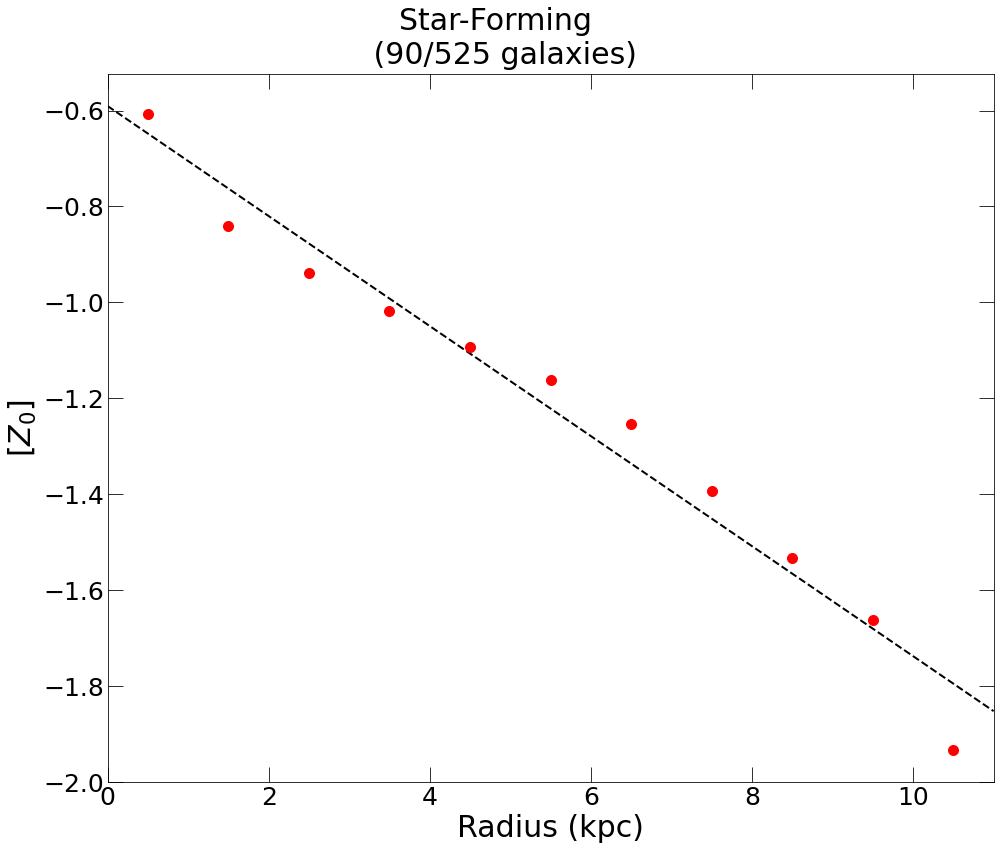

In [24]:
# RUN ABOVE CODE FIRST

from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange
from dataclasses import dataclass
import scipy.optimize as opt
from scipy.interpolate import make_interp_spline, BSpline

f, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(14, 12), constrained_layout=True)

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# interpolate above data into smooth line
def func(x, m, b):
    y = m*x + b
    return y

xx_new = np.array([0, 11])
# big_yy = np.concatenate(big_yy).ravel().tolist()

optParam, pcov = curve_fit(func, big_xx, big_yy)
print('y = %5.4fx + %5.4f' %(optParam[0], optParam[1]))
ax1.plot(xx_new, func(xx_new, *optParam), '--', color='k', linewidth=2)

ax1.plot(big_xx, big_yy, 'r.', markersize=20)

# yassify
ax1.set_xlim(0, 11)
#     ax1.set_xticks([0.2, 1, 10], minor=False)
#     ax1.set_xticklabels(['', '1', '10'])
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_ylim(0, 1)
# ax1.set_yscale('log')
ax1.set_ylabel("[$Z_0$]", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
# ax1.legend(fontsize=ftss, handletextpad=0.1)


f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES\CDF_Z0.png', dpi=100)

## stellar and gas metallicities comparison

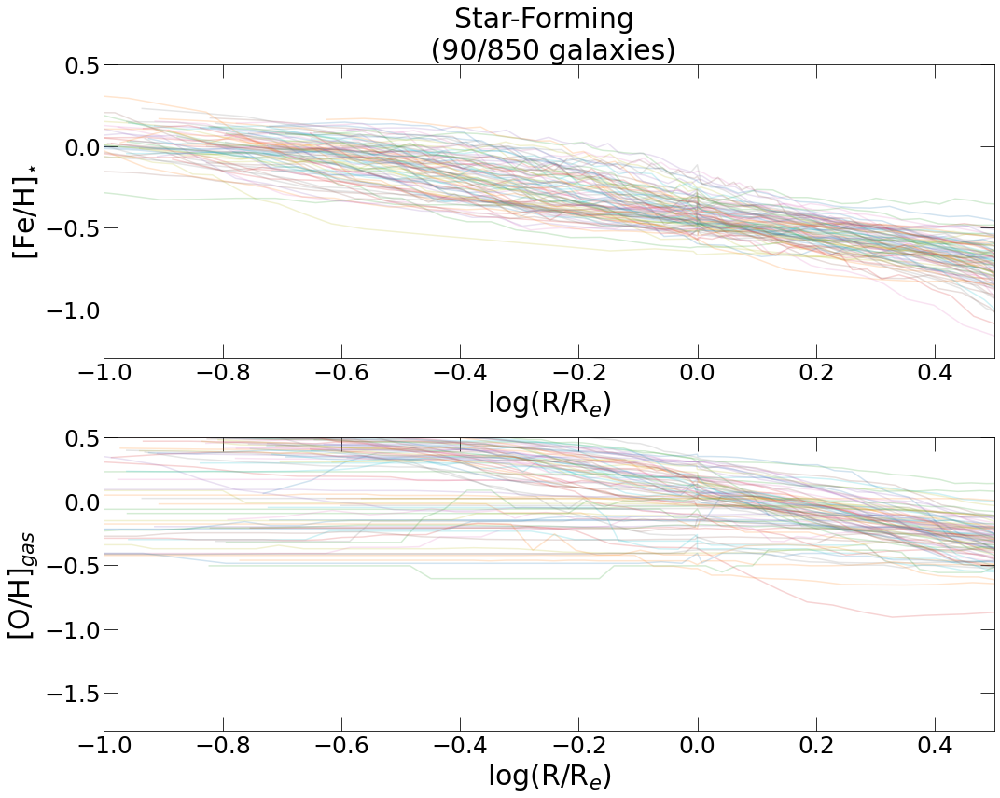

In [7]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 1, sharex='none', sharey='none', figsize=(15, 12), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap = plt.get_cmap('plasma')
# norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-1, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, Z_star, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
        R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(np.log10(R/R_e), (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(np.log10(R/R_e), Z_star, 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(np.log10(R/R_e), Z_gas, 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(-1, 0.5)
#     ax[0].set_xscale('log')
#     ax[0].set_xticks([0.2, 1, 10], minor=False)
#     ax[0].set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-1.3, 0.5)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
ax1.set_xlabel('log(R/R$_e$)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[O/H]$_{gas}$", fontsize=fts)
ax2.set_xlabel('log(R/R$_e$)', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
# ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
# ax3.set_ylim(-1.3, 0.5)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax1.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

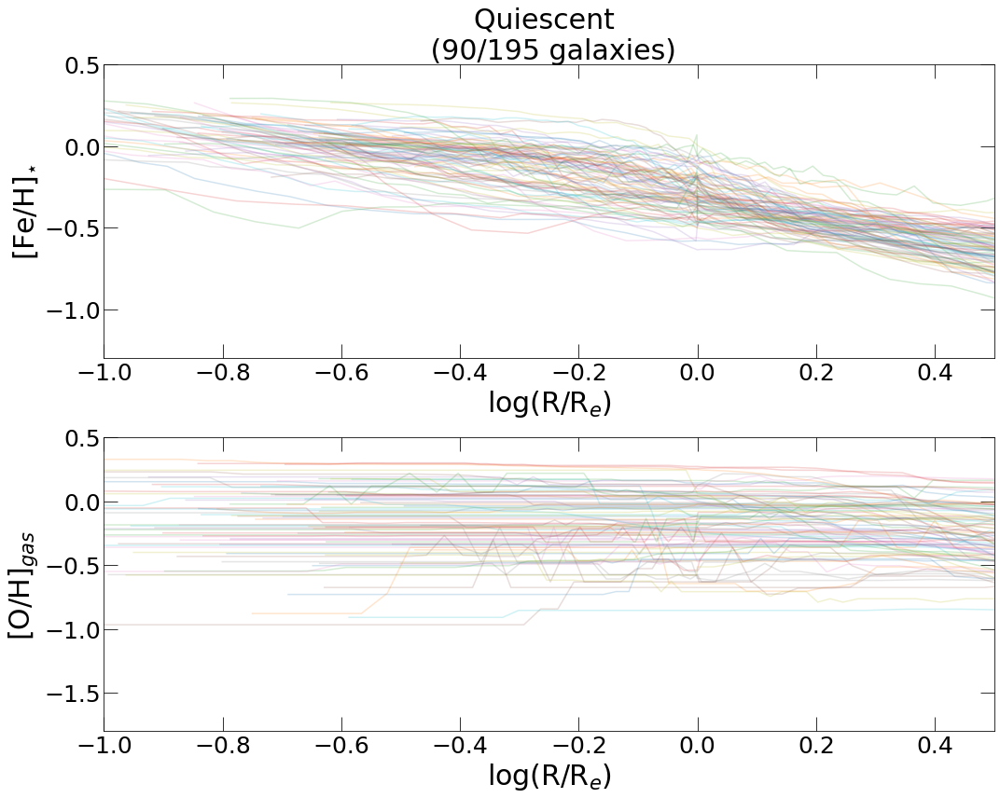

In [8]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 1, sharex='none', sharey='none', figsize=(15, 12), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap = plt.get_cmap('plasma')
# norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-1, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, Z_star, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
        R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(np.log10(R/R_e), (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(np.log10(R/R_e), Z_star, 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(np.log10(R/R_e), Z_gas, 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(-1, 0.5)
#     ax[0].set_xscale('log')
#     ax[0].set_xticks([0.2, 1, 10], minor=False)
#     ax[0].set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-1.3, 0.5)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
ax1.set_xlabel('log(R/R$_e$)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[O/H]$_{gas}$", fontsize=fts)
ax2.set_xlabel('log(R/R$_e$)', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
# ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
# ax3.set_ylim(-1.3, 0.5)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax1.set_title('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

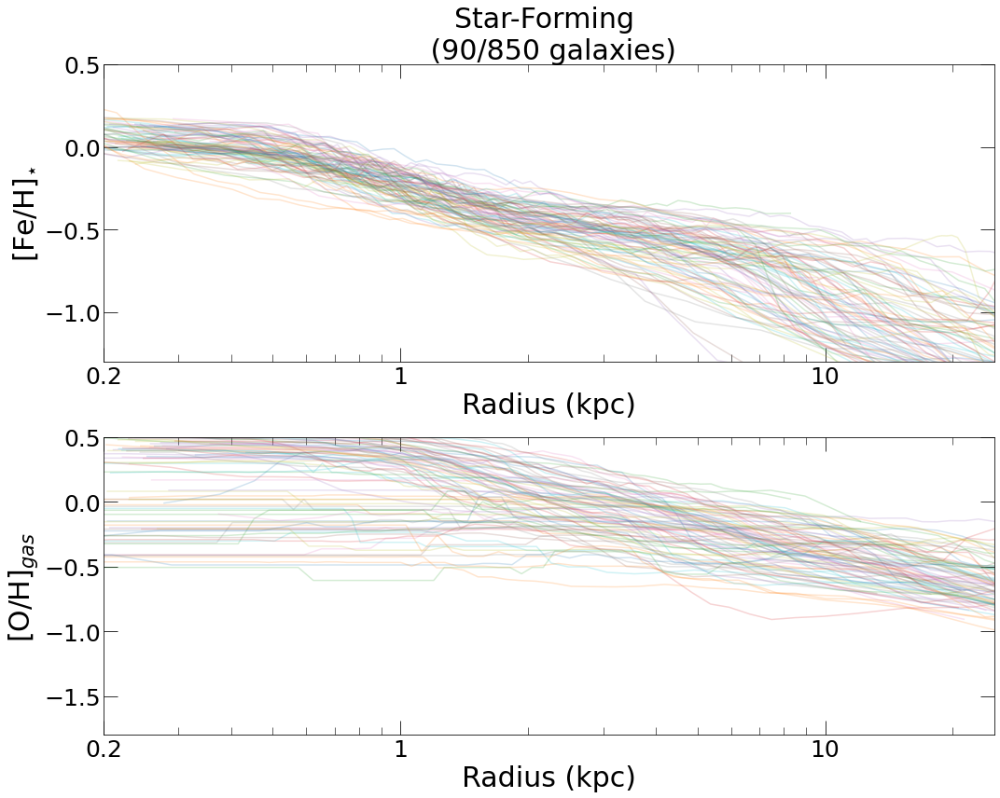

In [12]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 1, sharex='none', sharey='none', figsize=(15, 12), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap = plt.get_cmap('plasma')
# norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, Z_star, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R, Z_star, 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R, Z_gas, 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(0.2, 25)
    ax.set_xscale('log')
    ax.set_xticks([0.2, 1, 10], minor=False)
    ax.set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-1.3, 0.5)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[O/H]$_{gas}$", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
# ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
# ax3.set_ylim(-1.3, 0.5)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax1.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

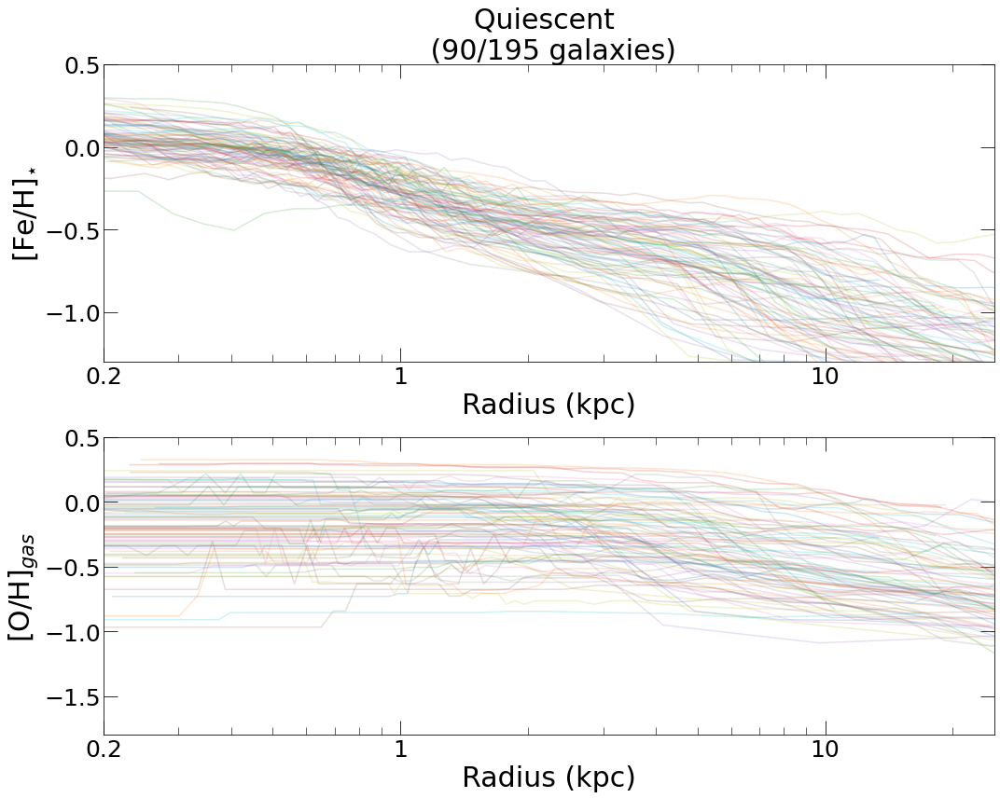

In [13]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 1, sharex='none', sharey='none', figsize=(15, 12), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap = plt.get_cmap('plasma')
# norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, Z_star, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R, Z_star, 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R, Z_gas, 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(0.2, 25)
    ax.set_xscale('log')
    ax.set_xticks([0.2, 1, 10], minor=False)
    ax.set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-1.3, 0.5)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[O/H]$_{gas}$", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
# ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
# ax3.set_ylim(-1.3, 0.5)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax1.set_title('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

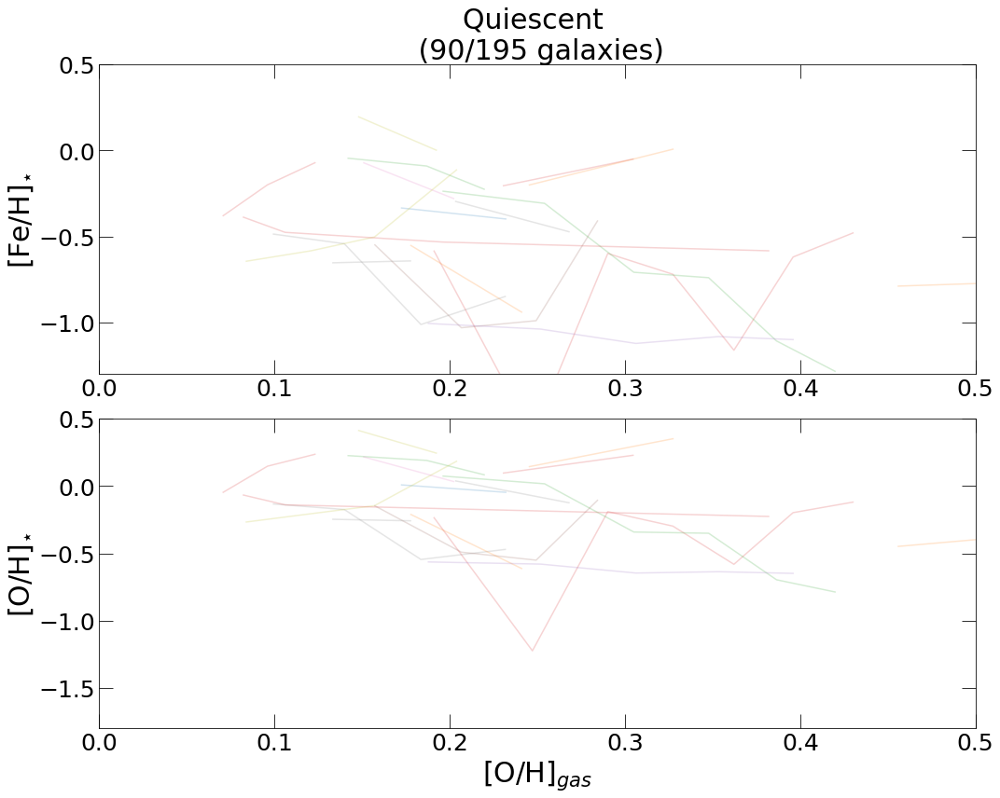

In [8]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 1, sharex='none', sharey='none', figsize=(15, 12), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap = plt.get_cmap('plasma')
# norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, FeH_star, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        OH_star = starmetals_only(id, redshift, 'oxygen', 'hydrogen')
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(Z_gas, FeH_star, 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(Z_gas, OH_star, 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(0, 0.5)
#     ax.set_xscale('log')
#     ax.set_xticks([0.2, 1, 10], minor=False)
#     ax.set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-1.3, 0.5)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
# ax1.set_xlabel('[O/H]$_{gas}$', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[O/H]$_{\star}$", fontsize=fts)
ax2.set_xlabel('[O/H]$_{gas}$', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
# ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
# ax3.set_ylim(-1.3, 0.5)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax1.set_title('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

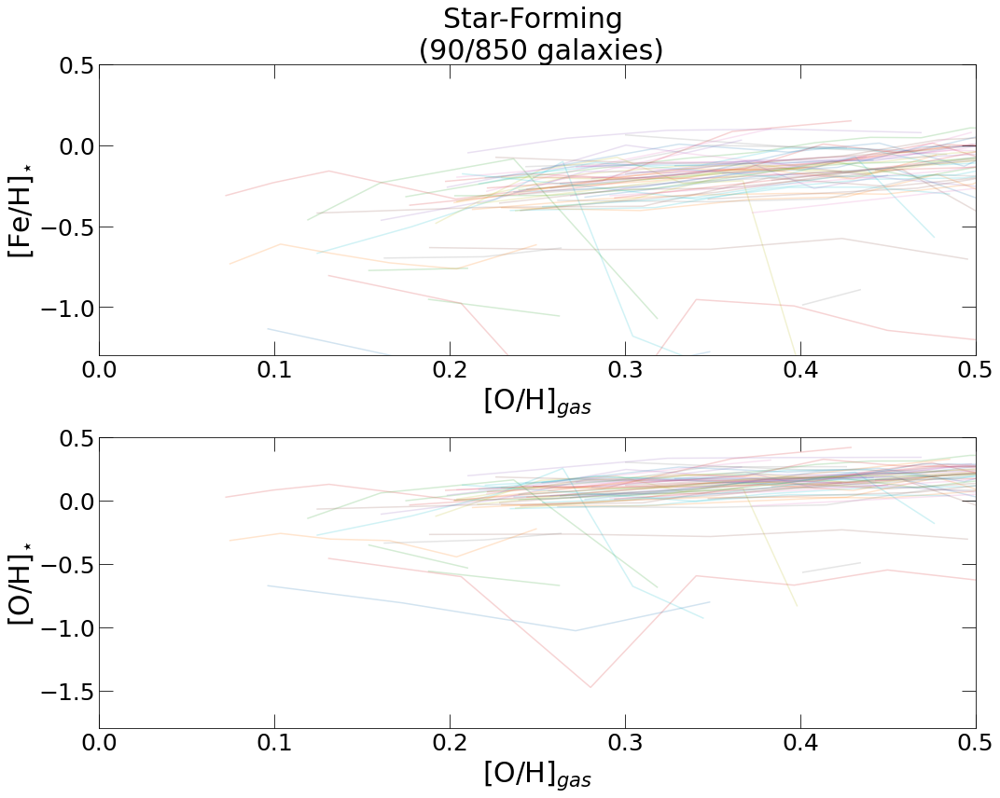

In [9]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 1, sharex='none', sharey='none', figsize=(15, 12), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap = plt.get_cmap('plasma')
# norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, FeH_star, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        OH_star = starmetals_only(id, redshift, 'oxygen', 'hydrogen')
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(Z_gas, FeH_star, 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(Z_gas, OH_star, 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(0, 0.5)
#     ax.set_xscale('log')
#     ax.set_xticks([0.2, 1, 10], minor=False)
#     ax.set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-1.3, 0.5)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
ax1.set_xlabel('[O/H]$_{gas}$', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[O/H]$_{\star}$", fontsize=fts)
ax2.set_xlabel('[O/H]$_{gas}$', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
# ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
# ax3.set_ylim(-1.3, 0.5)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax1.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

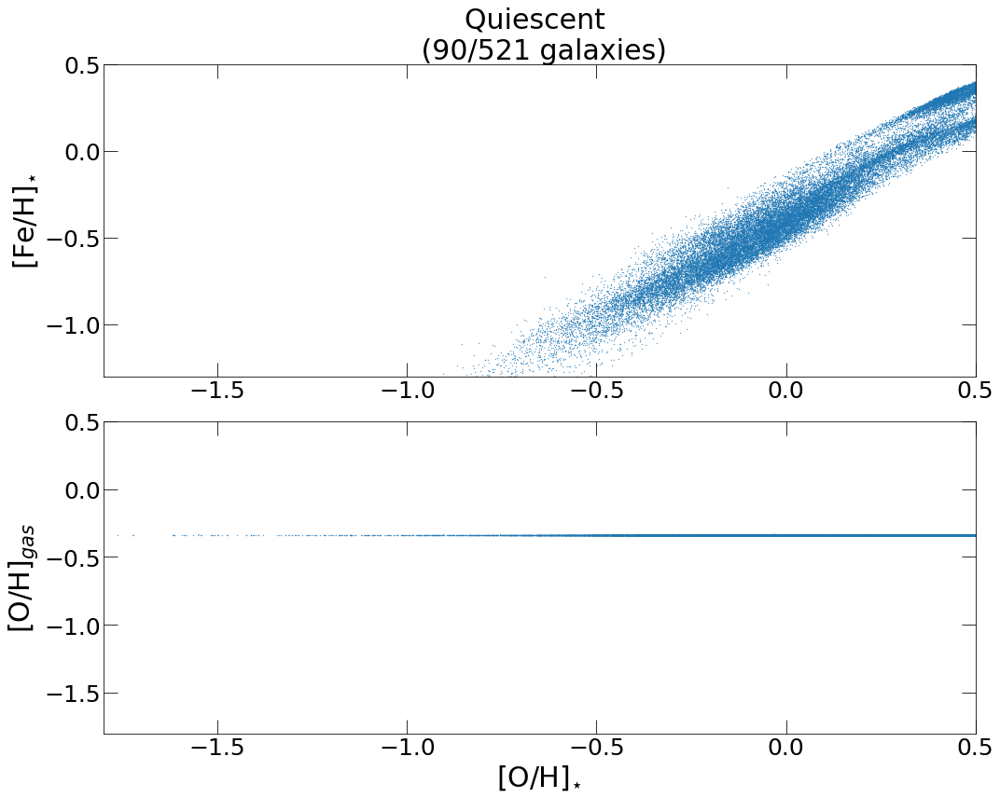

In [21]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 1, sharex='none', sharey='none', figsize=(15, 12), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap = plt.get_cmap('plasma')
# norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 1, replace=False):
    R, FeH_star, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        OH_star = starmetals_only(id, redshift, 'oxygen', 'hydrogen')
#         percentiles1 = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R, FeH_star, 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R, OH_star, 'median', bins=percentiles)
#         stat3, _, _ = scipy.stats.binned_statistic(R, Z_gas, 'median', bins=percentiles)
#         xx = percentiles[:-1]
#         ax1.plot(stat3[1:], stat1[1:], alpha = 0.2)
#         ax2.plot(stat3[1:], stat2[1:], alpha = 0.2)
        ax1.scatter(OH_star, FeH_star, s=0.1)
        ax2.scatter(OH_star, Z_gas, s=0.1)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(-1.8, 0.5)
#     ax.set_xscale('log')
#     ax.set_xticks([0.2, 1, 10], minor=False)
#     ax.set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-1.3, 0.5)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
# ax1.set_xlabel('[O/H]$_{gas}$', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[O/H]$_{gas}$", fontsize=fts)
ax2.set_xlabel('[O/H]$_{\star}$', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
# ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
# ax3.set_ylim(-1.3, 0.5)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax1.set_title('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

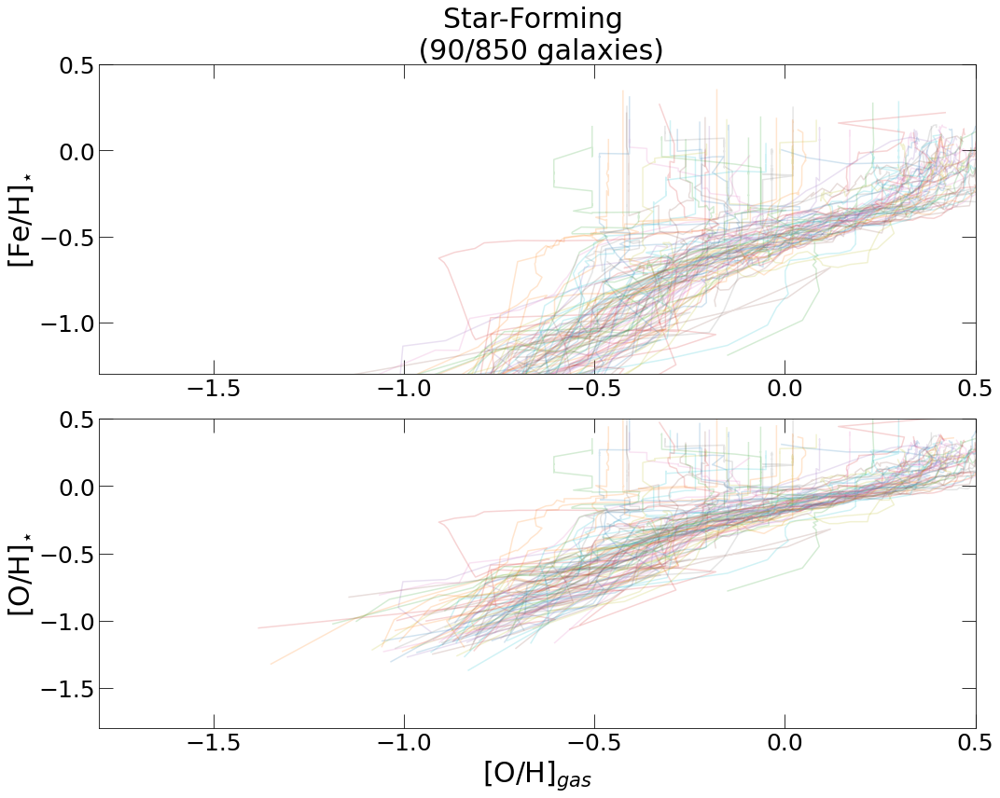

In [33]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 1, sharex='none', sharey='none', figsize=(15, 12), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap = plt.get_cmap('plasma')
# norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, FeH_star, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        OH_star = starmetals_only(id, redshift, 'oxygen', 'hydrogen')
        percentiles1 = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R, FeH_star, 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R, OH_star, 'median', bins=percentiles)
        stat3, _, _ = scipy.stats.binned_statistic(R, Z_gas, 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(stat3[1:], stat1[1:], alpha = 0.2)
        ax2.plot(stat3[1:], stat2[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(-1.8, 0.5)
#     ax.set_xscale('log')
#     ax.set_xticks([0.2, 1, 10], minor=False)
#     ax.set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-1.3, 0.5)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
# ax1.set_xlabel('[O/H]$_{gas}$', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[O/H]$_{\star}$", fontsize=fts)
ax2.set_xlabel('[O/H]$_{gas}$', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
# ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
# ax3.set_ylim(-1.3, 0.5)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax1.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

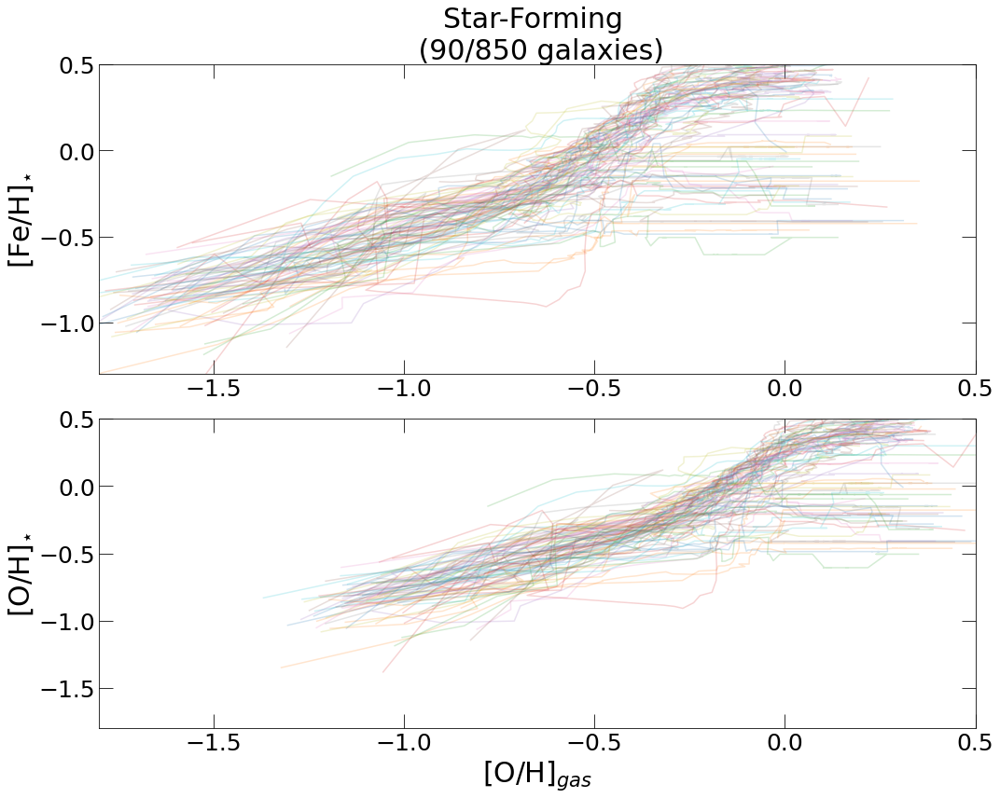

In [34]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 1, sharex='none', sharey='none', figsize=(15, 12), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap = plt.get_cmap('plasma')
# norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, FeH_star, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        OH_star = starmetals_only(id, redshift, 'oxygen', 'hydrogen')
        percentiles1 = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R, FeH_star, 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R, OH_star, 'median', bins=percentiles)
        stat3, _, _ = scipy.stats.binned_statistic(R, Z_gas, 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(stat1[1:], stat3[1:], alpha = 0.2)
        ax2.plot(stat2[1:], stat3[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(-1.8, 0.5)
#     ax.set_xscale('log')
#     ax.set_xticks([0.2, 1, 10], minor=False)
#     ax.set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-1.3, 0.5)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
# ax1.set_xlabel('[O/H]$_{gas}$', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[O/H]$_{\star}$", fontsize=fts)
ax2.set_xlabel('[O/H]$_{gas}$', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
# ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
# ax3.set_ylim(-1.3, 0.5)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax1.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

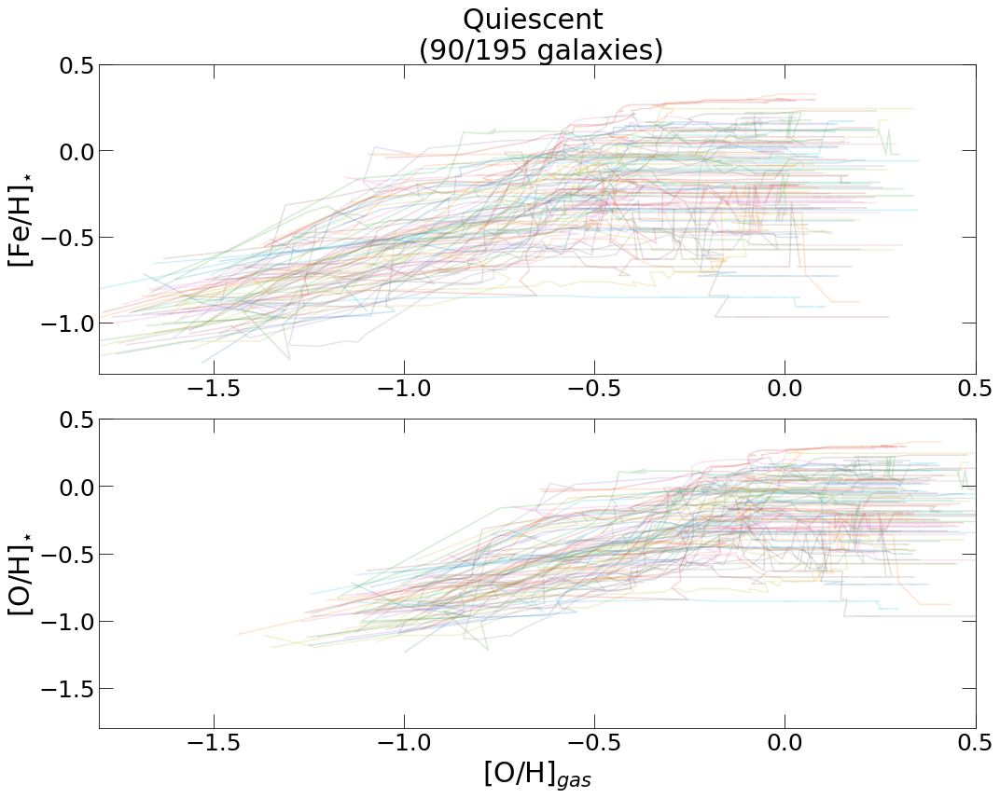

In [35]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 1, sharex='none', sharey='none', figsize=(15, 12), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

# colormap = plt.get_cmap('plasma')
# norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, FeH_star, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        OH_star = starmetals_only(id, redshift, 'oxygen', 'hydrogen')
        percentiles1 = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R, FeH_star, 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R, OH_star, 'median', bins=percentiles)
        stat3, _, _ = scipy.stats.binned_statistic(R, Z_gas, 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(stat1[1:], stat3[1:], alpha = 0.2)
        ax2.plot(stat2[1:], stat3[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(-1.8, 0.5)
#     ax.set_xscale('log')
#     ax.set_xticks([0.2, 1, 10], minor=False)
#     ax.set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-1.3, 0.5)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
# ax1.set_xlabel('[O/H]$_{gas}$', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[O/H]$_{\star}$", fontsize=fts)
ax2.set_xlabel('[O/H]$_{gas}$', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
# ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
# ax3.set_ylim(-1.3, 0.5)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax1.set_title('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

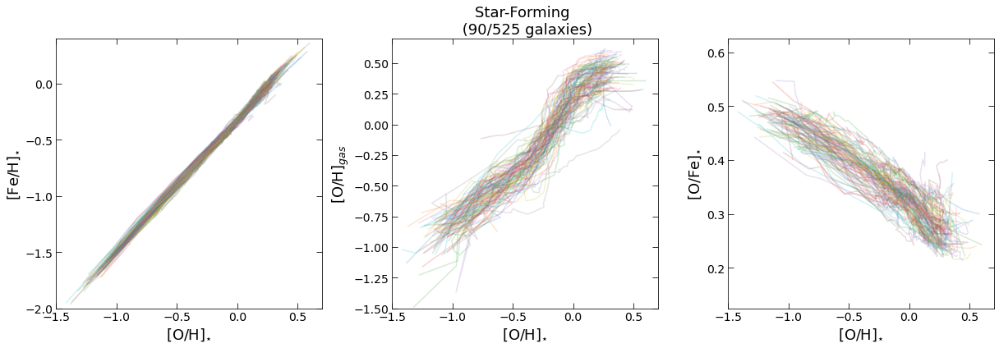

In [74]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(17, 6), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]

f.set_facecolor('w')
n_bins = 50
fts = 18
ftss = 14
vmin = 1.0

# colormap = plt.get_cmap('plasma')
# norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
big_OFe_star = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, _, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        FeH_star = starmetals_only(id, redshift, 'iron', 'hydrogen')
        OH_star = starmetals_only(id, redshift, 'oxygen', 'hydrogen')
        OFe_star = starmetals_only(id, redshift, 'oxygen', 'iron')
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R, FeH_star, 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R, OH_star, 'median', bins=percentiles)
        stat3, _, _ = scipy.stats.binned_statistic(R, Z_gas, 'median', bins=percentiles)
        stat4, _, _ = scipy.stats.binned_statistic(R, OFe_star, 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(stat2[1:], stat1[1:], alpha = 0.2)
        ax2.plot(stat2[1:], stat3[1:], alpha = 0.2)
        ax3.plot(stat2[1:], stat4[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(-1.5, 0.7)
#     ax.set_xscale('log')
#     ax.set_xticks([0.2, 1, 10], minor=False)
#     ax.set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=7)
    ax.tick_params(which='minor', length=4)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-2.0, 0.4)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
ax1.set_xlabel('[O/H]$_{\star}$', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.5, 0.7)
ax2.set_xlim(-1.5, 0.7)
ax2.set_xlabel("[O/H]$_{\star}$", fontsize=fts)
ax2.set_ylabel('[O/H]$_{gas}$', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("[O/H]$_{\star}$", fontsize=fts)
ax3.set_ylabel('[O/Fe]$_{\star}$', fontsize=fts)
ax3.set_ylim(0.125, 0.625)
ax3.set_xlim(-1.5,0.7)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES/stellarvgasstarforming.png', dpi=400)

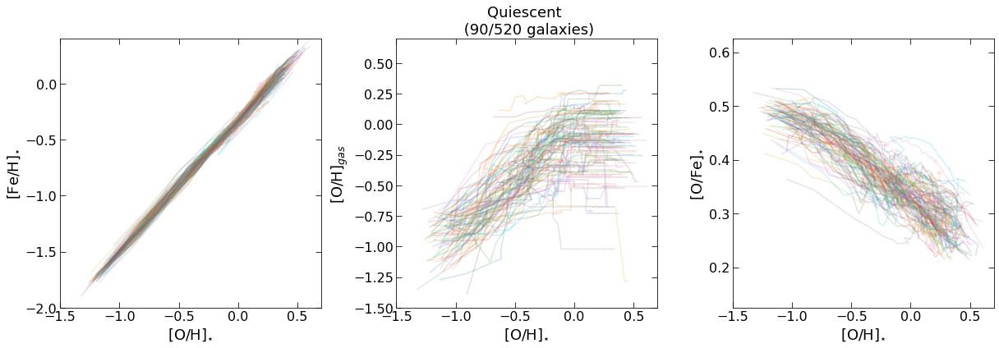

In [75]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(17, 6), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]

f.set_facecolor('w')
n_bins = 50
fts = 18
ftss = 16
vmin = 1.0

# colormap = plt.get_cmap('plasma')
# norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
big_OFe_star = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, _, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        FeH_star = starmetals_only(id, redshift, 'iron', 'hydrogen')
        OH_star = starmetals_only(id, redshift, 'oxygen', 'hydrogen')
        OFe_star = starmetals_only(id, redshift, 'oxygen', 'iron')
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R, FeH_star, 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R, OH_star, 'median', bins=percentiles)
        stat3, _, _ = scipy.stats.binned_statistic(R, Z_gas, 'median', bins=percentiles)
        stat4, _, _ = scipy.stats.binned_statistic(R, OFe_star, 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax1.plot(stat2[1:], stat1[1:], alpha = 0.2)
        ax2.plot(stat2[1:], stat3[1:], alpha = 0.2)
        ax3.plot(stat2[1:], stat4[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(-1.5, 0.7)
#     ax.set_xscale('log')
#     ax.set_xticks([0.2, 1, 10], minor=False)
#     ax.set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=7)
    ax.tick_params(which='minor', length=4)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-2.0, 0.4)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
ax1.set_xlabel('[O/H]$_{\star}$', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.5, 0.7)
ax2.set_xlim(-1.5, 0.7)
ax2.set_xlabel("[O/H]$_{\star}$", fontsize=fts)
ax2.set_ylabel('[O/H]$_{gas}$', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("[O/H]$_{\star}$", fontsize=fts)
ax3.set_ylabel('[O/Fe]$_{\star}$', fontsize=fts)
ax3.set_ylim(0.125, 0.625)
ax3.set_xlim(-1.5,0.7)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax2.set_title('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

plt.savefig('2022 FIGURES/stellarvgasquiescent.png', dpi=400)

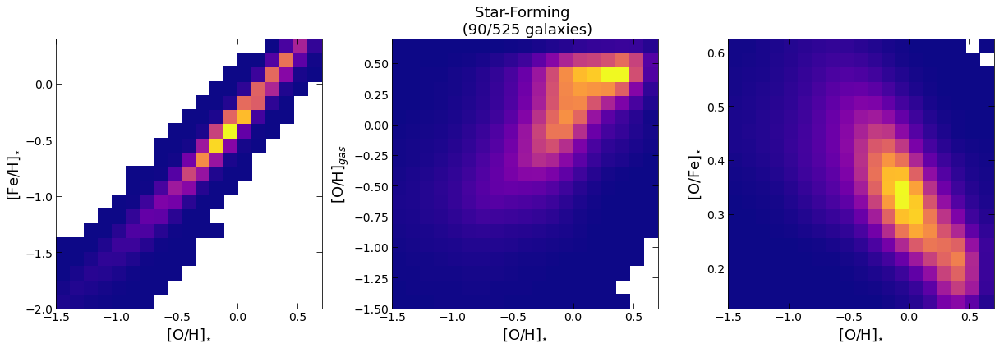

In [78]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(17, 6), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]

f.set_facecolor('w')
n_bins = 50
fts = 18
ftss = 14
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-1.5, 0.7, 20)
# x1bins = np.linspace(-2.0, 0.4, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
y1bins = np.linspace(-2.0, 0.4, 20)
y2bins = xbins
y3bins = np.linspace(0.125, 0.625, 20)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
# metalbins = np.linspace(-1.3, 0.5, 30)
# densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(y1bins)-1))
big_h2 = np.zeros((len(xbins)-1, len(y2bins)-1))
big_h3 = np.zeros((len(xbins)-1, len(y3bins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
big_OFe_star = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, _, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        FeH_star = starmetals_only(id, redshift, 'iron', 'hydrogen')
        OH_star = starmetals_only(id, redshift, 'oxygen', 'hydrogen')
        OFe_star = starmetals_only(id, redshift, 'oxygen', 'iron')
        h, _, _ = np.histogram2d(OH_star, FeH_star, bins=[xbins, y1bins], density=False)
        h2, _, _ = np.histogram2d(OH_star, Z_gas, bins=[xbins, y2bins], density=False)
        h3, _, _ = np.histogram2d(OH_star, OFe_star, bins=[xbins, y3bins], density=False)
        big_h += h
        big_h2 += h2
        big_h3 += h3
#         percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R, FeH_gas, 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R, OH_star, 'median', bins=percentiles)
#         stat3, _, _ = scipy.stats.binned_statistic(R, Z_gas, 'median', bins=percentiles)
#         stat4, _, _ = scipy.stats.binned_statistic(R, OFe_star, 'median', bins=percentiles)
#         xx = percentiles[:-1]
#         ax1.plot(stat2[1:], stat1[1:], alpha = 0.2)
#         ax2.plot(stat2[1:], stat3[1:], alpha = 0.2)
#         ax3.plot(stat2[1:], stat4[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# y1bins_new = y2bins_new = xbins_new
# y3bins_new = (y3bins[1:]+y3bins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, y1bins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(-1.5, 0.7)
#     ax.set_xscale('log')
#     ax.set_xticks([0.2, 1, 10], minor=False)
#     ax.set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=7)
    ax.tick_params(which='minor', length=4)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-2.0, 0.4)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
ax1.set_xlabel('[O/H]$_{\star}$', fontsize=fts)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, y2bins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.5, 0.7)
ax2.set_xlim(-1.5, 0.7)
ax2.set_xlabel("[O/H]$_{\star}$", fontsize=fts)
ax2.set_ylabel('[O/H]$_{gas}$', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, y3bins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("[O/H]$_{\star}$", fontsize=fts)
ax3.set_ylabel('[O/Fe]$_{\star}$', fontsize=fts)
ax3.set_ylim(0.125, 0.625)
ax3.set_xlim(-1.5,0.7)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

# plt.savefig('2022 FIGURES/stellarvgasstarforming.png', dpi=400)

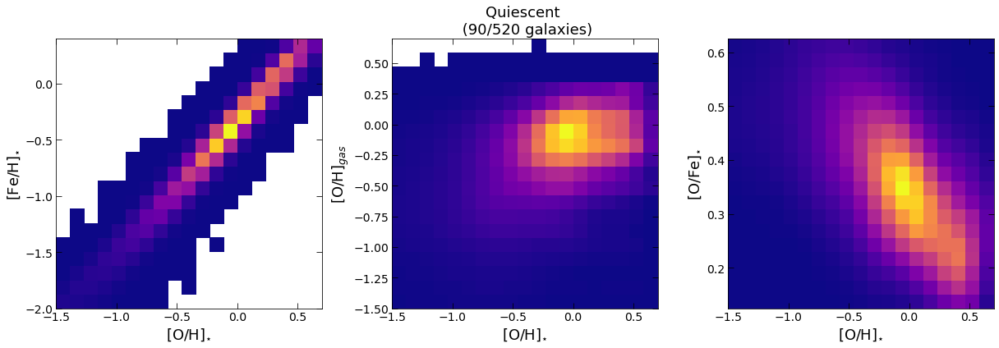

In [77]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(17, 6), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]

f.set_facecolor('w')
n_bins = 50
fts = 18
ftss = 14
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-1.5, 0.7, 20)
# x1bins = np.linspace(-2.0, 0.4, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
y1bins = np.linspace(-2.0, 0.4, 20)
y2bins = xbins
y3bins = np.linspace(0.125, 0.625, 20)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
# metalbins = np.linspace(-1.3, 0.5, 30)
# densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(y1bins)-1))
big_h2 = np.zeros((len(xbins)-1, len(y2bins)-1))
big_h3 = np.zeros((len(xbins)-1, len(y3bins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
big_OFe_star = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    R, _, Z_gas = stellar_gas_metallicities(id=id, redshift=redshift)
    if type(R) == int:
        pass
    else:
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
#         R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
#         big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#         h3, _, _ = np.histogram2d(np.log10(R/R_e), OH_gas, bins=[xbins, metalbins], density=False)
#         big_h3 += h3

        # calculate statistic for profile
        FeH_star = starmetals_only(id, redshift, 'iron', 'hydrogen')
        OH_star = starmetals_only(id, redshift, 'oxygen', 'hydrogen')
        OFe_star = starmetals_only(id, redshift, 'oxygen', 'iron')
        h, _, _ = np.histogram2d(OH_star, FeH_star, bins=[xbins, y1bins], density=False)
        h2, _, _ = np.histogram2d(OH_star, Z_gas, bins=[xbins, y2bins], density=False)
        h3, _, _ = np.histogram2d(OH_star, OFe_star, bins=[xbins, y3bins], density=False)
        big_h += h
        big_h2 += h2
        big_h3 += h3
#         percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R, FeH_gas, 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R, OH_star, 'median', bins=percentiles)
#         stat3, _, _ = scipy.stats.binned_statistic(R, Z_gas, 'median', bins=percentiles)
#         stat4, _, _ = scipy.stats.binned_statistic(R, OFe_star, 'median', bins=percentiles)
#         xx = percentiles[:-1]
#         ax1.plot(stat2[1:], stat1[1:], alpha = 0.2)
#         ax2.plot(stat2[1:], stat3[1:], alpha = 0.2)
#         ax3.plot(stat2[1:], stat4[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# y1bins_new = y2bins_new = xbins_new
# y3bins_new = (y3bins[1:]+y3bins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, y1bins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax.set_xlim(-1.5, 0.7)
#     ax.set_xscale('log')
#     ax.set_xticks([0.2, 1, 10], minor=False)
#     ax.set_xticklabels(['0.2', '1', '10'])
    ax.tick_params(which='major', length=7)
    ax.tick_params(which='minor', length=4)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-2.0, 0.4)
# ax1.set_yscale('log')
ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
ax1.set_xlabel('[O/H]$_{\star}$', fontsize=fts)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, y2bins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# for ax in axes:
#     ax[1].set_xlim(0, 0.5)
# #     ax[1].set_xscale('log')
# #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# #     ax[1].set_xticklabels(['0.2', '1', '10'])
#     ax[1].tick_params(which='major', length=15)
#     ax[1].tick_params(which='minor', length=8)
#     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.5, 0.7)
ax2.set_xlim(-1.5, 0.7)
ax2.set_xlabel("[O/H]$_{\star}$", fontsize=fts)
ax2.set_ylabel('[O/H]$_{gas}$', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, y3bins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0, 0.5)
# #     ax[2].set_xscale('log')
# #     ax[2].set_xticks([0.2, 1, 10], minor=False)
# #     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("[O/H]$_{\star}$", fontsize=fts)
ax3.set_ylabel('[O/Fe]$_{\star}$', fontsize=fts)
ax3.set_ylim(0.125, 0.625)
ax3.set_xlim(-1.5,0.7)
# # ax3.set_xscale('log')
# # ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

ax2.set_title('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

# plt.savefig('2022 FIGURES/stellarvgasstarforming.png', dpi=400)

## bimodal

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276 277 

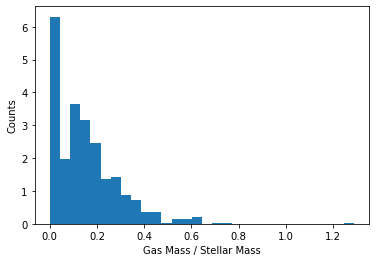

In [4]:
big_hist = []
i = 0
for id in np.random.choice(ids, 1000, replace=False):
    i += 1
    print(str(i), end=' ')
    mass_gas = 10**gas_mass(id=id, redshift=redshift)
    if mass_gas == 0:
        pass
    else:
        mass_star = 10**total_mass[ids==id] / 2
        big_hist.append(float(mass_gas / mass_star))
# print(big_hist)
plt.hist(big_hist, bins=30, density=True)
plt.xlabel('Gas Mass / Stellar Mass')
plt.ylabel('Counts')
plt.show()
    


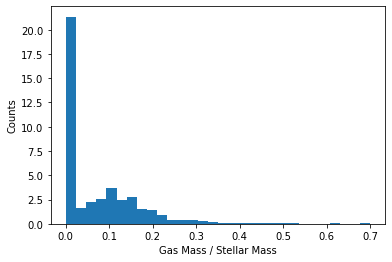

In [4]:
big_hist = gas_mass_1kpc / stellar_mass_1kpc
plt.hist(big_hist, bins=30, density=True)
plt.xlabel('Gas Mass / Stellar Mass')
plt.ylabel('Counts')
plt.show()
    


[-4.9        -0.8788853  -4.9        ... -0.95385641 -4.9
 -4.9       ]


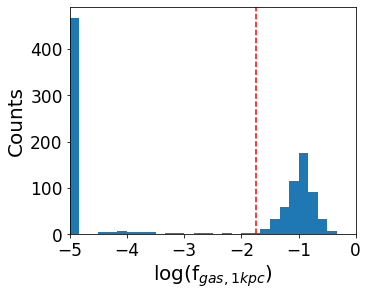

In [63]:
fig = plt.figure(1,figsize=(5,4), constrained_layout=True)
fig.clf()
fts = 20

big_hist = np.log10(gas_mass_1kpc / (gas_mass_1kpc + stellar_mass_1kpc))
# np.nan_to_num(big_hist, copy=False, nan=0.0, neginf=0.0)
big_hist[big_hist<-5] = -4.9
print(big_hist)
plt.hist(big_hist, bins=30, range=(-5.0, 0.0), density=False)
plt.axvline(x=-1.75, linestyle='--', color='r')
plt.xlabel('log(f$_{gas, 1kpc}$)', fontsize=fts)
plt.ylabel('Counts', fontsize=fts)
plt.tick_params(labelsize=fts-3)
plt.xlim(-5, 0)

plt.savefig('2022 FIGURES/bimodal.png', dpi=400)

plt.show()

testing bimodality criteria

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 

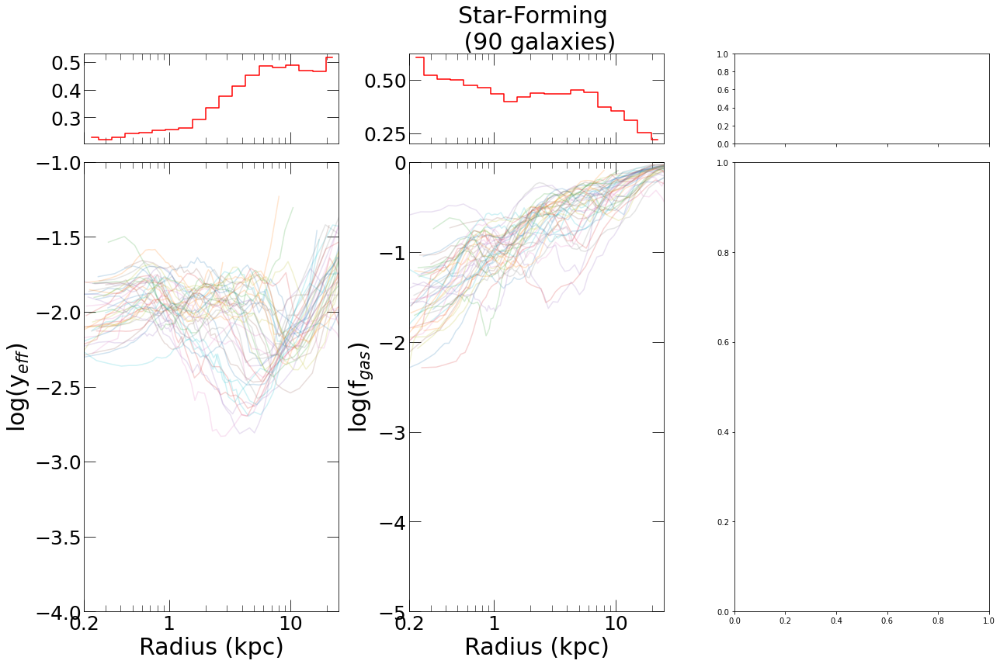

In [13]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-1.3, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
# big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
# big_OH_gas = np.zeros(0)
ii = 0
for id in np.random.choice(ids, 90, replace=False):
    ii += 1
    print(str(ii), end=' ')
    mass_gas = 10**gas_mass(id=id, redshift=redshift, limit=1)
    mass_star = 10**stellar_mass(id=id, redshift=redshift, limit=1)
    
    if mass_gas / mass_star < 0.025:
        pass
    else:
        R, f_gas, y_eff, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
        if type(R) == int:
            pass
        else:
#             OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
    #         R_e = halfmass_rad_stars(id, redshift)
            big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
            big_R = np.concatenate((big_R, R), axis=None)
            big_R_star = np.concatenate((big_R_star, R_star), axis=None)
            big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#             big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
#             h3, _, _ = np.histogram2d(R, OH_gas, bins=[xbins, metalbins], density=False)
#             big_h3 += h3

            # calculate statistic for profile
            n_bins = 50
            percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
            for i in range(1, (n_bins+1)):
                percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
            percentiles.sort()
            stat1, _, _ = scipy.stats.binned_statistic(R_star, np.log10(y_eff), 'median', bins=percentiles)
            stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
            xx = percentiles[:-1]
            ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
            ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(-4, -1)
# ax1.set_yscale('log')
ax1.set_ylabel("log(y$_{eff}$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-5, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# # ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax[2].set_xlim(0.2, 25)
#     ax[2].set_xscale('log')
#     ax[2].set_xticks([0.2, 1, 10], minor=False)
#     ax[2].set_xticklabels(['0.2', '1', '10'])
#     ax[2].tick_params(which='major', length=15)
#     ax[2].tick_params(which='minor', length=8)
#     ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xlabel("Radius (kpc)", fontsize=fts)
# ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
# ax3.set_ylim(-1.3, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Star-Forming \n (90 galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

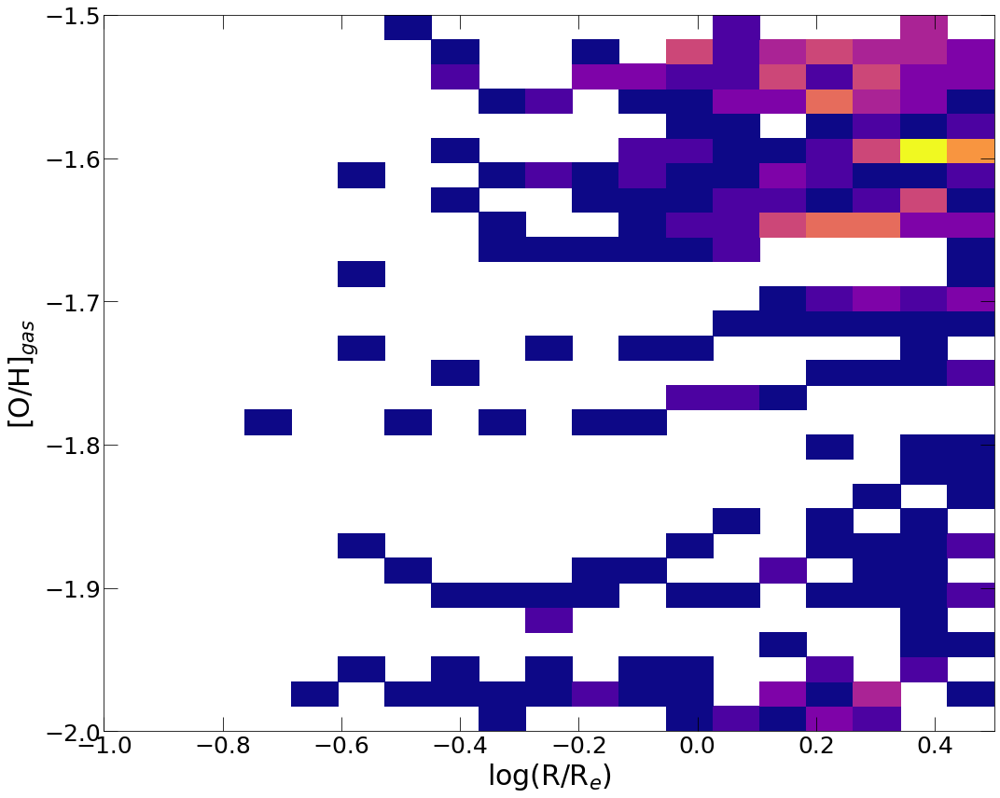

In [4]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(15, 12), constrained_layout=True)
ax3 = axes
# ax2 = axes[1]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-1.0, 0.5, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-2.0, -1.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_y_eff = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids, 90, replace=False):
    log_gas_mass, R, xx = bimodal_check(id=id, redshift=redshift)
    mass_star = float(total_mass[ids==id])
    if type(R) == int:
        pass
    else:
        gas_per_star = log_gas_mass - mass_star
#         print(gas_per_star)
#         OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True)
        R_e = halfmass_rad_stars(id, redshift)
#         big_y_eff = np.concatenate((big_y_eff, np.log10(y_eff)), axis=None)
        big_R = np.concatenate((big_R, np.log10(xx/R_e)), axis=None)
#         big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
#         big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
#         big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, _, _ = np.histogram2d(np.log10(xx/R_e), log_gas_mass-mass_star, bins=[xbins, metalbins], density=False)
        big_h3 += h3

        # calculate statistic for profile
#         percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
#         for i in range(1, (n_bins+1)):
#             percentiles[i] = np.percentile(R, (100/n_bins)*i)
#         percentiles.sort()
#         stat1, _, _ = scipy.stats.binned_statistic(R, Z_star, 'median', bins=percentiles)
#         stat2, _, _ = scipy.stats.binned_statistic(R, Z_gas, 'median', bins=percentiles)
#         xx = percentiles[:-1]
#         ax1.plot(xx[1:], stat1[1:], alpha = 0.2)
#         ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
# xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

# stat1, _, _ = stats.binned_statistic(big_R_star, big_y_eff, 'std', bins=xbins)
# stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
# stat3, _, _ = stats.binned_statistic(big_R, big_OH_gas, 'std', bins=xbins)

# sc1.step(xbins_new, stat1, 'r', where='mid')
# sc2.step(xbins_new, stat2, 'r', where='mid')
# sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
# for ax in axes:
#     ax.set_xlim(0.2, 25)
#     ax.set_xscale('log')
#     ax.set_xticks([0.2, 1, 10], minor=False)
#     ax.set_xticklabels(['0.2', '1', '10'])
#     ax.tick_params(which='major', length=15)
#     ax.tick_params(which='minor', length=8)
#     ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_ylim(-1.3, 0.5)
# # ax1.set_yscale('log')
# ax1.set_ylabel("[Fe/H]$_{\star}$", fontsize=fts)
# ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# # big_h2[big_h2==0] = np.nan
# # color=colormap(norm(big_h2)).tolist()
# # color = tuple(color[0][:])
# # ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
# # for ax in axes:
# #     ax[1].set_xlim(0, 0.5)
# # #     ax[1].set_xscale('log')
# # #     ax[1].set_xticks([0.2, 1, 10], minor=False)
# # #     ax[1].set_xticklabels(['0.2', '1', '10'])
# #     ax[1].tick_params(which='major', length=15)
# #     ax[1].tick_params(which='minor', length=8)
# #     ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_ylim(-1.8, 0.5)
# ax2.set_ylabel("[O/H]$_{gas}$", fontsize=fts)
# ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(-1, 0.5)
#     ax[2].set_xscale('log')
#     ax[2].set_xticks([0.2, 1, 10], minor=False)
#     ax[2].set_xticklabels(['0.2', '1', '10'])
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax3.set_ylim(-2.0, -1.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

# ax1.set_title('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)

# for ax in axes[0]:
#     ax.set_xticklabels([])

f.tight_layout()

## divide

In [ ]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
import matplotlib.patheffects as mpe

outline=mpe.withStroke(linewidth=5, foreground='white')

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(100), 20)
densitybins = np.linspace(1.5, 12, 30)
fgasbins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
# metalbins = np.linspace(-1.3, 0.5, 30)
# densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(densitybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(densitybins)-1))
# big_h3 = np.zeros((len(xbins)-1, len(fgasbins)-1))
big_rho_star = np.zeros(0)
big_R_gas = np.zeros(0)
big_f_gas = np.zeros(0)
big_rho_gas = np.zeros(0)
big_R_star = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R_gas, f_gas, _, _ = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R_gas) == int:
        pass
    else:
        R_e = halfmass_rad_stars(id, redshift)
        R_star, _, rho_star, rho_gas = stellar_gas_densities(id=id, redshift=redshift, follow_stars=True)
    #     Z_gas = np.log10(Z_gas / 0.0127)
        big_rho_star = np.concatenate((big_rho_star, np.log10(rho_star)), axis=None)
        big_rho_gas = np.concatenate((big_rho_gas, np.log10(rho_gas)), axis=None)
        big_R_star = np.concatenate((big_R_star, np.log10(R_star/R_e)), axis=None)
        big_R_gas = np.concatenate((big_R_gas, np.log10(R_gas/R_e)), axis=None)
        big_f_gas = np.concatenate((big_f_gas, f_gas), axis=None)
        h, _, _ = np.histogram2d(np.log10(R_star/R_e), np.log10(rho_star), bins=[xbins, densitybins], density=False)#, len(percentiles))
        h2, _, _ = np.histogram2d(np.log10(R_star/R_e), np.log10(rho_gas), bins=[xbins, densitybins], density=False)
#         h3, _, _ = np.histogram2d(R, logOH, bins=[xbins, metalbins], density=False)
#         big_h3 += h3
        big_h2 += h2
        big_h += h 
    #     number = id
    
        # calculate statistic for profile
        n_bins = 50
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(np.log10(R_star), (100/n_bins)*i)
        percentiles.sort()

    #     stat1, _, _ = scipy.stats.binned_statistic(R, np.log10(y_eff), 'median', bins=percentiles)
        stat3, _, _ = scipy.stats.binned_statistic(np.log10(R_star), f_gas, 'median', bins=percentiles)
        xx = percentiles[:-1]
        ax3.plot(xx[1:], stat3[1:], alpha = 0.2)
    #     ax2.plot(xx[1:], stat2[1:], alpha = 0.2)

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_rho_star, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_rho_gas, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(xbins_new, stat3, 'r', where='mid')

# plot big pixel maps
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, densitybins, big_h.T, cmap='plasma', color=color, edgecolor=None)

med1, _, _ = stats.binned_statistic(big_R_star, big_rho_star, 'median', bins=xbins)
b1, m1 = np.polyfit(xbins[:-1], med1, 1)
print('log(star density) = ' + str(m1) + '*log(R) + ' + str(b1))
ax1.plot(np.unique(xbins[:-1]), np.poly1d(np.polyfit(xbins[:-1], med1, 1))(np.unique(xbins[:-1])), 'r', path_effects=[outline])
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(-0.52, 1.94)
#     ax[0].set_xscale('log')
#     ax[0].set_xticks([0.2, 1, 10, 100], minor=False)
#     ax[0].set_xticklabels(['0.2', '1', '10', '100'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(1.5, 12)
# ax1.set_yscale('log')
ax1.set_xlabel('log(R/kpc)', fontsize=fts)
ax1.set_ylabel('log Density$_\star$ / (M$_\odot$/kpc$^3$)', fontsize=fts)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, densitybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)

med2, _, _ = stats.binned_statistic(big_R_star, big_rho_gas, 'median', bins=xbins)
b2, m2 = np.polyfit(xbins[:-1], med2, 1)
print('log(gas density) = ' + str(m2) + '*log(R) + ' + str(b2))
ax2.plot(np.unique(xbins[:-1]), np.poly1d(np.polyfit(xbins[:-1], med2, 1))(np.unique(xbins[:-1])), 'r', path_effects=[outline])
for ax in axes:
    ax[1].set_xlim(-0.52, 1.94)
#     ax[1].set_xscale('log')
#     ax[1].set_xticks([0.2, 1, 10, 100], minor=False)
#     ax[1].set_xticklabels(['0.2', '1', '10', '100'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(1.5, 12)
ax2.set_ylabel('log Density$_{gas}$ / (M$_\odot$/kpc$^3$)', fontsize=fts)
ax2.set_xlabel('log(R/kpc)', fontsize=fts)

# big_h3[big_h3==0] = np.nan
# color=colormap(norm(big_h3)).tolist()
# color = tuple(color[0][:])
# ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(-0.52, 1.94)
#     ax[2].set_xscale('log')
#     ax[2].set_xticks([0.2, 1, 10, 100], minor=False)
#     ax[2].set_xticklabels(['0.2', '1', '10', '100'])
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel('log(R/kpc)', fontsize=fts)
ax3.set_ylabel('f$_{gas}$', fontsize=fts)
ax3.set_ylim(0, 1)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

# log_model_star = np.log10(np.array(xbins))*m1 + b1
# log_model_gas = np.log10(np.array(xbins))*m2 + b2
def model_f(x):
#     x = 10**x
    model_star = b1 + x*m1
    model_gas = b2 + x*m2
#     f = model_gas / (model_gas + model_star)
#     log_model_star = np.array(xbins)*m1 + b1
#     log_model_gas = np.array(xbins)*m2 + b2
#     f = 10**model_gas / (10**model_gas + 10**model_star)
    f = 1 / (1 + 10**(model_star-model_gas))
    return f
# model_star = 10**b1 + xbins**m1
# model_gas = 10**b2 + xbins**m2
# model_f = 10**model_gas / (10**model_gas + 10**model_star)
# model_f = model_gas / (model_gas + model_star)
ax3.plot(xbins, model_f(xbins), 'r-', path_effects=[outline])

sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

# profiles

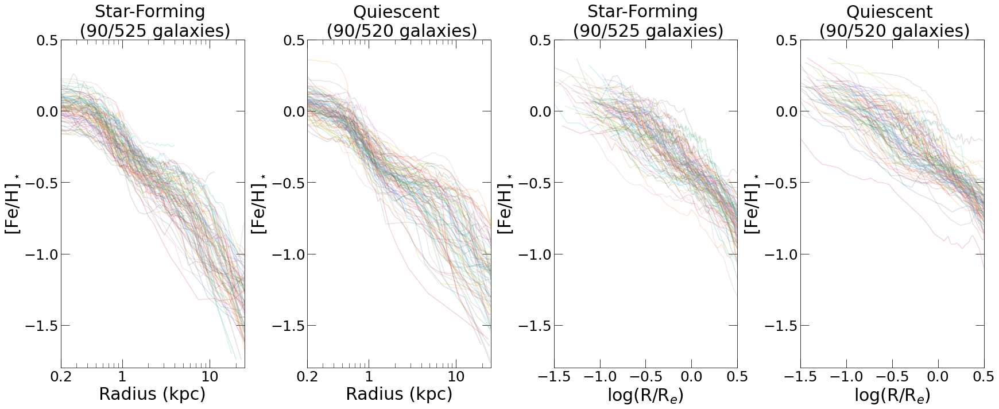

In [79]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

#z=2 star-forming galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    yy, metallicity, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
ax1.set_title('Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlabel("Radius (kpc)", fontsize=fts)
ax1.set_ylabel('[Fe/H]$_\star$', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    yy, metallicity, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
ax2.set_title('Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts)
ax2.set_xlim(0.2, 25)
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlabel("Radius (kpc)", fontsize=fts)
ax2.set_ylabel('[Fe/H]$_\star$', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#effective radius star-forming
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    yy, metallicity, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    Re = halfmass_radius[ids==id]
#     big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax3.plot(np.log10(xx/Re), yy, alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
ax3.set_title('Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(-1.5, 0.5)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]$_\star$', fontsize=fts)
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

#effective radius quiescent
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    yy, metallicity, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    Re = halfmass_radius[ids==id]
#     big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax4.plot(np.log10(xx/Re), yy, alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
ax4.set_title('Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts) #
ax4.set_xlim(-1.5, 0.5)
ax4.set_ylim(-1.8, 0.5)
ax4.set_xlabel("log(R/R$_e$)", fontsize=fts)
ax4.set_ylabel('[Fe/H]$_\star$', fontsize=fts)
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

plt.savefig('2022 FIGURES\profiles.png', dpi=100)

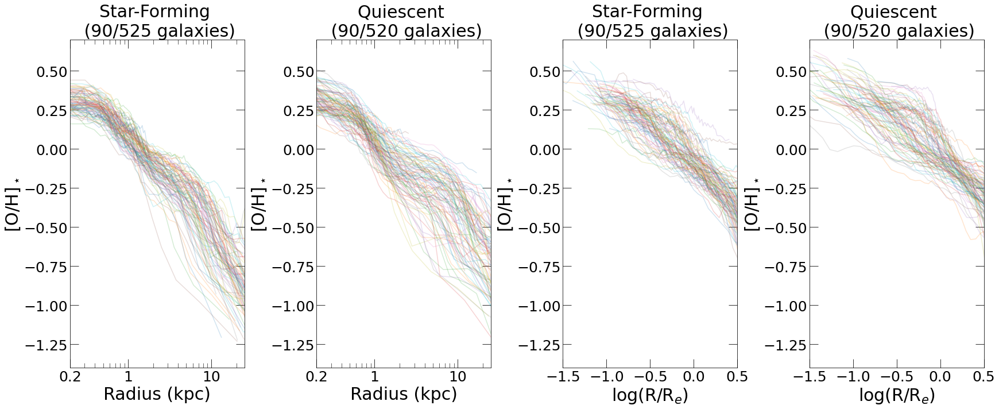

In [80]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

#z=2 star-forming galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    yy, metallicity, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='hydrogen')
#     big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
ax1.set_title('Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.4, 0.7)
ax1.set_xlabel("Radius (kpc)", fontsize=fts)
ax1.set_ylabel('[O/H]$_\star$', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    yy, metallicity, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='hydrogen')
#     big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
ax2.set_title('Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts)
ax2.set_xlim(0.2, 25)
ax2.set_ylim(-1.4, 0.7)
ax2.set_xlabel("Radius (kpc)", fontsize=fts)
ax2.set_ylabel('[O/H]$_\star$', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#effective radius star-forming
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    yy, metallicity, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='hydrogen')
    Re = halfmass_radius[ids==id]
#     big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax3.plot(np.log10(xx/Re), yy, alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
ax3.set_title('Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(-1.5, 0.5)
ax3.set_ylim(-1.4, 0.7)
ax3.set_xlabel("log(R/R$_e$)", fontsize=fts)
ax3.set_ylabel('[O/H]$_\star$', fontsize=fts)
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

#effective radius quiescent
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    yy, metallicity, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='hydrogen')
    Re = halfmass_radius[ids==id]
#     big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax4.plot(np.log10(xx/Re), yy, alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
ax4.set_title('Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts) #
ax4.set_xlim(-1.5, 0.5)
ax4.set_ylim(-1.4, 0.7)
ax4.set_xlabel("log(R/R$_e$)", fontsize=fts)
ax4.set_ylabel('[O/H]$_\star$', fontsize=fts)
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

plt.savefig('2022 FIGURES\profilesOH.png', dpi=100)

# gas consumption

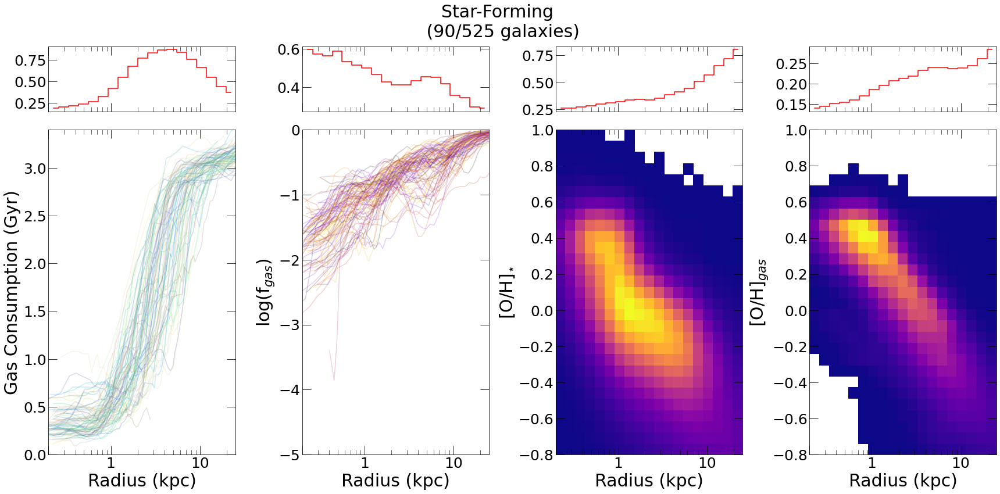

In [14]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange

#metallicity profiles
f, (axes) = plt.subplots(2, 4, sharex='none', sharey='none', figsize=(24, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
ax4 = axes[1][3]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]
sc4 = axes[0][3]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap1 = plt.get_cmap('terrain')
colormap2 = plt.get_cmap('gnuplot')
norm = colors.Normalize(vmin=0, vmax=30)
colormap = plt.get_cmap('plasma')
norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-0.8, 1, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_gas = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    R, f_gas, _, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:
        pass
    else:
        gas_con, _ = gas_consumption(id=id, redshift=redshift, follow_stars=True)
        OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
        OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
#         R_e = halfmass_rad_stars(id, redshift)
        big_gas = np.concatenate((big_gas, gas_con*10**-9), axis=None)
        big_R = np.concatenate((big_R, R), axis=None)
        big_R_star = np.concatenate((big_R_star, R_star), axis=None)
        big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
        big_OH_star = np.concatenate((big_OH_star, OH_star), axis=None)
        big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
        h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
        big_h3 += h3
        h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
        big_h4 += h4

        # calculate statistic for profile
        n_bins = 50
        percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
        for i in range(1, (n_bins+1)):
            percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
        percentiles.sort()
        stat1, _, _ = scipy.stats.binned_statistic(R_star, gas_con*10**-9, 'median', bins=percentiles)
        stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
        xx = percentiles[:-1]
        
        number = randrange(30)
        color1 = colormap1(norm(number))
#         color1 = tuple(color1[0][:])
        color2 = colormap2(norm(number))
#         color2 = tuple(color2[0][:])
        ax1.plot(xx[1:], stat1[1:], color=color1, alpha = 0.2)
        ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_gas, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_R_star, big_OH_star, 'std', bins=xbins)
stat4, _, _ = stats.binned_statistic(big_R_star, big_OH_gas, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(xbins_new, stat3, 'r', where='mid')
sc4.step(xbins_new, stat4, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(0, 3.4)
# ax1.set_yscale('log')
ax1.set_ylabel("Gas Consumption (Gyr)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-5, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm_plasma(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(0.2, 25)
    ax[2].set_xscale('log')
    ax[2].set_xticks([0.2, 1, 10], minor=False)
    ax[2].set_xticklabels(['', '1', '10'])
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{\star}$', fontsize=fts)
ax3.set_ylim(-0.8, 1)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h4[big_h4==0] = np.nan
color=colormap(norm_plasma(big_h4)).tolist()
color = tuple(color[0][:])
ax4.pcolormesh(xbins, metalbins, big_h4.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[3].set_xlim(0.2, 25)
    ax[3].set_xscale('log')
    ax[3].set_xticks([0.2, 1, 10], minor=False)
    ax[3].set_xticklabels(['', '1', '10'])
    ax[3].tick_params(which='major', length=15)
    ax[3].tick_params(which='minor', length=8)
    ax[3].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax4.set_ylim(-0.8, 1)

f.suptitle('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

# plt.savefig('2022 FIGURES\yeff.png', dpi=100)

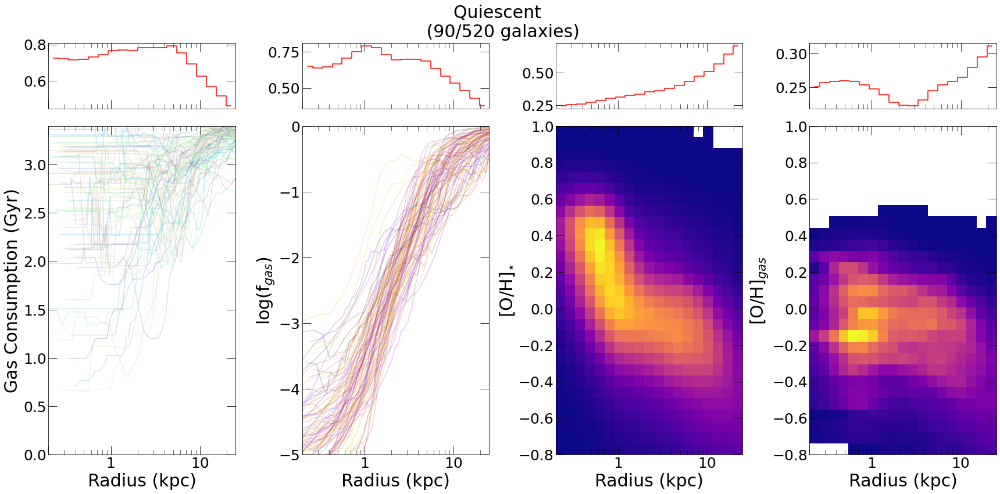

In [11]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from random import randrange

#metallicity profiles
f, (axes) = plt.subplots(2, 4, sharex='none', sharey='none', figsize=(24, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
ax4 = axes[1][3]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]
sc4 = axes[0][3]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap1 = plt.get_cmap('terrain')
colormap2 = plt.get_cmap('gnuplot')
norm = colors.Normalize(vmin=0, vmax=30)
colormap = plt.get_cmap('plasma')
norm_plasma = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(0, 1, 30)
# yeffbins = np.logspace(np.log10(1e-8), np.log10(1e-1), 30)
metalbins = np.linspace(-0.8, 1, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
# big_h = np.zeros((len(xbins)-1, len(yeffbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(ybins)-1))
big_h3 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h4 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_gas = np.zeros(0)
big_R = np.zeros(0)
big_R_star = np.zeros(0)
big_f_gas = np.zeros(0)
big_OH_star = np.zeros(0)
big_OH_gas = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 91, replace=False):
#     print(id)
    R, f_gas, _, R_star = effective_yield(id=id, redshift=redshift, follow_stars=True)
    if type(R) == int:# or id == 44673:
        pass
    else:
        gas_con, _ = gas_consumption(id=id, redshift=redshift, follow_stars=True)
        if type(gas_con) == int:
            pass
        else:
            OH_star = starmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen')
            OH_gas = gasmetals_only(id=id, redshift=redshift, num='oxygen', den='hydrogen', solar_units=True, follow_star=True)
    #         R_e = halfmass_rad_stars(id, redshift)
            big_gas = np.concatenate((big_gas, gas_con*10**-9), axis=None)
            big_R = np.concatenate((big_R, R), axis=None)
            big_R_star = np.concatenate((big_R_star, R_star), axis=None)
            big_f_gas = np.concatenate((big_f_gas, np.log10(f_gas)), axis=None)
            big_OH_star = np.concatenate((big_OH_star, OH_star), axis=None)
            big_OH_gas = np.concatenate((big_OH_gas, OH_gas), axis=None)
            h3, _, _ = np.histogram2d(R_star, OH_star, bins=[xbins, metalbins], density=False)
            big_h3 += h3
            h4, _, _ = np.histogram2d(R_star, OH_gas, bins=[xbins, metalbins], density=False)
            big_h4 += h4

            # calculate statistic for profile
            n_bins = 50
            percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
            for i in range(1, (n_bins+1)):
                percentiles[i] = np.percentile(R_star, (100/n_bins)*i)
            percentiles.sort()
#             print(R_star)
#             print(gas_con*10**-9)
            stat1, _, _ = scipy.stats.binned_statistic(R_star, gas_con*10**-9, 'median', bins=percentiles)
            stat2, _, _ = scipy.stats.binned_statistic(R_star, np.log10(f_gas), 'median', bins=percentiles)
            xx = percentiles[:-1]

            number = randrange(30)
            color1 = colormap1(norm(number))
    #         color1 = tuple(color1[0][:])
            color2 = colormap2(norm(number))
    #         color2 = tuple(color2[0][:])
            ax1.plot(xx[3:], stat1[3:], color=color1, alpha = 0.2)
            ax2.plot(xx[1:], stat2[1:], color=color2, alpha = 0.2)

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
# densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
# ybins_new = (ybins[1:]+ybins[:-1])/2
# yeffbins_new = (yeffbins[1:]+yeffbins[:-1])/2
# metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R_star, big_gas, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R_star, big_f_gas, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_R_star, big_OH_star, 'std', bins=xbins)
stat4, _, _ = stats.binned_statistic(big_R_star, big_OH_gas, 'std', bins=xbins)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(xbins_new, stat3, 'r', where='mid')
sc4.step(xbins_new, stat4, 'r', where='mid')

# plot big pixel maps
# big_h[big_h==0] = np.nan
# color=colormap(norm(big_h)).tolist()
# color = tuple(color[0][:])
# ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(0, 3.4)
# ax1.set_yscale('log')
ax1.set_ylabel("Gas Consumption (Gyr)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

# big_h2[big_h2==0] = np.nan
# color=colormap(norm(big_h2)).tolist()
# color = tuple(color[0][:])
# ax2.pcolormesh(xbins, ybins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-5, 0)
ax2.set_ylabel("log(f$_{gas}$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm_plasma(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(xbins, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(0.2, 25)
    ax[2].set_xscale('log')
    ax[2].set_xticks([0.2, 1, 10], minor=False)
    ax[2].set_xticklabels(['', '1', '10'])
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[O/H]$_{\star}$', fontsize=fts)
ax3.set_ylim(-0.8, 1)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h4[big_h4==0] = np.nan
color=colormap(norm_plasma(big_h4)).tolist()
color = tuple(color[0][:])
ax4.pcolormesh(xbins, metalbins, big_h4.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[3].set_xlim(0.2, 25)
    ax[3].set_xscale('log')
    ax[3].set_xticks([0.2, 1, 10], minor=False)
    ax[3].set_xticklabels(['', '1', '10'])
    ax[3].tick_params(which='major', length=15)
    ax[3].tick_params(which='minor', length=8)
    ax[3].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[O/H]$_{gas}$', fontsize=fts)
ax4.set_ylim(-0.8, 1)

f.suptitle('Quiescent \n (90/' + str(len(ids[quiescent_selection])) + ' galaxies)', fontsize=fts)
# sc2.set_title('Star-Forming \n (90/' + str(len(ids[starforming_selection])) + ' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

# plt.savefig('2022 FIGURES\yeff.png', dpi=100)